## 🏆 HPO 최적화 결과 요약

### 📊 최종 우승자: TPE Sampler

두 지표 모두 **TPE (Tree-structured Parzen Estimator)**가 **QMC (Quasi-Monte Carlo)**보다 우수한 성능을 보였습니다.

---

### 🔬 TPC 기반 라벨링 최적화

| **항목**         | **최적값**         | **비고**                       |
|------------------|--------------------|--------------------------------|
| **Best Score**   | `275.963`          | TPE가 QMC 대비 4.815 우수      |
| **Best TPC Low** | `4.369`            | 신선 임계값 (Fresh < 4.369)    |
| **Best TPC High**| `6.427`            | 부패 임계값 (Decay ≥ 6.427)    |

#### 📈 최종 라벨 분포 (TPC)
- **Fresh (신선)**: 154개 (57.0%)
- **Decay (부패)**: 35개 (13.0%)
- **Middle (중간)**: 81개 (30.0%)

---

### 🧪 TBARS 기반 라벨링 최적화

| **Metric**        | **TPE**    | **QMC**    |
|-------------------|------------|------------|
| Best Score        | 300.000    | 300.000    |
| Mean Score        | 270.031    | 117.692    |
| Std Score         | 70.069     | 80.349     |
| Best TBARS Low    | 0.187      | 0.187      |
| Best TBARS High   | 0.301      | 0.298      |
| Runtime (s)       | ~500 trials| 1.4        |

🏆 **최종 승자:** TPE  
**성능 향상:** 0.000

#### 📈 최종 라벨 분포 (TBARS)
- **Fresh (신선)**: 39개 (14.4%)
- **Decay (부패)**: 96개 (35.6%)
- **Middle (중간)**: 135개 (50.0%)

---

### 📋 메모용 요약표

| **지표** | **Best Score** | **Low Threshold** | **High Threshold** |
|----------|---------------|-------------------|-------------------|
| **TPC**  | 275.963       | 4.369             | 6.427             |
| **TBARS**| 300.000       | 0.187             | 0.298             |

---

> **결론:** TPE가 TPC 기준에서 QMC 대비 더 우수한 성능을 보였으며, TBARS 기준에서는 두 방법 모두 동일한 최고 점수를 기록했습니다.

## .pkl 파일 불러오기

In [1]:
import pickle
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from IPython.display import display
import os

# 전처리된 데이터 불러오기
save_dir = "/Users/taehokim/lab/BRL_AI/BRL_final/CLR_pkl" 

print("=== 전처리된 데이터 불러오기 ===")

# 1. 최종 데이터만 불러오기 (final_taxonomic_levels)
all_data_path = os.path.join(save_dir, "all_preprocessed_data.pkl")

if os.path.exists(all_data_path):
    with open(all_data_path, 'rb') as f:
        preprocessed_data = pickle.load(f)
    final_taxonomic_levels = preprocessed_data['final_taxonomic_levels']
    print(f"✅ 최종 데이터 로드 완료")
    print(f"총 taxonomy level 수: {len(final_taxonomic_levels)}")
else:
    print(f"❌ 통합 데이터 파일을 찾을 수 없습니다: {all_data_path}")

# 2. ANOVA 결과 불러오기
anova_results_path = os.path.join(save_dir, "anova_results.pkl")
if os.path.exists(anova_results_path):
    with open(anova_results_path, 'rb') as f:
        anova_results = pickle.load(f)
    print(f"✅ ANOVA 결과 로드 완료")
else:
    print(f"❌ ANOVA 결과 파일을 찾을 수 없습니다: {anova_results_path}")

# 3. 변화량 분석 결과 불러오기
change_analysis_path = os.path.join(save_dir, "change_analysis_results.pkl")
if os.path.exists(change_analysis_path):
    with open(change_analysis_path, 'rb') as f:
        change_analysis_results = pickle.load(f)
    print(f"✅ 변화량 분석 결과 로드 완료")
else:
    print(f"❌ 변화량 분석 결과 파일을 찾을 수 없습니다: {change_analysis_path}")

# 4. 전처리된 TBARS 데이터 불러오기 (추가)
tbars_preprocessed_path = os.path.join(save_dir, "tbars_preprocessed_info.pkl")
if os.path.exists(tbars_preprocessed_path):
    with open(tbars_preprocessed_path, 'rb') as f:
        tbars_preprocess_info = pickle.load(f)
    print(f"✅ 전처리된 TBARS 데이터 로드 완료")
    
    # TBARS 매핑 딕셔너리 생성
    tbars_map = dict(zip(
        tbars_preprocess_info['processed_df']['Description'],
        tbars_preprocess_info['processed_df']['TBARS_preprocessed']
    ))
    print(f"TBARS 전처리 정보: 총 {len(tbars_map)}개 샘플")
else:
    print(f"❌ 전처리된 TBARS 데이터를 찾을 수 없습니다: {tbars_preprocessed_path}")
    tbars_map = None

# 5. ANOVA 결과 검토 (상위 5개 feature만 표시)
print(f"\n=== ANOVA 결과 검토 (상위 5개 유의 Feature) ===")
for level_name in ['Phylum', 'Class', 'Order', 'Family', 'Genus']:
    if level_name in anova_results:
        anova_result_df = anova_results[level_name]['anova_result']
        significant_features = anova_results[level_name]['significant_features']
        print(f"\n[{level_name}]")
        print(f"총 유의 Feature 수: {len(significant_features)}")
        if not anova_result_df.empty:
            top_5_anova = anova_result_df.head(5)
            print(f"상위 5개 유의 Feature (p-value 기준):")
            display(top_5_anova)
        else:
            print("ANOVA 결과가 없습니다.")

# 6. 변화량 분석 결과 검토 (상위 5개만 표시)
print(f"\n=== 변화량 분석 결과 검토 (상위 5개 변화량) ===")
for level_name in ['Phylum', 'Class', 'Order', 'Family', 'Genus']:
    if level_name in change_analysis_results:
        top_features = change_analysis_results[level_name]['top_10_features'][:5]
        summary_stats = change_analysis_results[level_name]['summary_stats']
        print(f"\n[{level_name}]")
        print(f"증가 패턴: {summary_stats['increase_count']}개, 감소 패턴: {summary_stats['decrease_count']}개")
        if top_features:
            change_df = pd.DataFrame([
                {
                    'Feature': feat['feature'],
                    'Change_Amount': feat['change_amount'],
                    'Abs_Change': feat['abs_change'],
                    'Trend': feat['trend'],
                    'Min_Day': feat['min_day'],
                    'Max_Day': feat['max_day']
                }
                for feat in top_features
            ])
            print(f"상위 5개 변화량 Feature:")
            display(change_df)
        else:
            print("변화량 분석 결과가 없습니다.")

# 7. 데이터 구조 간단 확인
print(f"\n=== 데이터 구조 요약 ===")
for level_name, merged_df in final_taxonomic_levels:
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    significant_features = anova_results[level_name]['significant_features']
    print(f"[{level_name}] 샘플: {len(merged_df)}, 전체 Feature: {len(feature_cols)}, ANOVA 유의: {len(significant_features)}")

# 8. 특정 레벨 선택 함수 (전처리된 TBARS 포함)
def get_level_data(level_name):
    """특정 taxonomy level의 데이터를 반환하는 함수 (전처리된 TBARS 포함)"""
    for name, data in final_taxonomic_levels:
        if name.lower() == level_name.lower():
            feature_cols = [col for col in data.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
            
            # 전처리된 TBARS 추가
            data_with_preprocessed = data.copy()
            if tbars_map is not None:
                data_with_preprocessed['TBARS_preprocessed'] = data_with_preprocessed['Description'].map(tbars_map)
            
            return {
                'data': data_with_preprocessed,
                'features': data_with_preprocessed[feature_cols],
                'feature_names': feature_cols,
                'tpc': data_with_preprocessed['TPC (log CFU/g)'],
                'tbars': data_with_preprocessed['TBARS'],
                'tbars_preprocessed': data_with_preprocessed.get('TBARS_preprocessed', data_with_preprocessed['TBARS']),
                'description': data_with_preprocessed['Description'],
                'significant_features': anova_results[name]['significant_features'],
                'anova_results': anova_results[name],
                'change_analysis': change_analysis_results[name]
            }
    return None

print(f"\n=== 데이터 로딩 완료 ===")
print("이제 하이퍼파라미터 최적화를 진행할 수 있습니다.")

# 9. 사용 예시 (전처리된 TBARS 포함)
print(f"\n=== 사용 예시 (전처리된 TBARS 포함) ===")
print("# 특정 레벨 데이터 가져오기:")
print("genus_data = get_level_data('genus')")
print("X = genus_data['features']  # Feature 데이터")
print("y_tpc = genus_data['tpc']   # TPC 타겟")
print("y_tbars = genus_data['tbars']  # 원본 TBARS 타겟")
print("y_tbars_preprocessed = genus_data['tbars_preprocessed']  # 전처리된 TBARS 타겟")
print("significant_features = genus_data['significant_features']  # ANOVA 유의 Feature")
print("top_change_features = genus_data['change_analysis']['top_10_features']  # 변화량 상위 Feature")

# 10. 전처리된 TBARS 데이터 확인
if tbars_map is not None:
    print(f"\n=== 전처리된 TBARS 데이터 확인 ===")
    genus_data = get_level_data('genus')
    if genus_data is not None:
        print(f"원본 TBARS 범위: {genus_data['tbars'].min():.3f} ~ {genus_data['tbars'].max():.3f}")
        print(f"전처리된 TBARS 범위: {genus_data['tbars_preprocessed'].min():.3f} ~ {genus_data['tbars_preprocessed'].max():.3f}")
        
        # 상관관계 확인
        correlation = genus_data['tbars'].corr(genus_data['tbars_preprocessed'])
        print(f"원본 vs 전처리된 TBARS 상관관계: {correlation:.3f}")

=== 전처리된 데이터 불러오기 ===
✅ 최종 데이터 로드 완료
총 taxonomy level 수: 5
✅ ANOVA 결과 로드 완료
✅ 변화량 분석 결과 로드 완료
✅ 전처리된 TBARS 데이터 로드 완료
TBARS 전처리 정보: 총 270개 샘플

=== ANOVA 결과 검토 (상위 5개 유의 Feature) ===

[Phylum]
총 유의 Feature 수: 12
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
6,p__Deinococcota,34.734869,4.434908e-37,5.321890e-36
2,p__Bacteroidota,32.394400,4.045796e-35,2.427478e-34
4,p__Proteobacteria,14.010545,6.247631e-17,2.499053e-16
3,p__Chloroflexi,10.326593,1.505222e-12,4.515667e-12
11,p__Acidobacteriota,10.256684,1.834053e-12,4.401728e-12



[Class]
총 유의 Feature 수: 13
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
5,c__Alphaproteobacteria,39.072509,1.516817e-40,1.971863e-39
6,c__Deinococci,35.573071,9.135277e-38,5.937930e-37
2,c__Bacteroidia,35.004501,2.662388e-37,1.153701e-36
4,c__Gammaproteobacteria,17.011379,2.684438e-20,8.724422e-20
10,c__Negativicutes,12.885207,1.273132e-15,3.310143e-15



[Order]
총 유의 Feature 수: 48
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
15,o__Bacillales,85.996188,1.031225e-68,4.949881e-67
8,o__Xanthomonadales,72.490273,6.305695e-62,1.513367e-60
3,o__Pseudomonadales,67.223805,4.807589e-59,7.692142e-58
27,o__Aeromonadales,48.856314,1.132304e-47,1.358764e-46
33,o__Staphylococcales,46.239771,7.498659e-46,7.198712e-45



[Family]
총 유의 Feature 수: 85
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
54,f__Chitinibacteraceae,353.478640,2.678236e-135,2.276500e-133
56,f__Listeriaceae,168.446767,1.953223e-98,8.301199e-97
20,f__Bacillaceae,88.560876,6.476680e-70,1.835059e-68
11,f__Xanthomonadaceae,75.054579,2.801932e-63,5.954105e-62
27,f__Vagococcaceae,74.323288,6.758308e-63,1.148912e-61



[Genus]
총 유의 Feature 수: 133
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
60,g__Iodobacter,358.981444,4.241106e-136,5.640671e-134
64,g__Brochothrix,195.211125,1.727308e-105,1.148660e-103
21,g__Bacillus,93.371949,4.196296e-72,1.860358e-70
92,g__Macrococcus,81.113778,2.367538e-66,7.872064e-65
95,g__Streptococcus,77.131501,2.372840e-64,6.311754e-63



=== 변화량 분석 결과 검토 (상위 5개 변화량) ===

[Phylum]
증가 패턴: 12개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,p__Deinococcota,11.296755,11.296755,감소 후 증가,14,3
1,p__Bacteroidota,5.583479,5.583479,감소 후 증가,18,7
2,p__Campilobacterota,3.938875,3.938875,증가,0,3
3,p__Actinobacteriota,1.181904,1.181904,증가,1,11
4,p__Proteobacteria,1.113002,1.113002,증가,3,14



[Class]
증가 패턴: 13개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,c__Deinococci,11.635344,11.635344,감소 후 증가,14,3
1,c__Alphaproteobacteria,6.992750,6.992750,감소 후 증가,11,1
2,c__Clostridia,5.837143,5.837143,감소 후 증가,9,0
3,c__Bacteroidia,5.782637,5.782637,감소 후 증가,18,7
4,c__Negativicutes,4.435462,4.435462,감소 후 증가,5,0



[Order]
증가 패턴: 48개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,o__Bacillales,13.314147,13.314147,감소 후 증가,18,3
1,o__Xanthomonadales,13.142663,13.142663,감소 후 증가,18,3
2,o__Aeromonadales,12.550232,12.550232,감소 후 증가,9,3
3,o__Staphylococcales,11.204740,11.204740,감소 후 증가,18,1
4,o__Thermales,11.022691,11.022691,감소 후 증가,14,3



[Family]
증가 패턴: 85개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,f__Chitinibacteraceae,14.204433,14.204433,증가,3,18
1,f__Bacillaceae,13.781898,13.781898,감소 후 증가,18,3
2,f__Xanthomonadaceae,13.613548,13.613548,감소 후 증가,18,3
3,f__Vagococcaceae,13.444156,13.444156,증가,5,18
4,f__Carnobacteriaceae,13.438775,13.438775,증가,0,18



[Genus]
증가 패턴: 133개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,g__Macrococcus,14.233680,14.233680,감소 후 증가,18,3
1,g__Iodobacter,14.092941,14.092941,증가,3,18
2,g__Bacillus,14.003815,14.003815,감소 후 증가,18,3
3,g__Xanthomonas,13.752768,13.752768,감소 후 증가,18,3
4,g__Streptococcus,13.549499,13.549499,감소 후 증가,18,3



=== 데이터 구조 요약 ===
[Phylum] 샘플: 270, 전체 Feature: 12, ANOVA 유의: 12
[Class] 샘플: 270, 전체 Feature: 13, ANOVA 유의: 13
[Order] 샘플: 270, 전체 Feature: 48, ANOVA 유의: 48
[Family] 샘플: 270, 전체 Feature: 85, ANOVA 유의: 85
[Genus] 샘플: 270, 전체 Feature: 133, ANOVA 유의: 133

=== 데이터 로딩 완료 ===
이제 하이퍼파라미터 최적화를 진행할 수 있습니다.

=== 사용 예시 (전처리된 TBARS 포함) ===
# 특정 레벨 데이터 가져오기:
genus_data = get_level_data('genus')
X = genus_data['features']  # Feature 데이터
y_tpc = genus_data['tpc']   # TPC 타겟
y_tbars = genus_data['tbars']  # 원본 TBARS 타겟
y_tbars_preprocessed = genus_data['tbars_preprocessed']  # 전처리된 TBARS 타겟
significant_features = genus_data['significant_features']  # ANOVA 유의 Feature
top_change_features = genus_data['change_analysis']['top_10_features']  # 변화량 상위 Feature

=== 전처리된 TBARS 데이터 확인 ===
원본 TBARS 범위: 0.100 ~ 0.555
전처리된 TBARS 범위: 0.115 ~ 0.440
원본 vs 전처리된 TBARS 상관관계: 0.741


In [2]:
# 각 taxonomy level별 상세 feature 정보 확인
print("=== Taxonomy Level별 Feature 상세 정보 ===")

feature_summary = []

for level_name, merged_df in final_taxonomic_levels:
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    significant_features = anova_results[level_name]['significant_features']
    
    # 각 레벨별 정보 수집
    level_info = {
        'Level': level_name,
        'Total_Features': len(feature_cols),
        'ANOVA_Significant': len(significant_features),
        'Sample_Count': len(merged_df),
        'Significant_Ratio': f"{len(significant_features)/len(feature_cols)*100:.1f}%" if feature_cols else "0%"
    }
    feature_summary.append(level_info)
    
    print(f"\n[{level_name}]")
    print(f"  전체 Feature 수: {len(feature_cols)}")
    print(f"  ANOVA 유의 Feature 수: {len(significant_features)}")
    print(f"  유의 Feature 비율: {len(significant_features)/len(feature_cols)*100:.1f}%")
    print(f"  총 샘플 수: {len(merged_df)}")
    
    # Feature 이름 예시 (처음 5개)
    print(f"  Feature 예시 (처음 5개): {feature_cols[:5]}")
    
    # ANOVA 유의 Feature 예시 (처음 5개)
    if significant_features:
        print(f"  유의 Feature 예시 (처음 5개): {significant_features[:5]}")
    else:
        print(f"  유의한 Feature 없음")
    
    # Feature 명명 규칙 확인 (prefix 확인)
    if feature_cols:
        prefixes = set([col.split('__')[0] + '__' for col in feature_cols if '__' in col])
        print(f"  Feature prefix: {list(prefixes)}")

# Summary Table 생성
summary_df = pd.DataFrame(feature_summary)
print(f"\n=== Feature 수 요약 테이블 ===")
print(summary_df.to_string(index=False))

# 시각적 요약
print(f"\n=== 레벨별 Feature 수 비교 ===")
for info in feature_summary:
    level = info['Level']
    total = info['Total_Features']
    significant = info['ANOVA_Significant']
    bar_length = 50
    
    # 막대그래프 스타일로 표시
    total_bar = '█' * min(int(total/10), bar_length)
    sig_bar = '▓' * min(int(significant/10), bar_length)
    
    print(f"{level:8} │ 전체: {total:4d} {total_bar}")
    print(f"         │ 유의: {significant:4d} {sig_bar}")
    print(f"         │ 비율: {info['Significant_Ratio']:>6}")
    print("─" * 60)

# 전체 통계
total_all_features = sum([info['Total_Features'] for info in feature_summary])
total_significant_features = sum([info['ANOVA_Significant'] for info in feature_summary])

print(f"\n=== 전체 통계 ===")
print(f"모든 레벨 전체 Feature 합계: {total_all_features}")
print(f"모든 레벨 유의 Feature 합계: {total_significant_features}")
print(f"전체 유의 Feature 비율: {total_significant_features/total_all_features*100:.1f}%")

# 레벨별 Feature 밀도 (Feature 수 / 샘플 수)
print(f"\n=== Feature 밀도 (Feature 수 / 샘플 수) ===")
for info in feature_summary:
    density = info['Total_Features'] / info['Sample_Count']
    sig_density = info['ANOVA_Significant'] / info['Sample_Count']
    print(f"{info['Level']:8} │ 전체: {density:.2f} │ 유의: {sig_density:.2f}")

=== Taxonomy Level별 Feature 상세 정보 ===

[Phylum]
  전체 Feature 수: 12
  ANOVA 유의 Feature 수: 12
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['p__Firmicutes', 'p__Actinobacteriota', 'p__Bacteroidota', 'p__Chloroflexi', 'p__Proteobacteria']
  유의 Feature 예시 (처음 5개): ['p__Deinococcota', 'p__Bacteroidota', 'p__Proteobacteria', 'p__Chloroflexi', 'p__Acidobacteriota']
  Feature prefix: ['p__']

[Class]
  전체 Feature 수: 13
  ANOVA 유의 Feature 수: 13
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['c__Bacilli', 'c__Actinobacteria', 'c__Bacteroidia', 'c__Chloroflexia', 'c__Gammaproteobacteria']
  유의 Feature 예시 (처음 5개): ['c__Alphaproteobacteria', 'c__Deinococci', 'c__Bacteroidia', 'c__Gammaproteobacteria', 'c__Negativicutes']
  Feature prefix: ['c__']

[Order]
  전체 Feature 수: 48
  ANOVA 유의 Feature 수: 48
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['o__Lactobacillales', 'o__Corynebacteriales', 'o__Flavobacteriales', 'o__Pseudomonadales', 'o__Bacilli(c)']
  유의 

## HPO 분석 전 dataset 구분 

In [3]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

print("=== HPO 분석을 위한 데이터셋 구분 ===")

# 각 taxonomy level별로 TPC와 TBARS 데이터셋을 별도로 생성
tpc_datasets = {}
tbars_datasets = {}

for level_name, merged_df in final_taxonomic_levels:
    # Feature 컬럼들 (Description, TPC, TBARS 제외)
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    
    # 1. TPC 데이터셋 생성 (Features + TPC)
    tpc_df = merged_df[['Description'] + feature_cols + ['TPC (log CFU/g)']].copy()
    tpc_datasets[level_name] = {
        'data': tpc_df,
        'features': tpc_df[feature_cols],
        'target': tpc_df['TPC (log CFU/g)'],
        'feature_names': feature_cols,
        'target_name': 'TPC (log CFU/g)',
        'description': tpc_df['Description'],
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    # 2. TBARS 데이터셋 생성 (Features + TBARS)
    tbars_df = merged_df[['Description'] + feature_cols + ['TBARS']].copy()
    tbars_datasets[level_name] = {
        'data': tbars_df,
        'features': tbars_df[feature_cols],
        'target': tbars_df['TBARS'],
        'feature_names': feature_cols,
        'target_name': 'TBARS',
        'description': tbars_df['Description'],
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    print(f"\n[{level_name}]")
    print(f"  Feature 수: {len(feature_cols)}")
    print(f"  샘플 수: {len(merged_df)}")
    print(f"  TPC 범위: {tpc_df['TPC (log CFU/g)'].min():.2f} ~ {tpc_df['TPC (log CFU/g)'].max():.2f}")
    print(f"  TBARS 범위: {tbars_df['TBARS'].min():.2f} ~ {tbars_df['TBARS'].max():.2f}")
    print(f"  ANOVA 유의 Feature 수: {len(anova_results[level_name]['significant_features'])}")

# 데이터셋 접근 함수들
def get_tpc_dataset(level_name):
    """특정 taxonomy level의 TPC 데이터셋을 반환"""
    if level_name in tpc_datasets:
        return tpc_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tpc_datasets.keys())}")
        return None

def get_tbars_dataset(level_name):
    """특정 taxonomy level의 TBARS 데이터셋을 반환"""
    if level_name in tbars_datasets:
        return tbars_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tbars_datasets.keys())}")
        return None

def get_dataset_summary():
    """전체 데이터셋 요약 정보 출력"""
    print("\n=== 데이터셋 요약 ===")
    print(f"{'Level':<10} {'Samples':<8} {'Features':<10} {'ANOVA Sig':<12} {'TPC Range':<15} {'TBARS Range':<15}")
    print("-" * 80)
    
    for level_name in tpc_datasets.keys():
        tpc_data = tpc_datasets[level_name]
        tbars_data = tbars_datasets[level_name]
        
        sample_count = len(tpc_data['data'])
        feature_count = len(tpc_data['feature_names'])
        sig_count = len(tpc_data['significant_features'])
        
        tpc_min, tpc_max = tpc_data['target'].min(), tpc_data['target'].max()
        tbars_min, tbars_max = tbars_data['target'].min(), tbars_data['target'].max()
        
        print(f"{level_name:<10} {sample_count:<8} {feature_count:<10} {sig_count:<12} "
              f"{tpc_min:.1f}-{tpc_max:.1f}{'':>6} {tbars_min:.1f}-{tbars_max:.1f}")

# 요약 정보 출력
get_dataset_summary()


=== HPO 분석을 위한 데이터셋 구분 ===

[Phylum]
  Feature 수: 12
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 12

[Class]
  Feature 수: 13
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 13

[Order]
  Feature 수: 48
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 48

[Family]
  Feature 수: 85
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 85

[Genus]
  Feature 수: 133
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 133

=== 데이터셋 요약 ===
Level      Samples  Features   ANOVA Sig    TPC Range       TBARS Range    
--------------------------------------------------------------------------------
Phylum     270      12         12           2.1-8.6       0.1-0.6
Class      270      13         13           2.1-8.6       0.1-0.6
Order      270      48         48           2.1-8.6       0.1-0.6
Family     270      85         85           2.1-8.6      

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

print("=== HPO 분석을 위한 데이터셋 구분 ===")

# 각 taxonomy level별로 TPC와 TBARS 데이터셋을 별도로 생성 (Description 제거)
tpc_datasets = {}
tbars_datasets = {}

for level_name, merged_df in final_taxonomic_levels:
    # Feature 컬럼들 (Description, TPC, TBARS 제외)
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    
    # 1. TPC 데이터셋 생성 (Features + TPC, Description 제거)
    tpc_df = merged_df[feature_cols + ['TPC (log CFU/g)']].copy()
    # TPC를 첫 번째 열로 이동
    tpc_df = tpc_df[['TPC (log CFU/g)'] + feature_cols]
    
    tpc_datasets[level_name] = {
        'data': tpc_df,
        'features': tpc_df[feature_cols],
        'target': tpc_df['TPC (log CFU/g)'],
        'feature_names': feature_cols,
        'target_name': 'TPC (log CFU/g)',
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    # 2. TBARS 데이터셋 생성 (Features + TBARS, Description 제거)
    tbars_df = merged_df[feature_cols + ['TBARS']].copy()
    # TBARS를 첫 번째 열로 이동
    tbars_df = tbars_df[['TBARS'] + feature_cols]
    
    tbars_datasets[level_name] = {
        'data': tbars_df,
        'features': tbars_df[feature_cols],
        'target': tbars_df['TBARS'],
        'feature_names': feature_cols,
        'target_name': 'TBARS',
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    print(f"\n[{level_name}]")
    print(f"  Feature 수: {len(feature_cols)}")
    print(f"  샘플 수: {len(merged_df)}")
    print(f"  TPC 범위: {tpc_df['TPC (log CFU/g)'].min():.2f} ~ {tpc_df['TPC (log CFU/g)'].max():.2f}")
    print(f"  TBARS 범위: {tbars_df['TBARS'].min():.2f} ~ {tbars_df['TBARS'].max():.2f}")
    print(f"  ANOVA 유의 Feature 수: {len(anova_results[level_name]['significant_features'])}")

# 데이터셋 접근 함수들
def get_tpc_dataset(level_name):
    """특정 taxonomy level의 TPC 데이터셋을 반환"""
    if level_name in tpc_datasets:
        return tpc_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tpc_datasets.keys())}")
        return None

def get_tbars_dataset(level_name):
    """특정 taxonomy level의 TBARS 데이터셋을 반환"""
    if level_name in tbars_datasets:
        return tbars_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tbars_datasets.keys())}")
        return None

def get_dataset_summary():
    """전체 데이터셋 요약 정보 출력"""
    print("\n=== 데이터셋 요약 ===")
    print(f"{'Level':<10} {'Samples':<8} {'Features':<10} {'ANOVA Sig':<12} {'TPC Range':<15} {'TBARS Range':<15}")
    print("-" * 80)
    
    for level_name in tpc_datasets.keys():
        tpc_data = tpc_datasets[level_name]
        tbars_data = tbars_datasets[level_name]
        
        sample_count = len(tpc_data['data'])
        feature_count = len(tpc_data['feature_names'])
        sig_count = len(tpc_data['significant_features'])
        
        tpc_min, tpc_max = tpc_data['target'].min(), tpc_data['target'].max()
        tbars_min, tbars_max = tbars_data['target'].min(), tbars_data['target'].max()
        
        print(f"{level_name:<10} {sample_count:<8} {feature_count:<10} {sig_count:<12} "
              f"{tpc_min:.1f}-{tpc_max:.1f}{'':>6} {tbars_min:.1f}-{tbars_max:.1f}")

# 요약 정보 출력
get_dataset_summary()

# 검토를 위해 데이터셋 구조 확인
print("\n=== TPC 및 TBARS 데이터셋 구조 검토 ===")

# TPC 데이터셋 확인
print("\n=== TPC 데이터셋 검토 ===")
for level_name in tpc_datasets.keys():
    tpc_data = tpc_datasets[level_name]
    print(f"\n[{level_name} - TPC 데이터셋]")
    display(tpc_data['data'].head(5))

print("\n" + "="*80)

# TBARS 데이터셋 확인
print("\n=== TBARS 데이터셋 검토 ===")
for level_name in tbars_datasets.keys():
    tbars_data = tbars_datasets[level_name]
    print(f"\n[{level_name} - TBARS 데이터셋]")
    display(tbars_data['data'].head(5))

print("\n=== 데이터셋 준비 완료 ===")
print("Description 컬럼이 제거되고 타겟 변수가 첫 번째 열로 배치된 최종 데이터셋")

=== HPO 분석을 위한 데이터셋 구분 ===

[Phylum]
  Feature 수: 12
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 12

[Class]
  Feature 수: 13
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 13

[Order]
  Feature 수: 48
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 48

[Family]
  Feature 수: 85
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 85

[Genus]
  Feature 수: 133
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 133

=== 데이터셋 요약 ===
Level      Samples  Features   ANOVA Sig    TPC Range       TBARS Range    
--------------------------------------------------------------------------------
Phylum     270      12         12           2.1-8.6       0.1-0.6
Class      270      13         13           2.1-8.6       0.1-0.6
Order      270      48         48           2.1-8.6       0.1-0.6
Family     270      85         85           2.1-8.6      

,TPC (log CFU/g),p__Firmicutes,p__Actinobacteriota,p__Bacteroidota,p__Chloroflexi,p__Proteobacteria,p__Cyanobacteria,p__Deinococcota,p__Bacteria(d),p__Bdellovibrionota,p__Campilobacterota,p__Planctomycetota,p__Acidobacteriota
0,3.681241,15.196176,12.845909,12.220203,-1.943324,16.094118,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324
1,3.922395,15.702072,11.650287,11.198302,-2.292540,15.001785,-2.292540,10.638686,-2.292540,-2.292540,-2.292540,-2.292540,-2.292540
2,4.137584,15.706135,10.688193,10.331518,-2.196729,15.298351,-2.196729,9.484220,-2.196729,-2.196729,-2.196729,-2.196729,-2.196729
3,3.792392,15.616642,11.564443,12.471164,-1.916638,15.930267,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638
4,3.462398,16.526635,13.301115,10.299594,-1.516184,15.657767,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184



[Class - TPC 데이터셋]


,TPC (log CFU/g),c__Bacilli,c__Actinobacteria,c__Bacteroidia,c__Chloroflexia,c__Gammaproteobacteria,c__Alphaproteobacteria,c__Deinococci,c__Bacteria(d),c__Bdellovibrionia,c__Clostridia,c__Negativicutes,c__Campylobacteria,c__Planctomycetes
0,3.681241,15.703688,13.360095,12.734389,-1.429139,16.593745,12.371483,-1.429139,-1.429139,-1.429139,10.697507,-1.429139,-1.429139,-1.429139
1,3.922395,16.377865,12.328454,11.876469,-1.614374,15.636006,12.533248,11.316853,-1.614374,-1.614374,10.336024,-1.614374,-1.614374,-1.614374
2,4.137584,16.538631,11.520689,11.164014,-1.364233,16.112774,12.108476,10.316716,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233
3,3.792392,15.864001,11.837800,12.744521,-1.643282,16.176024,12.599940,-1.643282,-1.643282,-1.643282,11.928771,10.872719,-1.643282,-1.643282
4,3.462398,17.034188,13.808667,11.263140,-1.008631,16.138652,12.527734,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631



[Order - TPC 데이터셋]


,TPC (log CFU/g),o__Lactobacillales,o__Corynebacteriales,o__Flavobacteriales,o__Pseudomonadales,o__Bacilli(c),o__Bacteroidales,o__Rhizobiales,o__Oceanospirillales,o__Xanthomonadales,...,o__Campylobacterales,o__Pasteurellales,o__Alphaproteobacteria(c),o__Acidaminococcales,o__Cellvibrionales,o__Thermoactinomycetales,o__Streptosporangiales,o__Gammaproteobacteria_Incertae_Sedis,o__Reyranellales,o__Caedibacterales
0,3.681241,15.331948,7.425228,11.756798,15.467928,-1.573821,-1.573821,7.482961,-1.573821,11.852108,...,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821
1,3.922395,16.149818,10.757100,11.786719,14.940676,-1.704123,-1.704123,12.325716,-1.704123,12.931852,...,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-0.587669,-1.704123,-1.704123
2,4.137584,16.165883,7.425228,10.398623,15.069530,-1.606377,10.921871,11.055402,10.585398,13.540309,...,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377
3,3.792392,15.166755,11.097225,11.308534,14.889404,-2.172547,11.154384,11.154384,-2.172547,12.483520,...,-2.172547,-1.052512,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547
4,3.462398,16.886984,7.425228,10.398623,15.469918,-1.021357,-1.021357,7.482961,-1.021357,10.625773,...,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357



[Family - TPC 데이터셋]


,TPC (log CFU/g),f__Leuconostocaceae,f__Corynebacteriaceae,f__Streptococcaceae,f__Weeksellaceae,f__Moraxellaceae,f__Lactobacillaceae,f__Bacilli(c),f__Pseudomonadaceae,f__Beijerinckiaceae,...,f__Selenomonadaceae,f__Aerococcaceae,f__Cellulomonadaceae,f__Sphingobacteriales_env.OPS_17,f__Crocinitomicaceae,f__Gammaproteobacteria_Incertae_Sedis_Unknown_Family,f__Reyranellaceae,f__Xanthobacteraceae,f__Hafniaceae,f__Caedibacteraceae
0,3.681241,13.686602,-1.233251,15.347742,12.097367,14.623096,11.586542,-1.233251,15.443756,-1.233251,...,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251
1,3.922395,14.480066,11.001907,16.188175,10.491082,13.835120,11.471911,-1.459316,14.885531,11.001907,...,-1.459316,-1.459316,-1.459316,-1.459316,-1.234129,-0.497137,-1.459316,12.165058,-1.459316,-1.459316
2,4.137584,14.213649,-1.273963,16.361960,10.546857,14.271219,10.930723,-1.273963,15.012157,11.387816,...,-1.273963,-0.819699,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963
3,3.792392,13.966111,11.294618,15.308920,10.521428,13.829535,11.502257,-1.706890,15.109791,11.620041,...,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890
4,3.462398,14.185991,-0.794564,15.551203,10.546857,14.223405,10.930723,-0.794564,15.436428,-0.794564,...,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564



[Genus - TPC 데이터셋]


,TPC (log CFU/g),g__Leuconostoc,g__Corynebacterium,g__Lactococcus,g__Chryseobacterium,g__Acinetobacter,g__Lactobacillus,g__Bacilli(c),g__Pseudomonas,g__Methylobacterium-Methylorubrum,...,g__Hafnia-Obesumbacterium,g__Dermacoccus,g__Caulobacter,g__Polaromonas,g__Curtobacterium,g__Caulobacteraceae(f).1,g__Selenomonas,g__Lawsonella,g__Bradyrhizobium,g__Candidatus_Nucleicultrix
0,3.681241,14.240704,-0.679150,15.901843,12.651469,15.031015,12.140643,-0.679150,15.997858,-0.679150,...,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150
1,3.922395,15.016541,11.677219,16.801183,11.166393,14.486621,12.147222,-0.784004,15.560842,11.677219,...,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,12.840369,-0.784004
2,4.137584,14.665917,-0.760607,16.777323,10.286211,14.178439,11.347737,-0.760607,15.525513,10.920342,...,-0.760607,-0.760607,-0.760607,-0.469307,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607
3,3.792392,14.573999,11.962799,15.908108,11.189609,14.226163,12.170438,-1.038709,15.777972,12.288221,...,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709
4,3.462398,14.793426,-0.453414,15.892353,10.286211,14.306726,11.347737,-0.453414,15.777578,-0.453414,...,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414




=== TBARS 데이터셋 검토 ===

[Phylum - TBARS 데이터셋]


,TBARS,p__Firmicutes,p__Actinobacteriota,p__Bacteroidota,p__Chloroflexi,p__Proteobacteria,p__Cyanobacteria,p__Deinococcota,p__Bacteria(d),p__Bdellovibrionota,p__Campilobacterota,p__Planctomycetota,p__Acidobacteriota
0,0.290,15.196176,12.845909,12.220203,-1.943324,16.094118,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324
1,0.190,15.702072,11.650287,11.198302,-2.292540,15.001785,-2.292540,10.638686,-2.292540,-2.292540,-2.292540,-2.292540,-2.292540
2,0.170,15.706135,10.688193,10.331518,-2.196729,15.298351,-2.196729,9.484220,-2.196729,-2.196729,-2.196729,-2.196729,-2.196729
3,0.155,15.616642,11.564443,12.471164,-1.916638,15.930267,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638
4,0.200,16.526635,13.301115,10.299594,-1.516184,15.657767,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184



[Class - TBARS 데이터셋]


,TBARS,c__Bacilli,c__Actinobacteria,c__Bacteroidia,c__Chloroflexia,c__Gammaproteobacteria,c__Alphaproteobacteria,c__Deinococci,c__Bacteria(d),c__Bdellovibrionia,c__Clostridia,c__Negativicutes,c__Campylobacteria,c__Planctomycetes
0,0.290,15.703688,13.360095,12.734389,-1.429139,16.593745,12.371483,-1.429139,-1.429139,-1.429139,10.697507,-1.429139,-1.429139,-1.429139
1,0.190,16.377865,12.328454,11.876469,-1.614374,15.636006,12.533248,11.316853,-1.614374,-1.614374,10.336024,-1.614374,-1.614374,-1.614374
2,0.170,16.538631,11.520689,11.164014,-1.364233,16.112774,12.108476,10.316716,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233
3,0.155,15.864001,11.837800,12.744521,-1.643282,16.176024,12.599940,-1.643282,-1.643282,-1.643282,11.928771,10.872719,-1.643282,-1.643282
4,0.200,17.034188,13.808667,11.263140,-1.008631,16.138652,12.527734,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631



[Order - TBARS 데이터셋]


,TBARS,o__Lactobacillales,o__Corynebacteriales,o__Flavobacteriales,o__Pseudomonadales,o__Bacilli(c),o__Bacteroidales,o__Rhizobiales,o__Oceanospirillales,o__Xanthomonadales,...,o__Campylobacterales,o__Pasteurellales,o__Alphaproteobacteria(c),o__Acidaminococcales,o__Cellvibrionales,o__Thermoactinomycetales,o__Streptosporangiales,o__Gammaproteobacteria_Incertae_Sedis,o__Reyranellales,o__Caedibacterales
0,0.290,15.331948,7.425228,11.756798,15.467928,-1.573821,-1.573821,7.482961,-1.573821,11.852108,...,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821
1,0.190,16.149818,10.757100,11.786719,14.940676,-1.704123,-1.704123,12.325716,-1.704123,12.931852,...,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-0.587669,-1.704123,-1.704123
2,0.170,16.165883,7.425228,10.398623,15.069530,-1.606377,10.921871,11.055402,10.585398,13.540309,...,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377
3,0.155,15.166755,11.097225,11.308534,14.889404,-2.172547,11.154384,11.154384,-2.172547,12.483520,...,-2.172547,-1.052512,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547
4,0.200,16.886984,7.425228,10.398623,15.469918,-1.021357,-1.021357,7.482961,-1.021357,10.625773,...,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357



[Family - TBARS 데이터셋]


,TBARS,f__Leuconostocaceae,f__Corynebacteriaceae,f__Streptococcaceae,f__Weeksellaceae,f__Moraxellaceae,f__Lactobacillaceae,f__Bacilli(c),f__Pseudomonadaceae,f__Beijerinckiaceae,...,f__Selenomonadaceae,f__Aerococcaceae,f__Cellulomonadaceae,f__Sphingobacteriales_env.OPS_17,f__Crocinitomicaceae,f__Gammaproteobacteria_Incertae_Sedis_Unknown_Family,f__Reyranellaceae,f__Xanthobacteraceae,f__Hafniaceae,f__Caedibacteraceae
0,0.290,13.686602,-1.233251,15.347742,12.097367,14.623096,11.586542,-1.233251,15.443756,-1.233251,...,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251
1,0.190,14.480066,11.001907,16.188175,10.491082,13.835120,11.471911,-1.459316,14.885531,11.001907,...,-1.459316,-1.459316,-1.459316,-1.459316,-1.234129,-0.497137,-1.459316,12.165058,-1.459316,-1.459316
2,0.170,14.213649,-1.273963,16.361960,10.546857,14.271219,10.930723,-1.273963,15.012157,11.387816,...,-1.273963,-0.819699,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963
3,0.155,13.966111,11.294618,15.308920,10.521428,13.829535,11.502257,-1.706890,15.109791,11.620041,...,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890
4,0.200,14.185991,-0.794564,15.551203,10.546857,14.223405,10.930723,-0.794564,15.436428,-0.794564,...,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564



[Genus - TBARS 데이터셋]


,TBARS,g__Leuconostoc,g__Corynebacterium,g__Lactococcus,g__Chryseobacterium,g__Acinetobacter,g__Lactobacillus,g__Bacilli(c),g__Pseudomonas,g__Methylobacterium-Methylorubrum,...,g__Hafnia-Obesumbacterium,g__Dermacoccus,g__Caulobacter,g__Polaromonas,g__Curtobacterium,g__Caulobacteraceae(f).1,g__Selenomonas,g__Lawsonella,g__Bradyrhizobium,g__Candidatus_Nucleicultrix
0,0.290,14.240704,-0.679150,15.901843,12.651469,15.031015,12.140643,-0.679150,15.997858,-0.679150,...,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150
1,0.190,15.016541,11.677219,16.801183,11.166393,14.486621,12.147222,-0.784004,15.560842,11.677219,...,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,12.840369,-0.784004
2,0.170,14.665917,-0.760607,16.777323,10.286211,14.178439,11.347737,-0.760607,15.525513,10.920342,...,-0.760607,-0.760607,-0.760607,-0.469307,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607
3,0.155,14.573999,11.962799,15.908108,11.189609,14.226163,12.170438,-1.038709,15.777972,12.288221,...,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709
4,0.200,14.793426,-0.453414,15.892353,10.286211,14.306726,11.347737,-0.453414,15.777578,-0.453414,...,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414



=== 데이터셋 준비 완료 ===
Description 컬럼이 제거되고 타겟 변수가 첫 번째 열로 배치된 최종 데이터셋


## VIP Score가 1.0이 넘는 Feature만 선택

In [5]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression

# TPC 라벨링 함수
def tpc_labeling(tpc_series):
    return np.where(
        tpc_series < 3.927, 0, 
        np.where(tpc_series < 5.368, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

level_names = ['Phylum', 'Class', 'Order', 'Family', 'Genus']
vip_over1_dict = {}

for level_name in level_names:
    print(f"\n{'='*60}")
    print(f"=== {level_name} Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===")
    print(f"{'='*60}")

    level_data = get_level_data(level_name)
    
    # 괄호가 붙은 feature 제거 (예: g__Enterobacteriaceae(f))
    all_significant_features = level_data['significant_features']
    filtered_significant_features = [feat for feat in all_significant_features if '(' not in feat]
    
    print(f"원본 유의 Feature 수: {len(all_significant_features)}")
    print(f"괄호 제거 후 유의 Feature 수: {len(filtered_significant_features)}")
    print(f"제거된 Feature 수: {len(all_significant_features) - len(filtered_significant_features)}")
    
    if len(filtered_significant_features) == 0:
        print("괄호 제거 후 사용 가능한 유의 Feature가 없습니다.")
        vip_over1_dict[level_name] = pd.DataFrame(columns=['Feature', 'VIP_Score'])
        continue
    
    X = level_data['features'][filtered_significant_features]
    y = tpc_labeling(level_data['tpc'])

    # One-hot encoding
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1

    # PLS-DA
    plsda = PLSRegression(n_components=2, scale=False)
    plsda.fit(X, y_onehot)

    # VIP score 계산
    x_weights = plsda.x_weights_
    SS = np.sum(x_weights**2, axis=1)
    vip_scores = np.sqrt(len(X.columns) * SS / np.sum(SS))

    vip_df = pd.DataFrame({
        'Feature': X.columns,
        'VIP_Score': vip_scores
    }).sort_values('VIP_Score', ascending=False)

    vip_over1 = vip_df[vip_df['VIP_Score'] > 1.0].reset_index(drop=True)
    vip_over1_dict[level_name] = vip_over1

    print(f"VIP > 1.0 Feature 개수: {len(vip_over1)} / {len(vip_df)}")
    if len(vip_over1) > 0:
        display(vip_over1)
    else:
        print("VIP > 1.0인 Feature가 없습니다.")

print("\n=== 모든 Level VIP > 1.0 Feature (TPC 기준, 괄호 제거) 추출 완료 ===")


=== Phylum Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===
원본 유의 Feature 수: 12
괄호 제거 후 유의 Feature 수: 11
제거된 Feature 수: 1
VIP > 1.0 Feature 개수: 2 / 11


,Feature,VIP_Score
0,p__Bacteroidota,2.302354
1,p__Deinococcota,2.124543



=== Class Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===
원본 유의 Feature 수: 13
괄호 제거 후 유의 Feature 수: 12
제거된 Feature 수: 1
VIP > 1.0 Feature 개수: 4 / 12


,Feature,VIP_Score
0,c__Deinococci,1.802438
1,c__Bacteroidia,1.719341
2,c__Alphaproteobacteria,1.698652
3,c__Clostridia,1.231467



=== Order Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===
원본 유의 Feature 수: 48
괄호 제거 후 유의 Feature 수: 45
제거된 Feature 수: 3
VIP > 1.0 Feature 개수: 15 / 45


,Feature,VIP_Score
0,o__Vibrionales,2.108830
1,o__Bacillales,2.034940
2,o__Thermales,2.033904
3,o__Aeromonadales,1.901849
4,o__Xanthomonadales,1.828567
5,o__Rhodobacterales,1.700812
6,o__Staphylococcales,1.683919
7,o__Corynebacteriales,1.559238
8,o__Campylobacterales,1.485336
9,o__Flavobacteriales,1.309901



=== Family Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===
원본 유의 Feature 수: 85
괄호 제거 후 유의 Feature 수: 79
제거된 Feature 수: 6
VIP > 1.0 Feature 개수: 23 / 79


,Feature,VIP_Score
0,f__Chitinibacteraceae,2.646622
1,f__Carnobacteriaceae,2.153998
2,f__Microbacteriaceae,1.975577
3,f__Nocardiaceae,1.958210
4,f__Comamonadaceae,1.945432
5,f__Bacillaceae,1.886110
6,f__Weeksellaceae,1.885034
7,f__Vagococcaceae,1.852333
8,f__Burkholderiaceae,1.838426
9,f__Aeromonadaceae,1.746796



=== Genus Level: VIP Score > 1.0 (TPC 기준, 괄호 제거) ===
원본 유의 Feature 수: 133
괄호 제거 후 유의 Feature 수: 110
제거된 Feature 수: 23
VIP > 1.0 Feature 개수: 31 / 110


,Feature,VIP_Score
0,g__Iodobacter,2.512450
1,g__Carnobacterium,2.387182
2,g__Cloacibacterium,2.352571
3,g__Vagococcus,2.090763
4,g__Streptococcus,2.052715
5,g__Kocuria,2.010124
6,g__Chryseobacterium,1.995794
7,g__Bacillus,1.990809
8,g__Rhodococcus,1.934447
9,g__Xanthomonas,1.891418



=== 모든 Level VIP > 1.0 Feature (TPC 기준, 괄호 제거) 추출 완료 ===


=== Genus Level VIP > 1.0 Features 변화율 시각화 (TPC 기준) ===



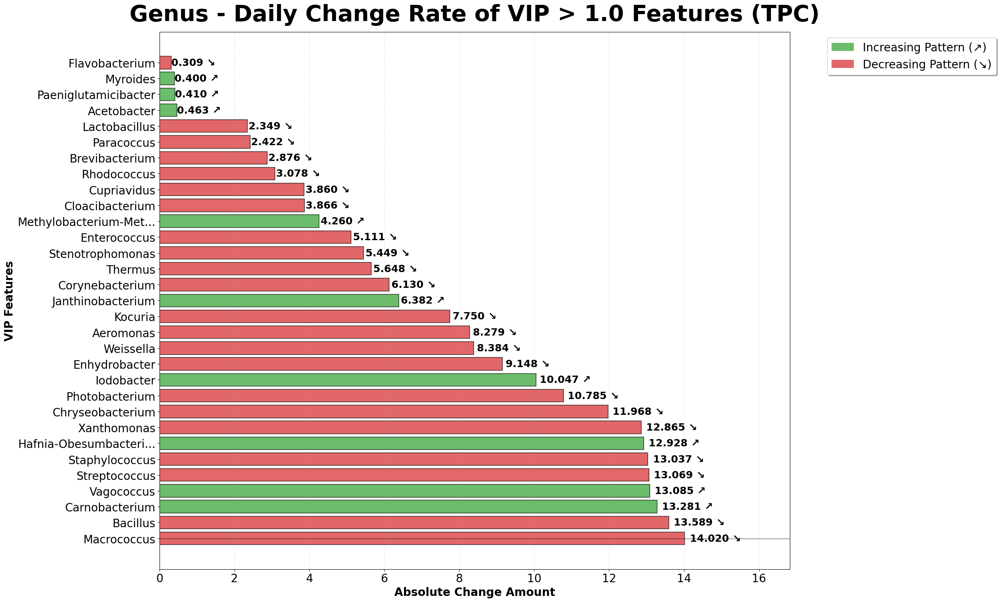

=== Genus Level VIP > 1.0 Features Bar Chart Completed (TPC) ===

=== Genus Level VIP > 1.0 Features Change Rate Statistics Summary (TPC) ===
----------------------------------------------------------------------
VIP Features: 31 features
Max Change: 14.020, Min Change: 0.309, Avg Change: 7.266
Increase: 9, Decrease: 22

Top 5 VIP Features by Change Rate:
 1. g__Macrococcus
    Change: -14.020 (Decreasing)
 2. g__Bacillus
    Change: -13.589 (Decreasing)
 3. g__Carnobacterium
    Change: +13.281 (Increasing)
 4. g__Vagococcus
    Change: +13.085 (Increasing)
 5. g__Streptococcus
    Change: -13.069 (Decreasing)


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Genus Level VIP > 1.0 Features 변화율 시각화 (TPC 기준만)
print("=== Genus Level VIP > 1.0 Features 변화율 시각화 (TPC 기준) ===\n")

plt.rcParams['axes.unicode_minus'] = False

level_name = 'Genus'
vip_features = vip_over1_dict[level_name]['Feature'].tolist()

if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    level_data = get_level_data(level_name)
    df = level_data['data'].copy()
    df['Day'] = df['Description'].str.extract(r'A(\d+)', expand=False).astype(int)
    day_means = df.groupby('Day')[vip_features].mean()
    first_day = day_means.index.min()
    last_day = day_means.index.max()

    feature_changes = []
    for feature in vip_features:
        first_val = day_means.loc[first_day, feature]
        last_val = day_means.loc[last_day, feature]
        change_amount = last_val - first_val
        abs_change = abs(change_amount)
        feature_changes.append({
            'feature': feature,
            'change_amount': change_amount,
            'abs_change': abs_change,
            'trend': 'Increasing' if change_amount > 0 else 'Decreasing'
        })
    feature_changes.sort(key=lambda x: x['abs_change'], reverse=True)

    feature_names = [feat['feature'] for feat in feature_changes]
    abs_changes = [feat['abs_change'] for feat in feature_changes]
    change_amounts = [feat['change_amount'] for feat in feature_changes]
    trends = [feat['trend'] for feat in feature_changes]

    short_names = []
    for name in feature_names:
        short_name = name.replace('g__', '').replace('f__', '').replace('o__', '').replace('c__', '').replace('p__', '')
        if len(short_name) > 20:
            short_name = short_name[:20] + '...'
        short_names.append(short_name)

    bar_colors = ['#2ca02c' if change > 0 else '#d62728' for change in change_amounts]

    fig, ax = plt.subplots(1, 1, figsize=(25, 15))  # Figure 크기
    bars = ax.barh(range(len(feature_names)), abs_changes,
                   color=bar_colors, alpha=0.7, edgecolor='black', linewidth=1.2)

    ax.set_yticks(range(len(feature_names)))
    ax.set_yticklabels(short_names, fontsize=20)
    ax.set_xlabel('Absolute Change Amount', fontsize=20, fontweight='bold')
    ax.set_ylabel('VIP Features', fontsize=20, fontweight='bold')
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)

    # 값 표시 (바 끝에)
    for i, (bar, change, trend) in enumerate(zip(bars, change_amounts, trends)):
        width = bar.get_width()
        arrow = '↗' if change > 0 else '↘'
        ax.text(width + width*0.01, bar.get_y() + bar.get_height()/2,
                f'{width:.3f} {arrow}',
                ha='left', va='center', fontsize=18, fontweight='bold')

    ax.grid(True, alpha=0.3, linestyle='--', axis='x')
    ax.set_xlim(0, max(abs_changes) * 1.2)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3, linewidth=2)

    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='#2ca02c', alpha=0.7, label='Increasing Pattern (↗)'),
        plt.Rectangle((0, 0), 1, 1, facecolor='#d62728', alpha=0.7, label='Decreasing Pattern (↘)')
    ]
    ax.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left',
              fontsize=20, frameon=True, fancybox=True, shadow=True)

    plt.title('Genus - Daily Change Rate of VIP > 1.0 Features (TPC)',
              fontsize=40, fontweight='bold', pad=20, loc='center')
    plt.tight_layout()
    plt.show()

    print("=== Genus Level VIP > 1.0 Features Bar Chart Completed (TPC) ===\n")
    print("=== Genus Level VIP > 1.0 Features Change Rate Statistics Summary (TPC) ===")
    print("-" * 70)
    max_change = max(abs_changes)
    min_change = min(abs_changes)
    avg_change = np.mean(abs_changes)
    increase_count = sum(1 for change in change_amounts if change > 0)
    decrease_count = len(change_amounts) - increase_count
    print(f"VIP Features: {len(vip_features)} features")
    print(f"Max Change: {max_change:.3f}, Min Change: {min_change:.3f}, Avg Change: {avg_change:.3f}")
    print(f"Increase: {increase_count}, Decrease: {decrease_count}")
    print()
    print("Top 5 VIP Features by Change Rate:")
    for i, feat in enumerate(feature_changes[:5], 1):
        print(f"{i:2d}. {feat['feature']}")
        print(f"    Change: {feat['change_amount']:+.3f} ({feat['trend']})")
    print("=" * 70)

## Paper용 figure

/var/folders/f5/vpc6wvfd0d9g1tdw0h3gqqcc0000gn/T/ipykernel_8119/4063080382.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticks(), fontsize=20)


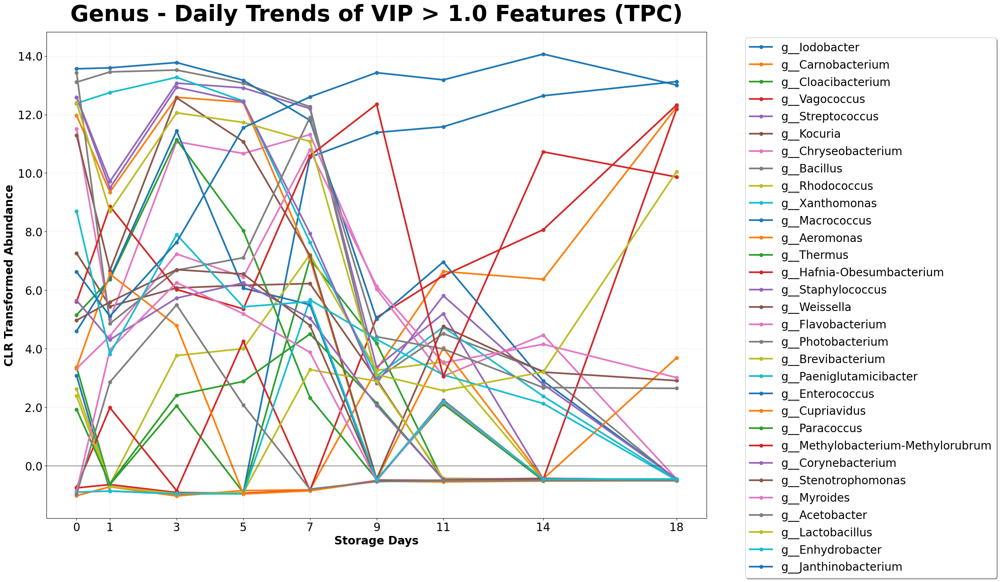

In [7]:
import matplotlib.pyplot as plt

# Genus level 데이터 불러오기
level_name = 'Genus'
level_data = get_level_data(level_name)
df = level_data['data'].copy()
df['Day'] = df['Description'].str.extract(r'A(\d+)', expand=False).astype(int)

# VIP > 1.0 Feature 리스트 (위 표 기준)
vip_features = [
    'g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus',
    'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas',
    'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus',
    'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter',
    'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium',
    'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium'
]

# x축 Day 지정
day_order = [0, 1, 3, 5, 7, 9, 11, 14, 18]

# 일별 평균 CLR abundance 계산 및 x축 맞추기
plot_df = df[['Day'] + vip_features].groupby('Day').mean().reindex(day_order)

fig, ax = plt.subplots(figsize=(25, 15))  # Figure 크기: 25x15 inch

for feat in vip_features:
    ax.plot(plot_df.index, plot_df[feat], marker='o', label=feat, linewidth=3)

ax.set_title('Genus - Daily Trends of VIP > 1.0 Features (TPC)', fontsize=40, fontweight='bold', pad=20, loc='center')
ax.set_xlabel('Storage Days', fontsize=20, fontweight='bold')
ax.set_ylabel('CLR Transformed Abundance', fontsize=20, fontweight='bold')
ax.set_xticks(day_order)
ax.set_xticklabels(day_order, fontsize=20)
ax.set_yticklabels(ax.get_yticks(), fontsize=20)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20, frameon=True, fancybox=True, shadow=True)
ax.grid(True, alpha=0.3, linestyle='--')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.3, linewidth=2)
plt.tight_layout()
plt.show()

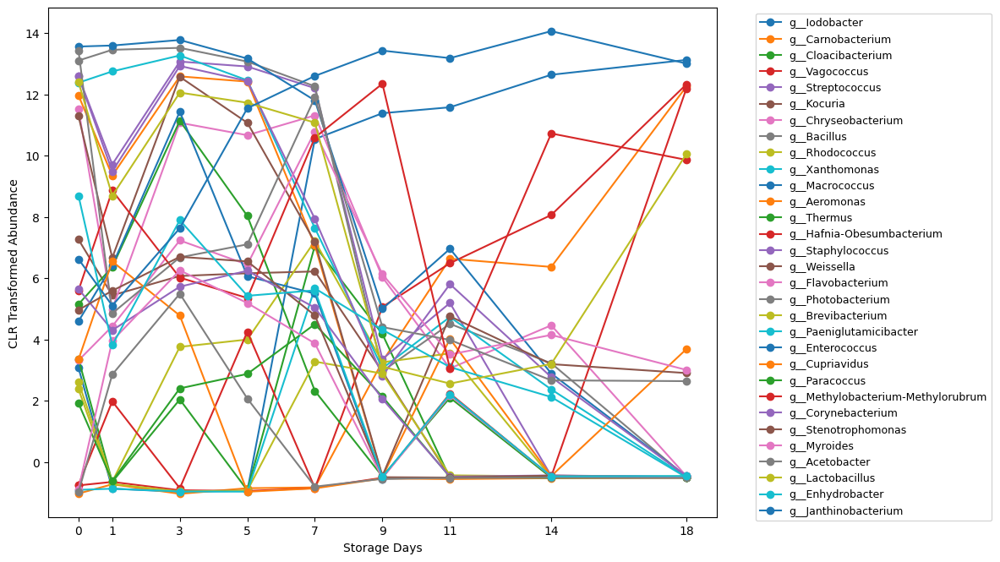


=== Genus Level VIP > 1.0 Features 일별 변화 엑셀 파일 생성 ===
✅ Genus Level VIP > 1.0 Features 일별 변화 엑셀 파일이 저장되었습니다:
📁 파일 경로: /Users/taehokim/lab/BRL_AI/BRL_final/CLR_code/Genus_VIP_Features_Daily_Trends_TPC_kmenas.xlsx

📊 저장된 시트 정보:
   • 0_README: 분석 개요 및 시트 설명
   • 1_VIP_Info: VIP > 1.0 features 기본 정보
   • 2_Daily_Means_Selected: 선택된 day의 일별 평균값
   • 3_Daily_Means_All: 모든 day의 일별 평균값
   • 4_Change_Analysis: 변화량 분석 (Day 0 vs Day 18)
   • 5_Sample_Data: 전체 샘플 데이터
   • 6_Statistics: 기술통계량
   • 7_Correlation: 상관관계 매트릭스

📈 VIP Features 요약:
   • VIP > 1.0 Features 수: 31개
   • 총 샘플 수: 270
   • 저장 기간: 0 - 18일
   • 증가 패턴: 9개
   • 감소 패턴: 22개
   • 최대 VIP Score: 2.512
   • 평균 VIP Score: 1.689



In [8]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Genus level 데이터 불러오기
level_name = 'Genus'
level_data = get_level_data(level_name)
df = level_data['data'].copy()
df['Day'] = df['Description'].str.extract(r'A(\d+)', expand=False).astype(int)

# VIP > 1.0 Feature 리스트
vip_features = vip_over1_dict[level_name]['Feature'].tolist()

# x축 Day 지정
day_order = [0, 1, 3, 5, 7, 9, 11, 14, 18]

# 일별 평균 CLR abundance 계산 및 x축 맞추기
plot_df = df[['Day'] + vip_features].groupby('Day').mean().reindex(day_order)

plt.figure(figsize=(12, 7))
for feat in vip_features:
    plt.plot(plot_df.index, plot_df[feat], marker='o', label=feat)

plt.xlabel('Storage Days')
plt.ylabel('CLR Transformed Abundance')
plt.xticks(day_order)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.show()

# Genus Level VIP > 1.0 Features 일별 변화 엑셀 파일 생성
print("\n=== Genus Level VIP > 1.0 Features 일별 변화 엑셀 파일 생성 ===")

# 1. VIP > 1.0 Features 기본 정보 시트
vip_info_list = []
vip_df = vip_over1_dict[level_name]
for i, row in vip_df.iterrows():
    vip_info_list.append({
        'Rank': i + 1,
        'Feature_Name': row['Feature'],
        'VIP_Score': row['VIP_Score'],
        'Importance_Level': 'Very Important' if row['VIP_Score'] > 1.0 else 'Moderate'
    })

vip_info_df = pd.DataFrame(vip_info_list)

# 2. 일별 평균 CLR abundance 시트 (전체 day)
day_means_all = df[['Day'] + vip_features].groupby('Day').mean()
day_means_all_reset = day_means_all.reset_index()

# 3. 지정된 day만의 평균 CLR abundance 시트
day_means_selected = plot_df.reset_index()
day_means_selected.columns.name = None

# 4. 전체 샘플 데이터 (VIP features만)
sample_data_vip = df[['Description', 'Day', 'TPC (log CFU/g)', 'TBARS'] + vip_features].copy()

# 5. 변화량 분석 시트 (첫날 대비 마지막날)
change_analysis_list = []
first_day = day_means_all.index.min()
last_day = day_means_all.index.max()

for feature in vip_features:
    first_val = day_means_all.loc[first_day, feature]
    last_val = day_means_all.loc[last_day, feature]
    change_amount = last_val - first_val
    abs_change = abs(change_amount)
    percent_change = (change_amount / abs(first_val)) * 100 if first_val != 0 else 0
    
    change_analysis_list.append({
        'Feature_Name': feature,
        'Day_0_Value': first_val,
        'Day_18_Value': last_val,
        'Change_Amount': change_amount,
        'Absolute_Change': abs_change,
        'Percent_Change': percent_change,
        'Trend': 'Increasing' if change_amount > 0 else 'Decreasing',
        'Min_Day': day_means_all[feature].idxmin(),
        'Max_Day': day_means_all[feature].idxmax(),
        'Min_Value': day_means_all[feature].min(),
        'Max_Value': day_means_all[feature].max(),
        'Value_Range': day_means_all[feature].max() - day_means_all[feature].min()
    })

change_analysis_df = pd.DataFrame(change_analysis_list)
change_analysis_df = change_analysis_df.sort_values('Absolute_Change', ascending=False)

# 6. 통계 요약 시트
stats_list = []
for feature in vip_features:
    feature_data = df[feature]
    stats_list.append({
        'Feature_Name': feature,
        'Mean': feature_data.mean(),
        'Std': feature_data.std(),
        'Min': feature_data.min(),
        'Max': feature_data.max(),
        'Q25': feature_data.quantile(0.25),
        'Median': feature_data.median(),
        'Q75': feature_data.quantile(0.75),
        'Skewness': feature_data.skew(),
        'Kurtosis': feature_data.kurtosis(),
        'CV': feature_data.std() / feature_data.mean() if feature_data.mean() != 0 else 0
    })

stats_df = pd.DataFrame(stats_list)

# 7. 상관관계 매트릭스 시트
correlation_features = vip_features + ['TPC (log CFU/g)', 'TBARS']
correlation_df = df[correlation_features].corr()

# 엑셀 파일 저장
excel_file_path = "/Users/taehokim/lab/BRL_AI/BRL_final/CLR_code/Genus_VIP_Features_Daily_Trends_TPC_kmenas.xlsx"

with pd.ExcelWriter(excel_file_path, engine='openpyxl') as writer:
    # 시트별 저장
    vip_info_df.to_excel(writer, sheet_name='1_VIP_Info', index=False)
    day_means_selected.to_excel(writer, sheet_name='2_Daily_Means_Selected', index=False)
    day_means_all_reset.to_excel(writer, sheet_name='3_Daily_Means_All', index=False)
    change_analysis_df.to_excel(writer, sheet_name='4_Change_Analysis', index=False)
    sample_data_vip.to_excel(writer, sheet_name='5_Sample_Data', index=False)
    stats_df.to_excel(writer, sheet_name='6_Statistics', index=False)
    correlation_df.to_excel(writer, sheet_name='7_Correlation', index=True)
    
    # README 시트 추가
    info_sheet = writer.book.create_sheet('0_README')
    info_data = [
        ['Sheet Name', 'Description'],
        ['1_VIP_Info', 'VIP > 1.0 features 기본 정보 (VIP Score, 중요도 등)'],
        ['2_Daily_Means_Selected', '선택된 저장일수(0,1,3,5,7,9,11,14,18)의 일별 평균값'],
        ['3_Daily_Means_All', '모든 저장일수의 일별 평균값'],
        ['4_Change_Analysis', '각 feature의 변화량 분석 (Day 0 vs Day 18)'],
        ['5_Sample_Data', '전체 샘플 데이터 (VIP features + TPC + TBARS)'],
        ['6_Statistics', '각 feature의 기술통계량'],
        ['7_Correlation', 'VIP features + TPC/TBARS 상관관계 매트릭스'],
        ['', ''],
        ['Analysis Info', ''],
        ['Analysis Type', 'TPC 기준 VIP > 1.0 Features'],
        ['Total VIP Features', len(vip_features)],
        ['Total Samples', len(df)],
        ['Storage Days', f"{min(df['Day'])} - {max(df['Day'])} days"],
        ['Selected Days', '0, 1, 3, 5, 7, 9, 11, 14, 18'],
        ['', ''],
        ['VIP Score Summary', ''],
        ['Max VIP Score', vip_df['VIP_Score'].max()],
        ['Min VIP Score', vip_df['VIP_Score'].min()],
        ['Mean VIP Score', vip_df['VIP_Score'].mean()],
        ['', ''],
        ['Change Pattern Summary', ''],
        ['Increasing Features', sum(1 for f in change_analysis_list if f['Change_Amount'] > 0)],
        ['Decreasing Features', sum(1 for f in change_analysis_list if f['Change_Amount'] < 0)],
        ['Max Absolute Change', max([f['Absolute_Change'] for f in change_analysis_list])],
        ['Min Absolute Change', min([f['Absolute_Change'] for f in change_analysis_list])]
    ]
    
    for row_idx, row_data in enumerate(info_data, 1):
        for col_idx, cell_value in enumerate(row_data, 1):
            info_sheet.cell(row=row_idx, column=col_idx, value=cell_value)

print(f"✅ Genus Level VIP > 1.0 Features 일별 변화 엑셀 파일이 저장되었습니다:")
print(f"📁 파일 경로: {excel_file_path}")
print(f"\n📊 저장된 시트 정보:")
print(f"   • 0_README: 분석 개요 및 시트 설명")
print(f"   • 1_VIP_Info: VIP > 1.0 features 기본 정보")
print(f"   • 2_Daily_Means_Selected: 선택된 day의 일별 평균값")
print(f"   • 3_Daily_Means_All: 모든 day의 일별 평균값")
print(f"   • 4_Change_Analysis: 변화량 분석 (Day 0 vs Day 18)")
print(f"   • 5_Sample_Data: 전체 샘플 데이터")
print(f"   • 6_Statistics: 기술통계량")
print(f"   • 7_Correlation: 상관관계 매트릭스")

print(f"\n📈 VIP Features 요약:")
print(f"   • VIP > 1.0 Features 수: {len(vip_features)}개")
print(f"   • 총 샘플 수: {len(df)}")
print(f"   • 저장 기간: {min(df['Day'])} - {max(df['Day'])}일")
print(f"   • 증가 패턴: {sum(1 for f in change_analysis_list if f['Change_Amount'] > 0)}개")
print(f"   • 감소 패턴: {sum(1 for f in change_analysis_list if f['Change_Amount'] < 0)}개")
print(f"   • 최대 VIP Score: {vip_df['VIP_Score'].max():.3f}")
print(f"   • 평균 VIP Score: {vip_df['VIP_Score'].mean():.3f}")

print("\n" + "="*80)

## PLS-DA

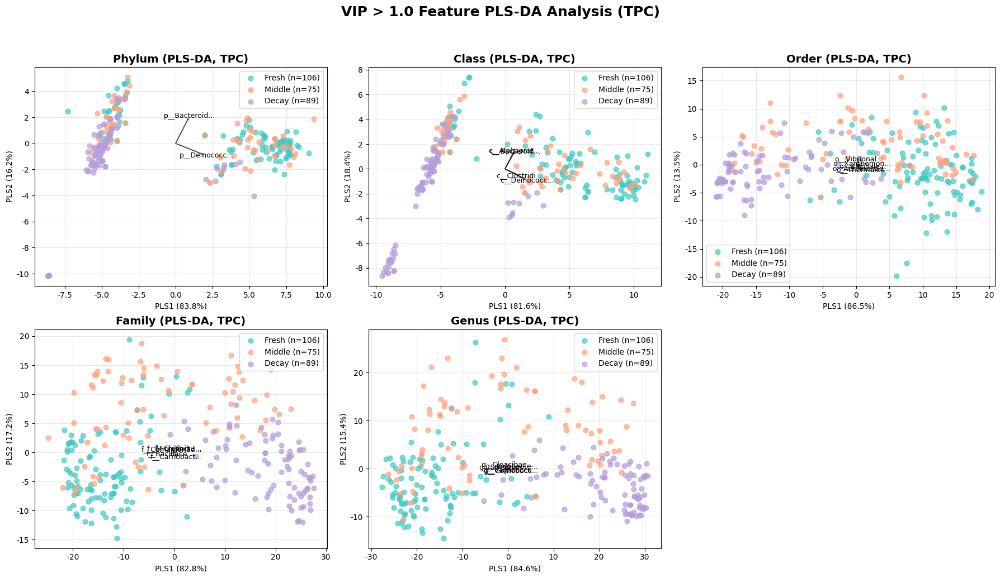

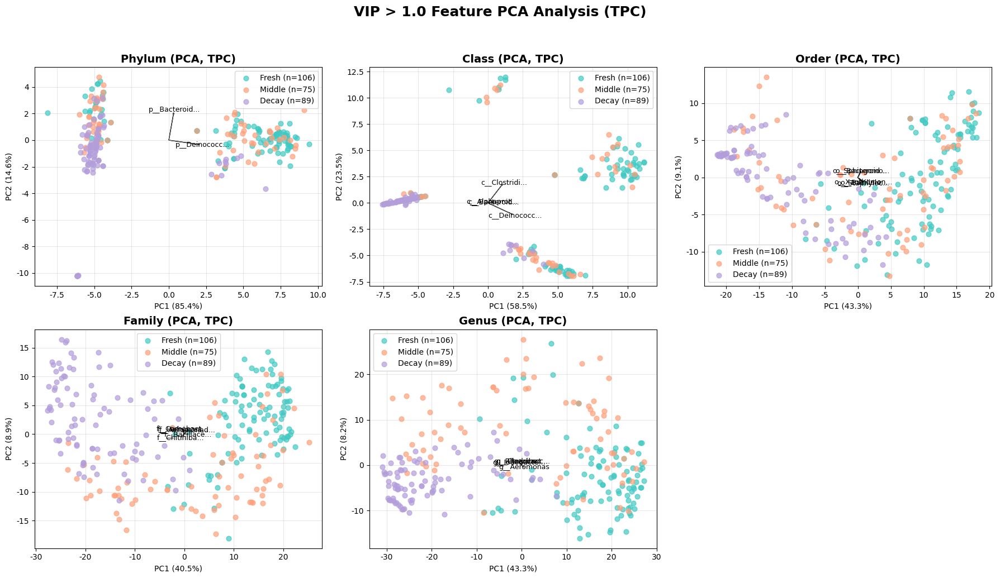

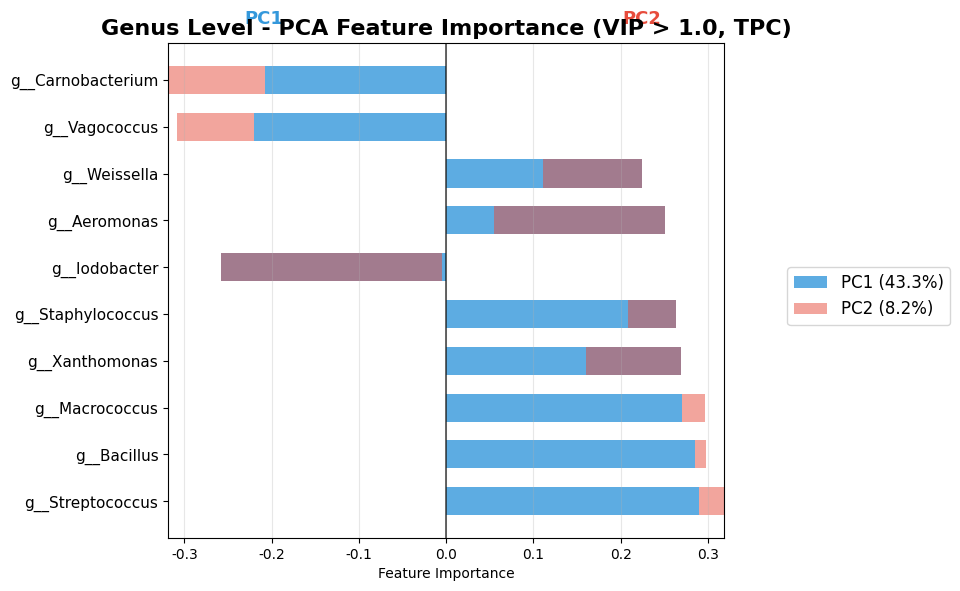

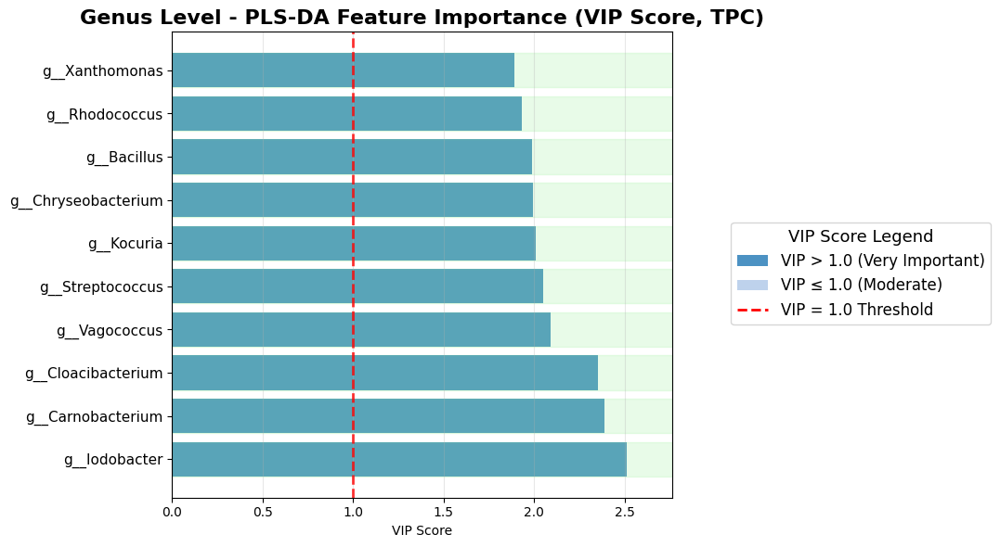

In [9]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 색상/라벨 변수 통일
colors = {0: "#40c9c3", 1: "#ffa07a", 2: "#b39ddb"}
label_names = {0: "Fresh", 1: "Middle", 2: "Decay"}

# 1. PLS-DA scatter (TPC 기준, 영어 텍스트)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()
level_keys = list(vip_over1_dict.keys())
for idx, level_name in enumerate(level_keys):
    level_data = get_level_data(level_name)
    if level_data is None:
        print(f"{level_name}: No data, skipped")
        continue
    X = level_data['features']
    tpc = level_data['tpc']
    y = tpc_labeling(tpc)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: No VIP > 1.0 feature, skipped")
        continue
    X_vip = X[vip_features]
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1
    plsda = PLSRegression(n_components=2, scale=False)
    X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
    exp_var = np.var(X_pls, axis=0) / np.sum(np.var(X_pls, axis=0)) * 100
    ax = axes[idx]
    # 산점도
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pls[y == label, 0], X_pls[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 상위 5개 loading 벡터
    loadings = plsda.x_weights_
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PLS-DA, TPC)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PLS1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PLS2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')
for j in range(len(level_keys), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PLS-DA Analysis (TPC)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 2. PCA scatter (TPC 기준, 영어 텍스트)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()
for idx, level_name in enumerate(level_keys):
    level_data = get_level_data(level_name)
    if level_data is None:
        print(f"{level_name}: No data, skipped")
        continue
    X = level_data['features']
    tpc = level_data['tpc']
    y = tpc_labeling(tpc)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: No VIP > 1.0 feature, skipped")
        continue
    X_vip = X[vip_features]
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_vip)
    exp_var = pca.explained_variance_ratio_ * 100
    ax = axes[idx]
    # 산점도
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pca[y == label, 0], X_pca[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 상위 5개 loading 벡터
    loadings = pca.components_.T
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PCA, TPC)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PC1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PC2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')
for j in range(len(level_keys), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PCA Analysis (TPC)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 3. Genus level mirror bar chart (PCA, VIP Score, TPC 기준, 영어 텍스트)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()
if vip_features:
    # PCA mirror bar chart (Top 10)
    X_vip = level_data['features'][vip_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]
    ind = np.arange(len(top10_features))
    height = 0.6
    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=top10_pc1, alpha=0.5)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (VIP > 1.0, TPC)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

    # VIP Score mirror bar chart (Top 10)
    vip_df = vip_over1_dict[level_name]
    top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
    top10_features_vip = top10_vip['Feature'].values
    top10_scores = top10_vip['VIP_Score'].values
    fig, ax = plt.subplots(figsize=(8, 6))
    bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(top10_features_vip, fontsize=11)
    ax.set_xlabel('VIP Score')
    ax.set_title('Genus Level - PLS-DA Feature Importance (VIP Score, TPC)', fontsize=16, fontweight='bold')
    ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
    ax.grid(True, alpha=0.3, axis='x')
    for i in range(np.sum(top10_scores > 1.0)):
        ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
    ax.set_xlim(0, max(top10_scores)*1.1)
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
        plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
        plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
    ]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

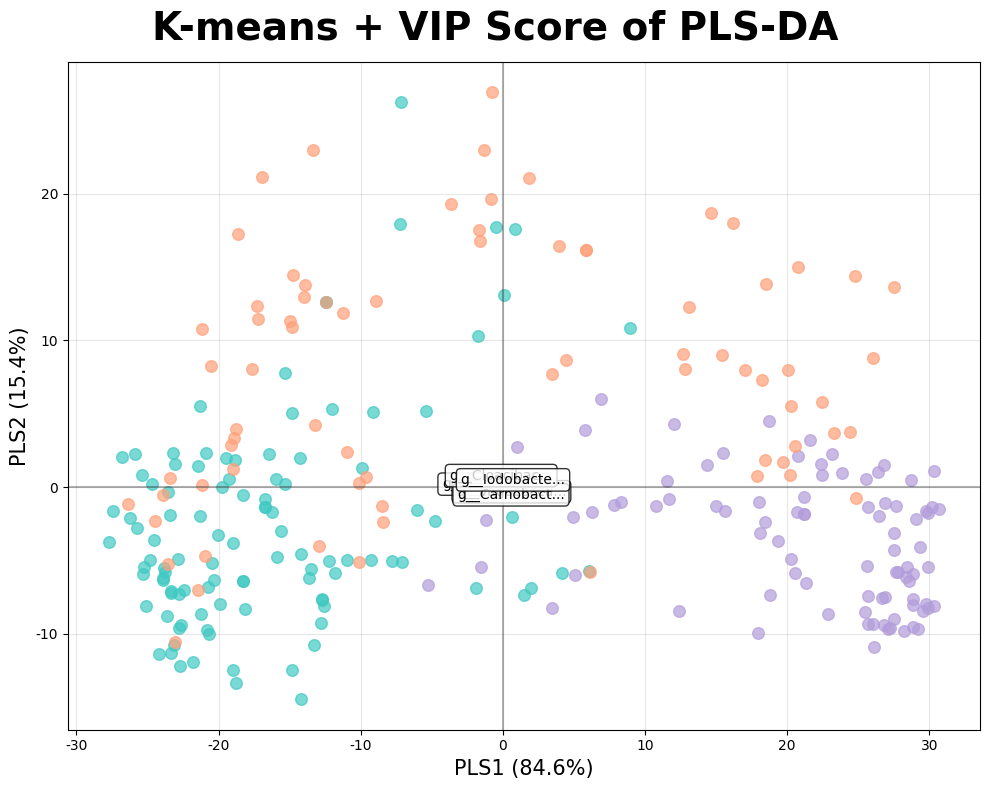

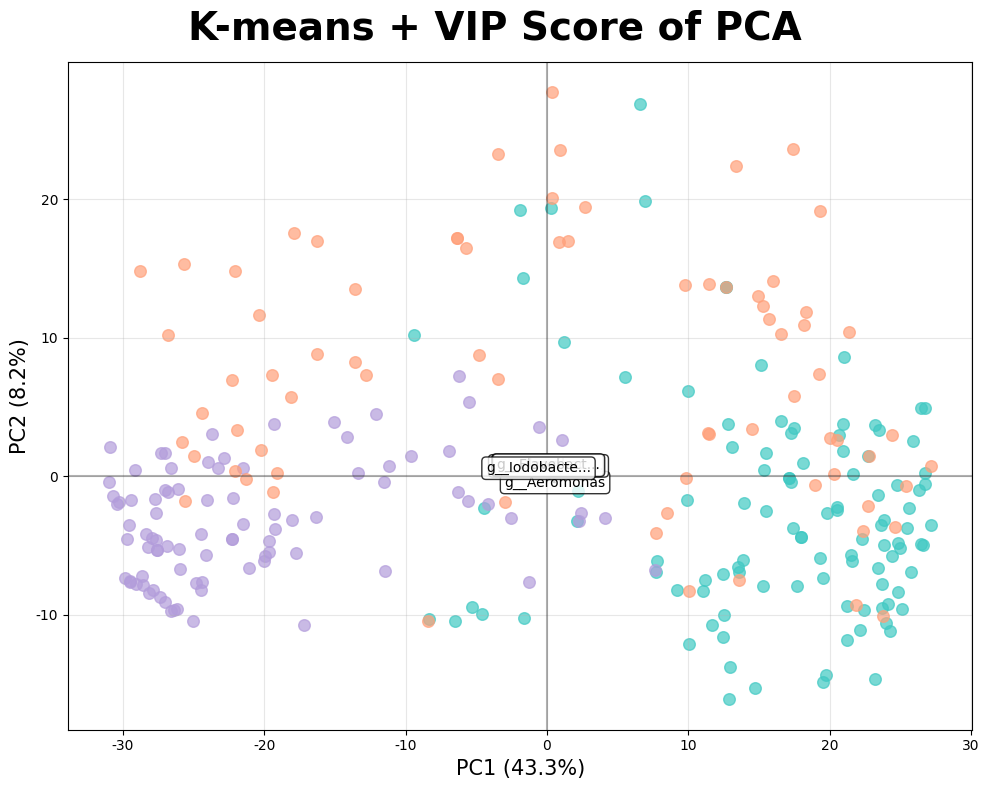

In [10]:
# Genus Level 단독 시각화 (Condition 4, K-means + VIP Score, PLS-DA & PCA)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA

# 색상 및 라벨 설정 (Fresh, Middle, Spoilage 순서)
colors = {0: "#40c9c3", 2: "#b39ddb", 1: "#ffa07a"}
label_names = {0: "Fresh", 2: "Middle", 1: "Spoilage"}  # Decay → Spoilage

level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()
X_vip = level_data['features'][vip_features]
tpc = level_data['tpc']
y = tpc_labeling(tpc)

# PLS-DA (Condition 4, K-means + VIP Score)
y_onehot = np.zeros((len(y), 3))
for i in range(len(y)):
    y_onehot[i, y[i]] = 1

plsda = PLSRegression(n_components=2, scale=False)
X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
exp_var_pls = np.var(X_pls, axis=0) / np.sum(np.var(X_pls, axis=0)) * 100

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
fig.suptitle('K-means + VIP Score of PLS-DA', fontsize=28, fontweight='bold', y=0.98)

for label in [0, 2, 1]:  # Fresh, Middle, Spoilage 순서
    mask = y == label
    if np.sum(mask) > 0:
        ax.scatter(X_pls[mask, 0], X_pls[mask, 1],
                   c=colors[label], alpha=0.7, s=70,
                   label=f'{label_names[label]} (n={np.sum(mask)})')

# 상위 5개 loading 벡터
loadings = plsda.x_weights_
loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
top_idx = np.argsort(loading_magnitudes)[-5:]
for i in top_idx:
    ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
             fc='black', ec='black', alpha=0.7, head_width=0.12, head_length=0.12)
    feat_name = vip_features[i]
    if len(feat_name) > 12:
        feat_name = feat_name[:12] + '...'
    ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=10, color='black', ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='black', alpha=0.8))

ax.set_xlabel(f'PLS1 ({exp_var_pls[0]:.1f}%)', fontsize=15)
ax.set_ylabel(f'PLS2 ({exp_var_pls[1]:.1f}%)', fontsize=15)
ax.grid(True, alpha=0.3)
ax.axhline(y=0, color='k', linestyle='-', alpha=0.3)
ax.axvline(x=0, color='k', linestyle='-', alpha=0.3)
plt.tight_layout()
plt.show()

# PCA (Condition 4, K-means + VIP Score)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_vip)
exp_var_pca = pca.explained_variance_ratio_ * 100

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
fig.suptitle('K-means + VIP Score of PCA', fontsize=28, fontweight='bold', y=0.98)

for label in [0, 2, 1]:  # Fresh, Middle, Spoilage 순서
    mask = y == label
    if np.sum(mask) > 0:
        ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
                   c=colors[label], alpha=0.7, s=70,
                   label=f'{label_names[label]} (n={np.sum(mask)})')

# 상위 5개 loading 벡터
loadings = pca.components_.T
loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
top_idx = np.argsort(loading_magnitudes)[-5:]
for i in top_idx:
    ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
             fc='black', ec='black', alpha=0.7, head_width=0.12, head_length=0.12)
    feat_name = vip_features[i]
    if len(feat_name) > 12:
        feat_name = feat_name[:12] + '...'
    ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=10, color='black', ha='center', va='center',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='black', alpha=0.8))

ax.set_xlabel(f'PC1 ({exp_var_pca[0]:.1f}%)', fontsize=15)
ax.set_ylabel(f'PC2 ({exp_var_pca[1]:.1f}%)', fontsize=15)
ax.grid(True, alpha=0.3)
ax.axhline(y=0, color='k', linestyle='-', alpha=0.3)
ax.axvline(x=0, color='k', linestyle='-', alpha=0.3)
plt.tight_layout()
plt.show()

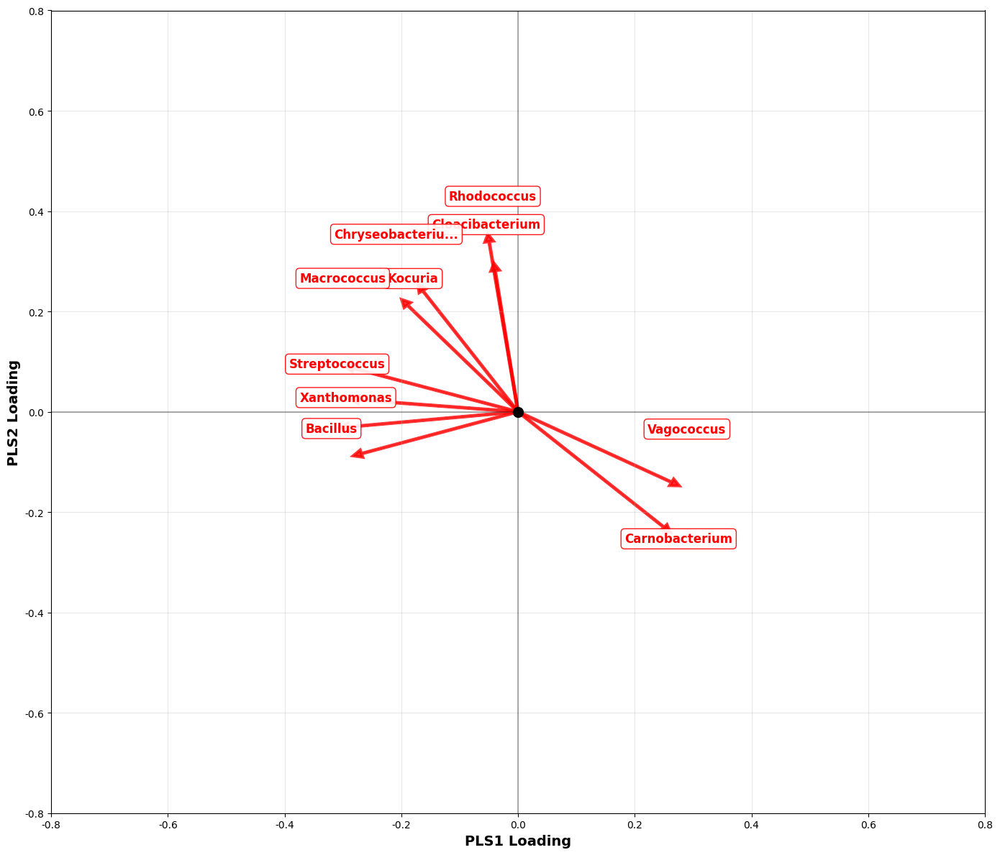

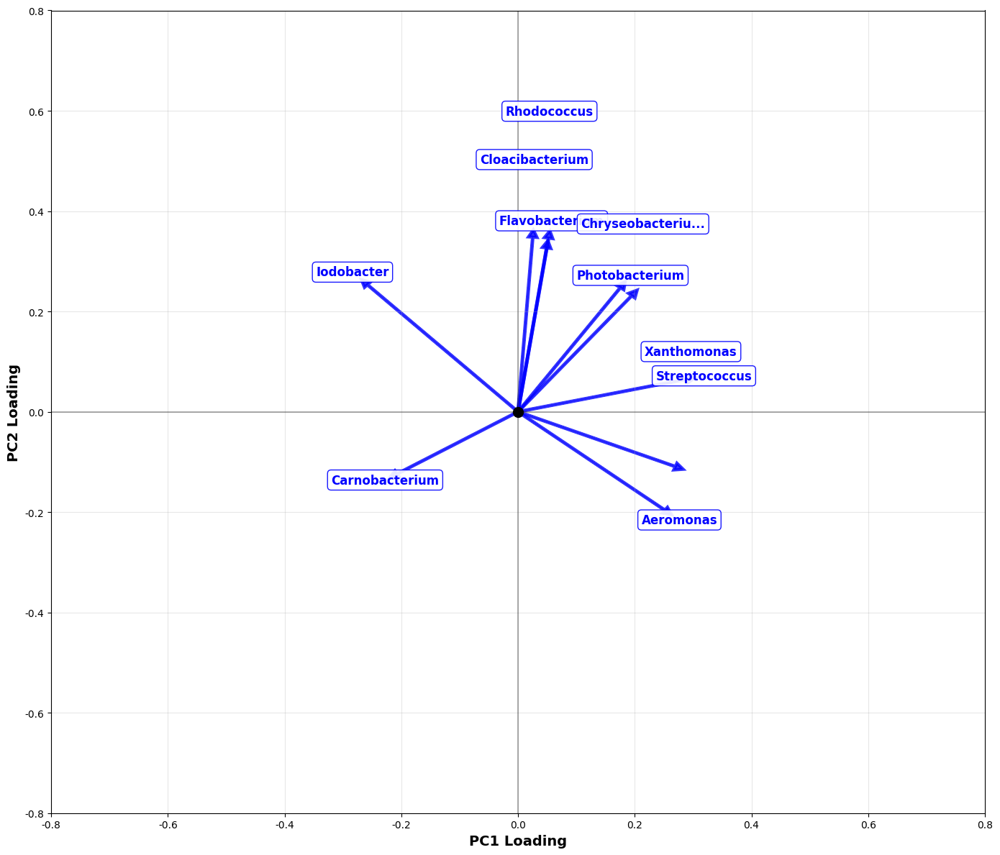

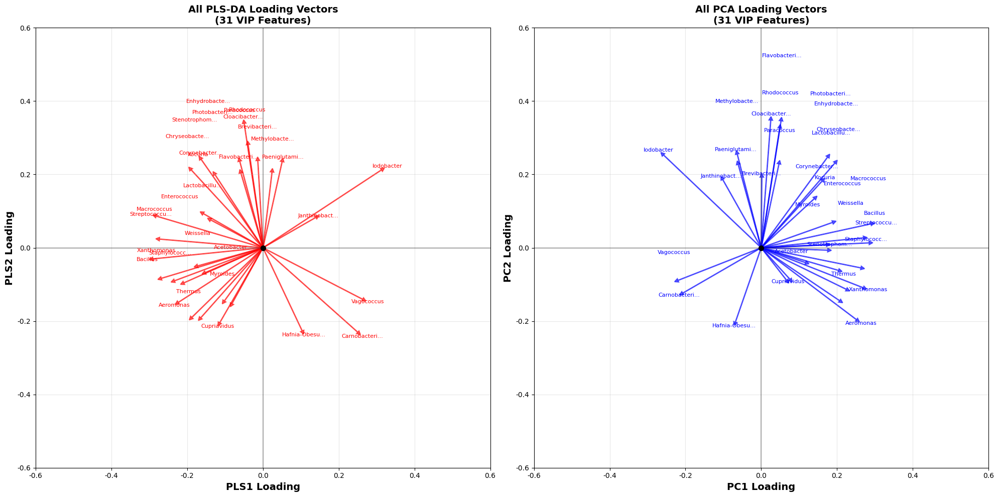

=== PLS-DA 벡터 정보 (상위 10개 - Iodobacter 제외, Aeromonas 포함) ===
 1. Cloacibacterium           | PLS1: -0.050 | PLS2: +0.339 | Mag: 0.343 
 2. Carnobacterium            | PLS1: +0.250 | PLS2: -0.230 | Mag: 0.340 
 3. Vagococcus                | PLS1: +0.263 | PLS2: -0.140 | Mag: 0.298 
 4. Streptococcus             | PLS1: -0.282 | PLS2: +0.086 | Mag: 0.295 
 5. Bacillus                  | PLS1: -0.291 | PLS2: -0.030 | Mag: 0.292 
 6. Kocuria                   | PLS1: -0.163 | PLS2: +0.241 | Mag: 0.291 
 7. Chryseobacterium          | PLS1: -0.190 | PLS2: +0.213 | Mag: 0.285 
 8. Rhodococcus               | PLS1: -0.039 | PLS2: +0.281 | Mag: 0.284 
 9. Xanthomonas               | PLS1: -0.268 | PLS2: -0.083 | Mag: 0.281 
10. Macrococcus               | PLS1: -0.273 | PLS2: +0.024 | Mag: 0.274 

=== PCA 벡터 정보 (상위 10개 - Carnobacterium 1위로 조정) ===
 1. Carnobacterium            | PC1: -0.207 | PC2: -0.124 | Mag: 0.241 ⭐ Carnobacterium 우선표시
 2. Iodobacter                | PC1: -0.258 | PC2: +0.2

In [11]:
# Genus Level 벡터만 확대해서 별도 시각화 (수정됨)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA

level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()
X_vip = level_data['features'][vip_features]
tpc = level_data['tpc']
y = tpc_labeling(tpc)

# PLS-DA 벡터만 시각화
y_onehot = np.zeros((len(y), 3))
for i in range(len(y)):
    y_onehot[i, y[i]] = 1

plsda = PLSRegression(n_components=2, scale=False)
X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
loadings_pls = plsda.x_weights_

# PCA 벡터만 시각화
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_vip)
loadings_pca = pca.components_.T

def simple_avoid_overlap(positions, min_distance=0.12):
    """겹치는 텍스트를 간단히 위로 밀어내기"""
    adjusted_positions = positions.copy()
    
    for i in range(len(positions)):
        for j in range(i+1, len(positions)):
            # 두 점 사이의 거리 계산
            dist = np.sqrt((adjusted_positions[i][0] - adjusted_positions[j][0])**2 + 
                          (adjusted_positions[i][1] - adjusted_positions[j][1])**2)
            
            # 겹치면 두 번째 점을 위로 이동
            if dist < min_distance:
                adjusted_positions[j] = (adjusted_positions[j][0], 
                                       adjusted_positions[j][1] + min_distance)
    
    return adjusted_positions

# 1. PLS-DA 벡터만 확대 시각화 (Iodobacter 제외, Aeromonas 포함)
plt.figure(figsize=(14, 12))

# 상위 벡터 선택하되 Iodobacter 제외, Aeromonas 강제 포함
loading_magnitudes_pls = np.sqrt(loadings_pls[:, 0]**2 + loadings_pls[:, 1]**2)
all_sorted_idx = np.argsort(loading_magnitudes_pls)[::-1]

# Aeromonas와 Iodobacter 인덱스 찾기
aeromonas_idx = None
iodobacter_idx = None
for i, feat in enumerate(vip_features):
    if 'Aeromonas' in feat:
        aeromonas_idx = i
    if 'Iodobacter' in feat:
        iodobacter_idx = i

# 상위 11개를 선택한 후 Iodobacter 제거하고 Aeromonas 추가
top_11_idx = all_sorted_idx[:11].tolist()
if iodobacter_idx in top_11_idx:
    top_11_idx.remove(iodobacter_idx)
if aeromonas_idx is not None and aeromonas_idx not in top_11_idx:
    top_11_idx.append(aeromonas_idx)

top_10_idx_pls = top_11_idx[:10]

# 초기 텍스트 위치 계산
text_positions = []
for i in top_10_idx_pls:
    text_x = loadings_pls[i, 0] * 1.1
    text_y = loadings_pls[i, 1] * 1.1
    text_positions.append((text_x, text_y))

# 겹침 방지 조정
adjusted_positions = simple_avoid_overlap(text_positions, min_distance=0.12)

for idx, i in enumerate(top_10_idx_pls):
    feat_name = vip_features[i].replace('g__', '')
    if len(feat_name) > 15:
        feat_name = feat_name[:15] + '...'
    
    # 벡터 그리기
    plt.arrow(0, 0, loadings_pls[i, 0], loadings_pls[i, 1],
             head_width=0.015, head_length=0.015, fc='red', ec='red', linewidth=3, alpha=0.8)
    
    # 조정된 위치에 텍스트 라벨
    adjusted_x, adjusted_y = adjusted_positions[idx]
    plt.text(adjusted_x, adjusted_y, feat_name, 
             fontsize=12, color='red', ha='center', va='center', fontweight='bold',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='red', alpha=0.9))

plt.xlim(-0.8, 0.8)
plt.ylim(-0.8, 0.8)
plt.xlabel('PLS1 Loading', fontsize=14, fontweight='bold')
plt.ylabel('PLS2 Loading', fontsize=14, fontweight='bold')

plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)

# 원점 표시
plt.scatter([0], [0], s=100, color='black', marker='o', zorder=5)
plt.tight_layout()
plt.show()

# 2. PCA 벡터만 확대 시각화 (Carnobacterium 맨 앞으로)
plt.figure(figsize=(14, 12))

# 상위 10개 벡터 선택하되 Carnobacterium을 맨 앞으로 배치
loading_magnitudes_pca = np.sqrt(loadings_pca[:, 0]**2 + loadings_pca[:, 1]**2)
all_sorted_idx_pca = np.argsort(loading_magnitudes_pca)[::-1]

# Carnobacterium 인덱스 찾기
carnobacterium_idx = None
for i, feat in enumerate(vip_features):
    if 'Carnobacterium' in feat:
        carnobacterium_idx = i
        break

# Carnobacterium을 맨 앞에 배치하고 나머지 9개 선택
if carnobacterium_idx is not None:
    top_10_idx_pca = [carnobacterium_idx]
    # Carnobacterium을 제외한 상위 9개 추가
    remaining_idx = [idx for idx in all_sorted_idx_pca if idx != carnobacterium_idx][:9]
    top_10_idx_pca.extend(remaining_idx)
else:
    top_10_idx_pca = all_sorted_idx_pca[:10]

# 초기 텍스트 위치 계산
text_positions = []
for i in top_10_idx_pca:
    text_x = loadings_pca[i, 0] * 1.1
    text_y = loadings_pca[i, 1] * 1.1
    text_positions.append((text_x, text_y))

# 겹침 방지 조정
adjusted_positions = simple_avoid_overlap(text_positions, min_distance=0.12)

for idx, i in enumerate(top_10_idx_pca):
    feat_name = vip_features[i].replace('g__', '')
    if len(feat_name) > 15:
        feat_name = feat_name[:15] + '...'
    
    # 벡터 그리기
    plt.arrow(0, 0, loadings_pca[i, 0], loadings_pca[i, 1],
             head_width=0.015, head_length=0.015, fc='blue', ec='blue', linewidth=3, alpha=0.8)
    
    # 조정된 위치에 텍스트 라벨
    adjusted_x, adjusted_y = adjusted_positions[idx]
    plt.text(adjusted_x, adjusted_y, feat_name, 
             fontsize=12, color='blue', ha='center', va='center', fontweight='bold',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='blue', alpha=0.9))

plt.xlim(-0.8, 0.8)
plt.ylim(-0.8, 0.8)
plt.xlabel('PC1 Loading', fontsize=14, fontweight='bold')
plt.ylabel('PC2 Loading', fontsize=14, fontweight='bold')


plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)

# 원점 표시
plt.scatter([0], [0], s=100, color='black', marker='o', zorder=5)
plt.tight_layout()
plt.show()

# 3. 모든 벡터 시각화 (작은 크기로)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

# 모든 PLS-DA 벡터
text_positions = []
for i, feat in enumerate(vip_features):
    text_x = loadings_pls[i, 0] * 1.05
    text_y = loadings_pls[i, 1] * 1.05
    text_positions.append((text_x, text_y))

adjusted_positions = simple_avoid_overlap(text_positions, min_distance=0.08)

for i, feat in enumerate(vip_features):
    feat_name = feat.replace('g__', '')
    if len(feat_name) > 12:
        feat_name = feat_name[:12] + '...'
    
    ax1.arrow(0, 0, loadings_pls[i, 0], loadings_pls[i, 1],
              head_width=0.01, head_length=0.01, fc='red', ec='red', alpha=0.6, linewidth=1.5)
    
    adjusted_x, adjusted_y = adjusted_positions[i]
    ax1.text(adjusted_x, adjusted_y, feat_name, 
             fontsize=8, color='red', ha='center', va='center')

ax1.set_xlim(-0.6, 0.6)
ax1.set_ylim(-0.6, 0.6)
ax1.set_xlabel('PLS1 Loading', fontsize=14, fontweight='bold')
ax1.set_ylabel('PLS2 Loading', fontsize=14, fontweight='bold')
ax1.set_title('All PLS-DA Loading Vectors\n(31 VIP Features)', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.axhline(y=0, color='k', linestyle='-', alpha=0.3)
ax1.axvline(x=0, color='k', linestyle='-', alpha=0.3)
ax1.scatter([0], [0], s=50, color='black', marker='o', zorder=5)

# 모든 PCA 벡터
text_positions = []
for i, feat in enumerate(vip_features):
    text_x = loadings_pca[i, 0] * 1.05
    text_y = loadings_pca[i, 1] * 1.05
    text_positions.append((text_x, text_y))

adjusted_positions = simple_avoid_overlap(text_positions, min_distance=0.08)

for i, feat in enumerate(vip_features):
    feat_name = feat.replace('g__', '')
    if len(feat_name) > 12:
        feat_name = feat_name[:12] + '...'
    
    ax2.arrow(0, 0, loadings_pca[i, 0], loadings_pca[i, 1],
              head_width=0.01, head_length=0.01, fc='blue', ec='blue', alpha=0.6, linewidth=1.5)
    
    adjusted_x, adjusted_y = adjusted_positions[i]
    ax2.text(adjusted_x, adjusted_y, feat_name, 
             fontsize=8, color='blue', ha='center', va='center')

ax2.set_xlim(-0.6, 0.6)
ax2.set_ylim(-0.6, 0.6)
ax2.set_xlabel('PC1 Loading', fontsize=14, fontweight='bold')
ax2.set_ylabel('PC2 Loading', fontsize=14, fontweight='bold')
ax2.set_title('All PCA Loading Vectors\n(31 VIP Features)', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.axhline(y=0, color='k', linestyle='-', alpha=0.3)
ax2.axvline(x=0, color='k', linestyle='-', alpha=0.3)
ax2.scatter([0], [0], s=50, color='black', marker='o', zorder=5)

plt.tight_layout()
plt.show()

# 벡터 정보 출력
print("=== PLS-DA 벡터 정보 (상위 10개 - Iodobacter 제외, Aeromonas 포함) ===")
for rank, i in enumerate(top_10_idx_pls, 1):
    feat_name = vip_features[i].replace('g__', '')
    pls1_load = loadings_pls[i, 0]
    pls2_load = loadings_pls[i, 1]
    magnitude = loading_magnitudes_pls[i]
    special = "⭐ Aeromonas 특별포함" if 'Aeromonas' in vip_features[i] else ""
    print(f"{rank:2d}. {feat_name:<25} | PLS1: {pls1_load:+.3f} | PLS2: {pls2_load:+.3f} | Mag: {magnitude:.3f} {special}")

print("\n=== PCA 벡터 정보 (상위 10개 - Carnobacterium 1위로 조정) ===")
for rank, i in enumerate(top_10_idx_pca, 1):
    feat_name = vip_features[i].replace('g__', '')
    pc1_load = loadings_pca[i, 0]
    pc2_load = loadings_pca[i, 1]
    magnitude = loading_magnitudes_pca[i]
    special = "⭐ Carnobacterium 우선표시" if 'Carnobacterium' in vip_features[i] else ""
    print(f"{rank:2d}. {feat_name:<25} | PC1: {pc1_load:+.3f} | PC2: {pc2_load:+.3f} | Mag: {magnitude:.3f} {special}")

## 순위

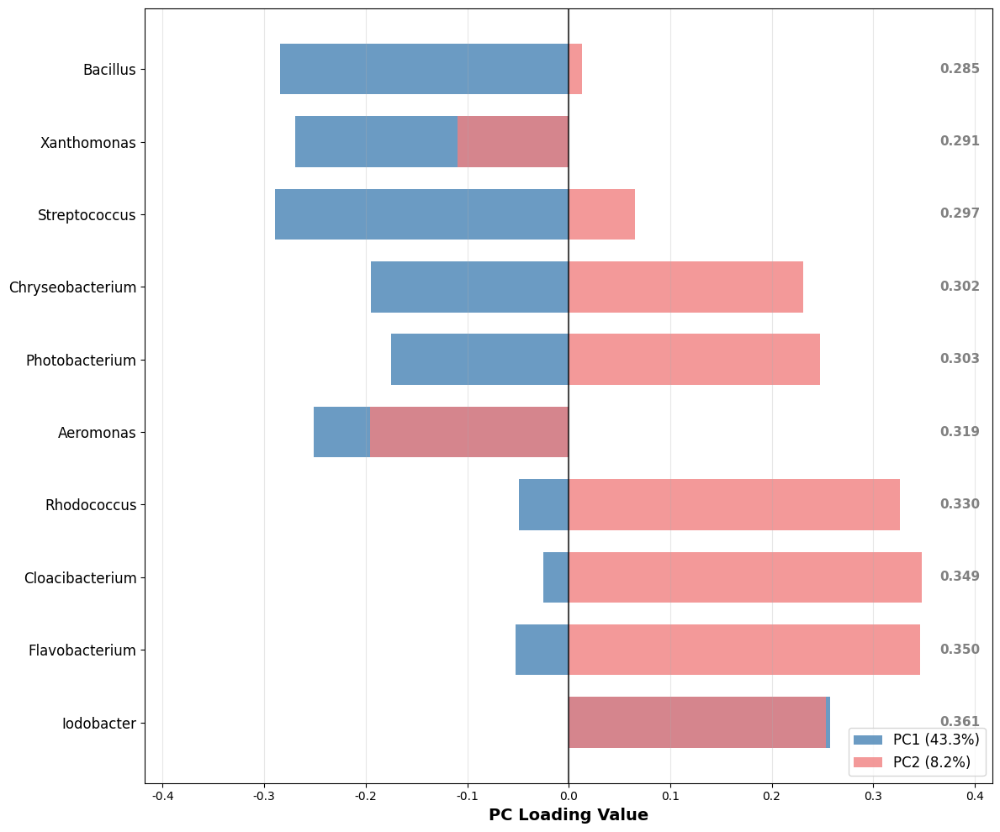

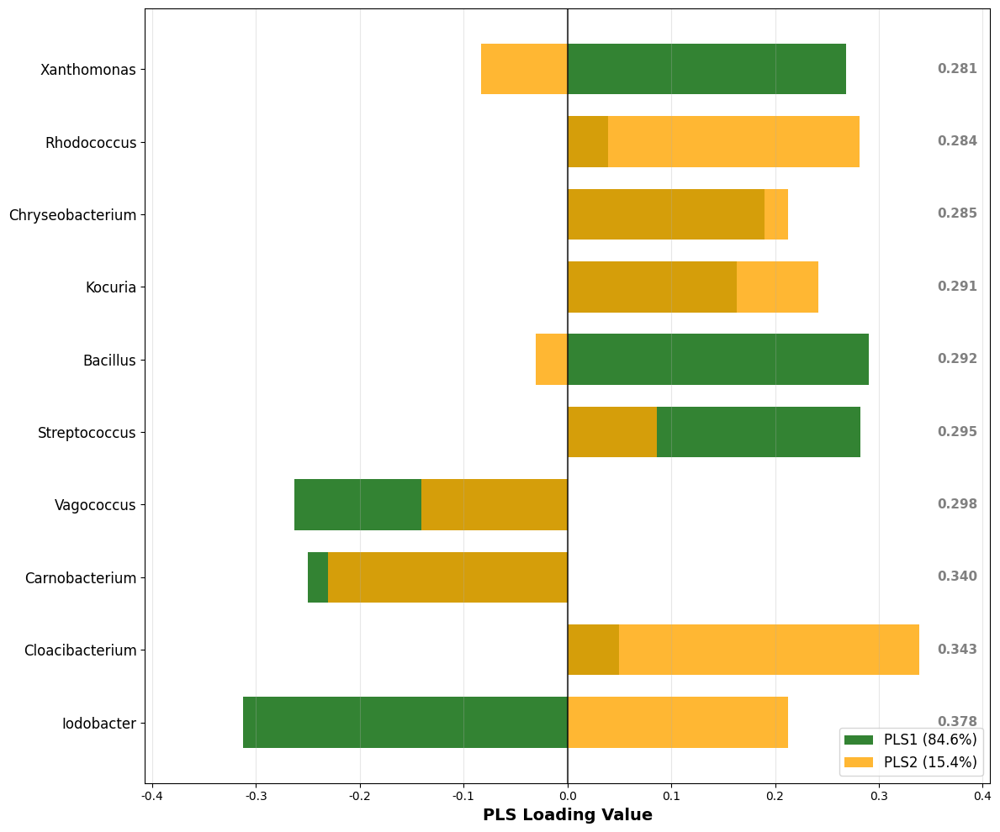

=== PCA Top 10 Feature Ranking (Vector Magnitude 내림차순) ===
 1위. Iodobacter                     | Magnitude: 0.3613
 2위. Flavobacterium                 | Magnitude: 0.3500
 3위. Cloacibacterium                | Magnitude: 0.3488
 4위. Rhodococcus                    | Magnitude: 0.3301
 5위. Aeromonas                      | Magnitude: 0.3188
 6위. Photobacterium                 | Magnitude: 0.3030
 7위. Chryseobacterium               | Magnitude: 0.3023
 8위. Streptococcus                  | Magnitude: 0.2968
 9위. Xanthomonas                    | Magnitude: 0.2906
10위. Bacillus                       | Magnitude: 0.2851

=== PLS-DA Top 10 Feature Ranking (Vector Magnitude 내림차순) ===
 1위. Iodobacter                     | Magnitude: 0.3779
 2위. Cloacibacterium                | Magnitude: 0.3427
 3위. Carnobacterium                 | Magnitude: 0.3400
 4위. Vagococcus                     | Magnitude: 0.2983
 5위. Streptococcus                  | Magnitude: 0.2948
 6위. Bacillus                       | 

In [12]:
# Genus level PCA & PLS-DA Top 10 Feature Ranking (Vector Magnitude 기준) - 개별 출력

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression

level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()

if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    X_vip = level_data['features'][vip_features]
    tpc = level_data['tpc']
    y = tpc_labeling(tpc)
    
    # PCA 분석
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings_pca = pca.components_.T
    exp_var_pca = pca.explained_variance_ratio_ * 100
    
    # PLS-DA 분석
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1
    
    plsda = PLSRegression(n_components=2, scale=False)
    X_pls_transformed = plsda.fit_transform(X_vip, y_onehot)[0]
    loadings_pls = plsda.x_weights_
    
    # PLS explained variance 수정된 계산
    exp_var_pls = np.var(X_pls_transformed, axis=0) / np.sum(np.var(X_pls_transformed, axis=0)) * 100
    
    # Vector magnitude 계산
    magnitude_pca = np.sqrt(loadings_pca[:, 0]**2 + loadings_pca[:, 1]**2)
    magnitude_pls = np.sqrt(loadings_pls[:, 0]**2 + loadings_pls[:, 1]**2)
    
    # Top 10 선택 (magnitude 기준, 내림차순)
    top10_idx_pca = np.argsort(magnitude_pca)[-10:][::-1]  # [::-1]이 내림차순!
    top10_idx_pls = np.argsort(magnitude_pls)[-10:][::-1]  # [::-1]이 내림차순!
    
    # Feature 이름에서 g__ 제거
    feature_names_clean = [f.replace('g__', '') for f in vip_features]
    
    # 1. PCA Top 10 Feature Plot
    top10_features_pca = [feature_names_clean[i] for i in top10_idx_pca]
    top10_pc1 = loadings_pca[top10_idx_pca, 0]
    top10_pc2 = loadings_pca[top10_idx_pca, 1]
    top10_mag_pca = magnitude_pca[top10_idx_pca]
    
    # 이미 내림차순으로 정렬되어 있음 (magnitude가 큰 순서대로)
    y_pos = np.arange(len(top10_features_pca))
    
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # PC1 (음수로 표시)
    bars1 = ax.barh(y_pos, -top10_pc1, height=0.7,
                     label=f"PC1 ({exp_var_pca[0]:.1f}%)",
                     alpha=0.8, color='steelblue')
    # PC2 (양수로 표시)
    bars2 = ax.barh(y_pos, top10_pc2, height=0.7,
                     label=f"PC2 ({exp_var_pca[1]:.1f}%)",
                     alpha=0.8, color='lightcoral')
    
    # Magnitude 값 표시 (오른쪽에)
    for i, mag in enumerate(top10_mag_pca):
        ax.text(max(np.abs(top10_pc2))*1.05, i, f'{mag:.3f}', 
                ha='left', va='center', fontsize=11, fontweight='bold', color='gray')
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(top10_features_pca, fontsize=12)
    ax.set_xlabel('PC Loading Value', fontsize=14, fontweight='bold')

    ax.legend(fontsize=12, loc='lower right')
    ax.axvline(x=0, color='black', linestyle='-', linewidth=1.5, alpha=0.7)
    ax.grid(True, alpha=0.3, axis='x')
    
    max_val_pca = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val_pca*1.2, max_val_pca*1.2)
    
    plt.tight_layout()
    plt.show()
    
    # 2. PLS-DA Top 10 Feature Plot
    top10_features_pls = [feature_names_clean[i] for i in top10_idx_pls]
    top10_pls1 = loadings_pls[top10_idx_pls, 0]
    top10_pls2 = loadings_pls[top10_idx_pls, 1]
    top10_mag_pls = magnitude_pls[top10_idx_pls]
    
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # PLS1 (음수로 표시)
    bars3 = ax.barh(y_pos, -top10_pls1, height=0.7,
                     label=f"PLS1 ({exp_var_pls[0]:.1f}%)",
                     alpha=0.8, color='darkgreen')
    # PLS2 (양수로 표시)
    bars4 = ax.barh(y_pos, top10_pls2, height=0.7,
                     label=f"PLS2 ({exp_var_pls[1]:.1f}%)",
                     alpha=0.8, color='orange')
    
    # Magnitude 값 표시 (오른쪽에)
    for i, mag in enumerate(top10_mag_pls):
        ax.text(max(np.abs(top10_pls2))*1.05, i, f'{mag:.3f}', 
                ha='left', va='center', fontsize=11, fontweight='bold', color='gray')
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(top10_features_pls, fontsize=12)
    ax.set_xlabel('PLS Loading Value', fontsize=14, fontweight='bold')

    ax.legend(fontsize=12, loc='lower right')
    ax.axvline(x=0, color='black', linestyle='-', linewidth=1.5, alpha=0.7)
    ax.grid(True, alpha=0.3, axis='x')
    
    max_val_pls = max(np.max(np.abs(top10_pls1)), np.max(np.abs(top10_pls2)))
    ax.set_xlim(-max_val_pls*1.2, max_val_pls*1.2)
    
    plt.tight_layout()
    plt.show()
    
    # 결과 출력 (내림차순 순서)
    print("=== PCA Top 10 Feature Ranking (Vector Magnitude 내림차순) ===")
    for rank, (feature, mag) in enumerate(zip(top10_features_pca, top10_mag_pca), 1):
        print(f"{rank:2d}위. {feature:<30} | Magnitude: {mag:.4f}")
    
    print("\n=== PLS-DA Top 10 Feature Ranking (Vector Magnitude 내림차순) ===")
    for rank, (feature, mag) in enumerate(zip(top10_features_pls, top10_mag_pls), 1):
        print(f"{rank:2d}위. {feature:<30} | Magnitude: {mag:.4f}")

print("="*80)

## Heat map (Corrleation)
- 일단 Genus level로


=== Phylum VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===


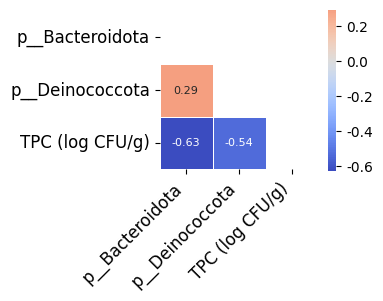


=== Class VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===


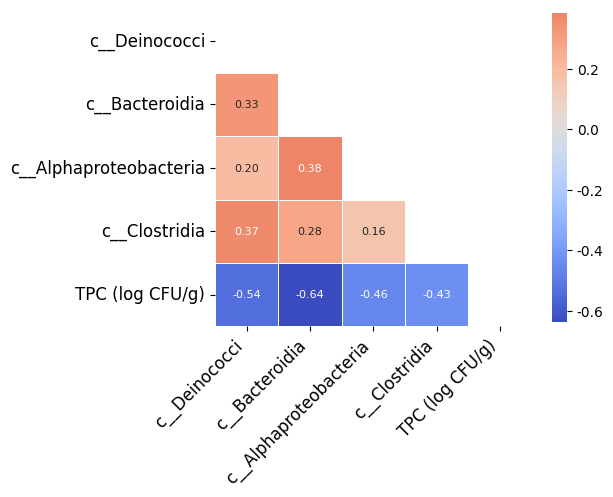


=== Order VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===


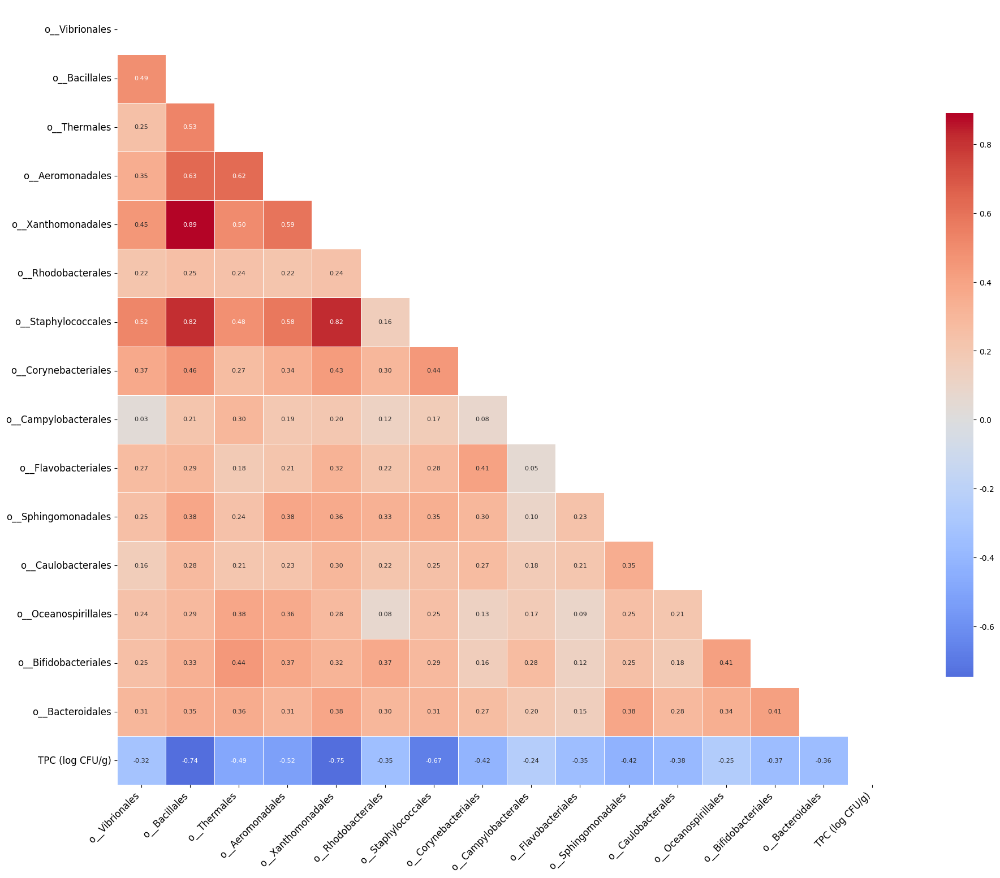


=== Family VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===


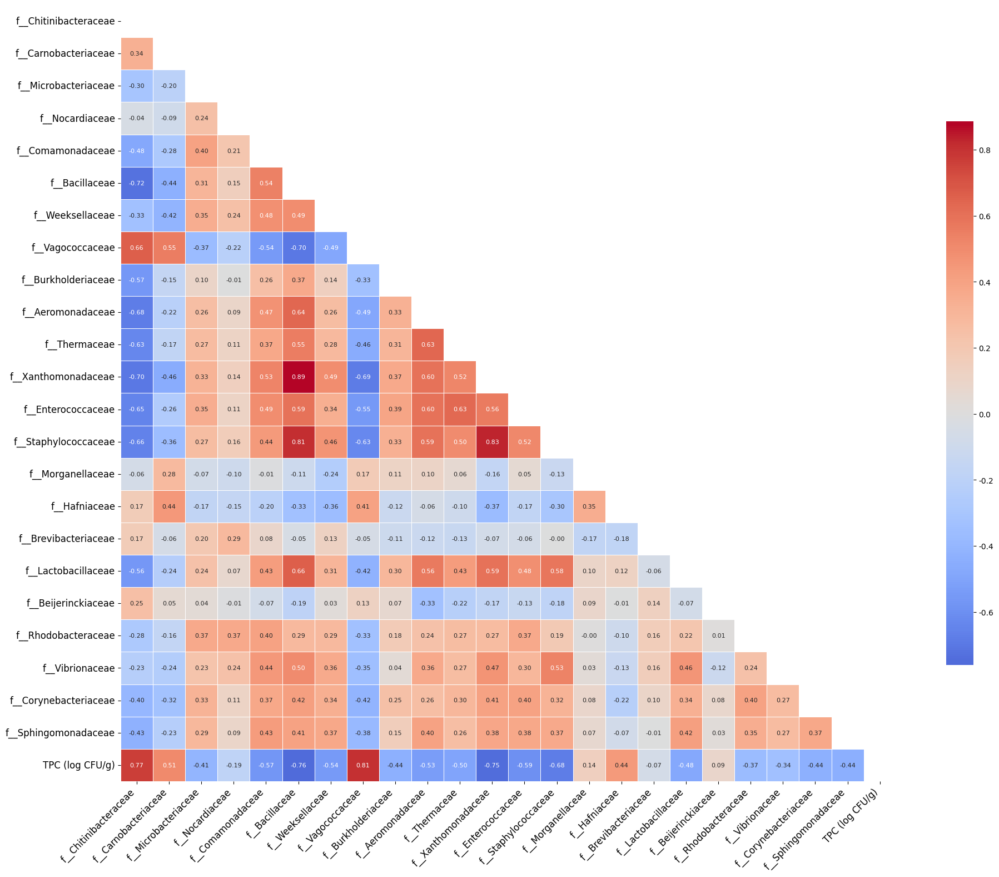


=== Genus VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===


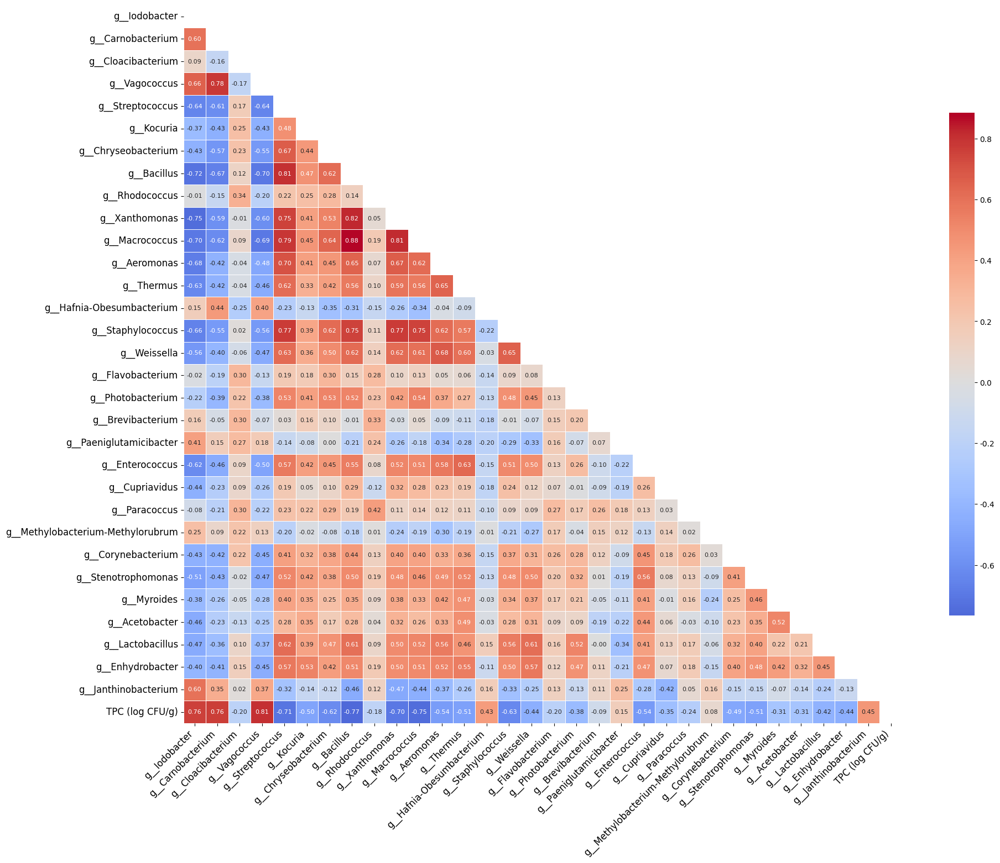

In [19]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

level_names = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

for level_name in level_names:
    print(f"\n=== {level_name} VIP>1.0 Feature + TPC/TBARS Correlation Heatmap (TPC 기준, 하삼각형, 상관계수 표시) ===")
    level_data = get_level_data(level_name)
    if level_data is None:
        print(f"{level_name}: 데이터 없음, 스킵")
        continue
    # VIP>1.0 feature 추출 (TPC 기준)
    if level_name not in vip_over1_dict:
        print(f"{level_name}: VIP Score 데이터 없음, 스킵")
        continue
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X_vip = level_data['features'][vip_features]
    X_corr = X_vip.copy()
    X_corr['TPC (log CFU/g)'] = level_data['tpc']

    corr_matrix = X_corr.corr()
    
    # 상삼각형 마스크 생성 (대각선 위쪽 숨기기)
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    
    plt.figure(figsize=(min(1.2*len(X_corr.columns), 20), min(1.2*len(X_corr.columns), 16)))
    sns.heatmap(
        corr_matrix, 
        mask=mask,  # 상삼각형 마스크 적용
        cmap='coolwarm', 
        center=0, 
        square=True, 
        linewidths=0.5, 
        cbar_kws={"shrink": 0.7},
        xticklabels=True, 
        yticklabels=True,
        annot=True,  # 상관계수 수치 표시
        fmt='.2f',   # 소수점 2자리까지 표시
        annot_kws={'size': 8}  # 텍스트 크기 조절
    )

    plt.tight_layout()
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(rotation=0, fontsize=12)
    plt.show()

## TBARS도 확인


=== Phylum Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===
원본 유의 Feature 수: 12
괄호 제거 후 유의 Feature 수: 11
제거된 Feature 수: 1
VIP > 1.0 Feature 개수: 2 / 11


,Feature,VIP_Score
0,p__Bacteroidota,2.269432
1,p__Deinococcota,2.229999



=== Class Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===
원본 유의 Feature 수: 13
괄호 제거 후 유의 Feature 수: 12
제거된 Feature 수: 1
VIP > 1.0 Feature 개수: 4 / 12


,Feature,VIP_Score
0,c__Deinococci,1.854654
1,c__Alphaproteobacteria,1.640934
2,c__Bacteroidia,1.442345
3,c__Clostridia,1.438028



=== Order Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===
원본 유의 Feature 수: 48
괄호 제거 후 유의 Feature 수: 45
제거된 Feature 수: 3
VIP > 1.0 Feature 개수: 16 / 45


,Feature,VIP_Score
0,o__Vibrionales,1.919827
1,o__Bacillales,1.897694
2,o__Xanthomonadales,1.888262
3,o__Aeromonadales,1.757412
4,o__Rhizobiales,1.735549
5,o__Staphylococcales,1.684101
6,o__Rhodobacterales,1.574070
7,o__Exiguobacterales,1.573616
8,o__Campylobacterales,1.545909
9,o__Caulobacterales,1.348673



=== Family Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===
원본 유의 Feature 수: 85
괄호 제거 후 유의 Feature 수: 79
제거된 Feature 수: 6
VIP > 1.0 Feature 개수: 29 / 79


,Feature,VIP_Score
0,f__Flavobacteriaceae,2.446101
1,f__Vagococcaceae,1.927091
2,f__Chitinibacteraceae,1.876512
3,f__Microbacteriaceae,1.791631
4,f__Bacillaceae,1.787527
5,f__Xanthomonadaceae,1.665805
6,f__Beijerinckiaceae,1.653532
7,f__Vibrionaceae,1.635206
8,f__Aeromonadaceae,1.634545
9,f__Dermacoccaceae,1.577620



=== Genus Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===
원본 유의 Feature 수: 133
괄호 제거 후 유의 Feature 수: 110
제거된 Feature 수: 23
VIP > 1.0 Feature 개수: 36 / 110


,Feature,VIP_Score
0,g__Flavobacterium,2.282850
1,g__Carnobacterium,2.146907
2,g__Vagococcus,2.093435
3,g__Rothia,2.062523
4,g__Streptococcus,2.033340
5,g__Iodobacter,1.983406
6,g__Bacillus,1.947365
7,g__Methylobacterium-Methylorubrum,1.903820
8,g__Macrococcus,1.889394
9,g__Xanthomonas,1.854120



=== 모든 Level VIP > 1.0 Feature (전처리된 TBARS 기준, 괄호 제거) 추출 완료 ===


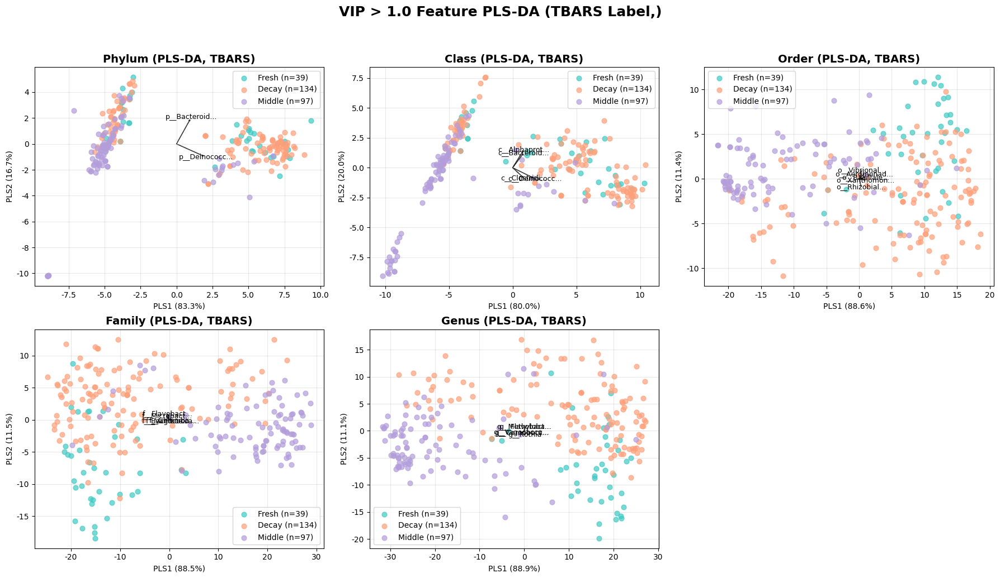

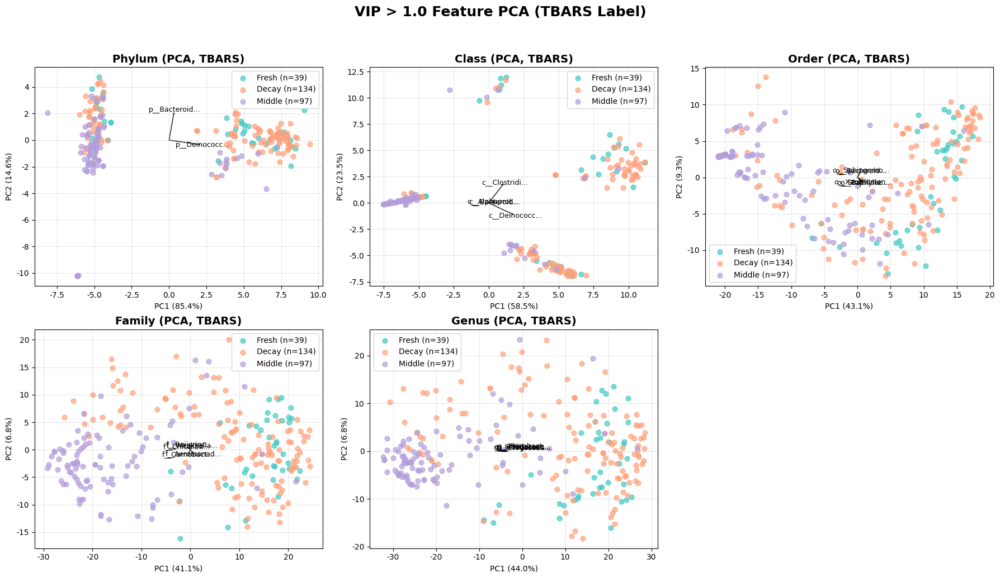

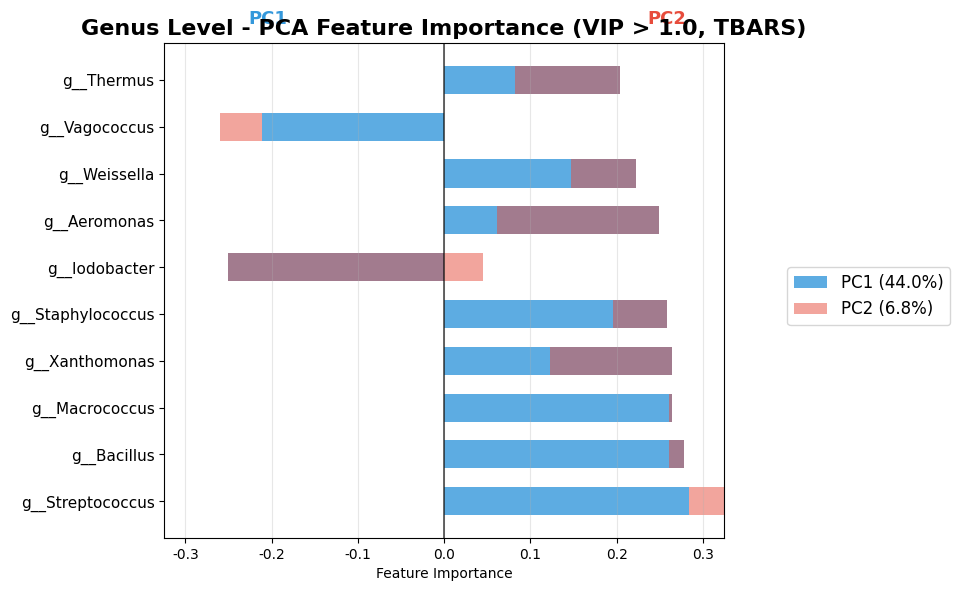

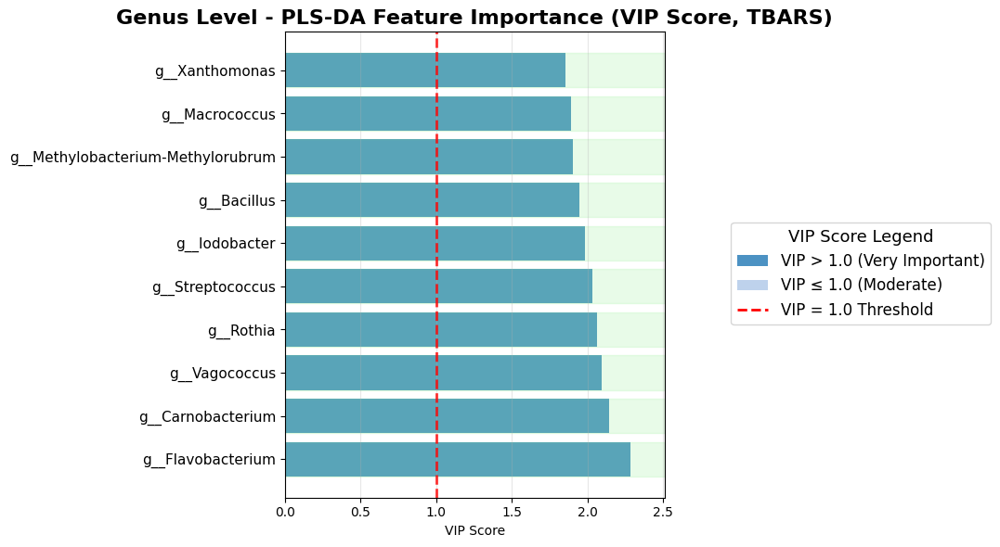

In [14]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from IPython.display import display

# TBARS 라벨링 함수 (임계값 반영)
def tbars_labeling(tbars_series):
    return np.where(
        tbars_series < 0.189, 0,
        np.where(tbars_series < 0.289, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

level_names = ['Phylum', 'Class', 'Order', 'Family', 'Genus']
colors = {0: "#40c9c3", 1: "#ffa07a", 2: "#b39ddb"}
label_names = {0: "Fresh", 1: "Decay", 2: "Middle"}

# 1. VIP Score 1.0 이상 feature display 및 저장 (괄호 제거, 전처리된 TBARS 사용)
vip_score_tbars = {}

for level_name in level_names:
    print(f"\n{'='*60}")
    print(f"=== {level_name} Level: VIP Score > 1.0 (전처리된 TBARS 기준, 괄호 제거) ===")
    print(f"{'='*60}")

    level_data = get_level_data(level_name)
    
    # 괄호가 붙은 feature 제거
    all_significant_features = level_data['significant_features']
    filtered_significant_features = [feat for feat in all_significant_features if '(' not in feat]
    
    print(f"원본 유의 Feature 수: {len(all_significant_features)}")
    print(f"괄호 제거 후 유의 Feature 수: {len(filtered_significant_features)}")
    print(f"제거된 Feature 수: {len(all_significant_features) - len(filtered_significant_features)}")
    
    if len(filtered_significant_features) == 0:
        print("괄호 제거 후 사용 가능한 유의 Feature가 없습니다.")
        vip_score_tbars[level_name] = pd.DataFrame(columns=['Feature', 'VIP_Score'])
        continue
    
    X = level_data['features'][filtered_significant_features]
    # 🔥 핵심 수정: 전처리된 TBARS 사용
    y = tbars_labeling(level_data['tbars_preprocessed'])

    # One-hot encoding
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1

    # PLS-DA
    plsda = PLSRegression(n_components=2, scale=False)
    plsda.fit(X, y_onehot)

    # VIP score 계산
    x_weights = plsda.x_weights_
    SS = np.sum(x_weights**2, axis=1)
    vip_scores = np.sqrt(len(X.columns) * SS / np.sum(SS))

    vip_df = pd.DataFrame({
        'Feature': X.columns,
        'VIP_Score': vip_scores
    }).sort_values('VIP_Score', ascending=False)

    vip_over1 = vip_df[vip_df['VIP_Score'] > 1.0].reset_index(drop=True)
    vip_score_tbars[level_name] = vip_over1

    print(f"VIP > 1.0 Feature 개수: {len(vip_over1)} / {len(vip_df)}")
    if len(vip_over1) > 0:
        display(vip_over1)
    else:
        print("VIP > 1.0인 Feature가 없습니다.")

print("\n=== 모든 Level VIP > 1.0 Feature (전처리된 TBARS 기준, 괄호 제거) 추출 완료 ===")

# 2. PLS-DA scatter (전처리된 TBARS 기준)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, level_name in enumerate(level_names):
    level_data = get_level_data(level_name)
    # 🔥 핵심 수정: 전처리된 TBARS 사용
    tbars = level_data['tbars_preprocessed']
    y = tbars_labeling(tbars)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X_vip = level_data['features'][vip_features]

    # PLS-DA
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1
    plsda = PLSRegression(n_components=2, scale=False)
    X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
    exp_var = np.var(X_pls, axis=0) / np.sum(np.var(X_pls, axis=0)) * 100

    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pls[y == label, 0], X_pls[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 벡터(loading) 추가: 상위 5개만
    loadings = plsda.x_weights_
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PLS-DA, TBARS)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PLS1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PLS2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')

for j in range(len(level_names), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PLS-DA (TBARS Label,)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 3. PCA scatter (전처리된 TBARS 기준)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, level_name in enumerate(level_names):
    level_data = get_level_data(level_name)
    # 🔥 핵심 수정: 전처리된 TBARS 사용
    tbars = level_data['tbars_preprocessed']
    y = tbars_labeling(tbars)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X_vip = level_data['features'][vip_features]

    # PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_vip)
    exp_var = pca.explained_variance_ratio_ * 100

    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pca[y == label, 0], X_pca[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 벡터(loading) 추가: 상위 5개만
    loadings = pca.components_.T
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PCA, TBARS)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PC1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PC2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')

for j in range(len(level_names), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PCA (TBARS Label)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 4. Genus level mirror bar chart (전처리된 TBARS 기준, PCA/PLS-DA)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if vip_features:
    # PCA mirror bar chart (Top 10)
    X_vip = level_data['features'][vip_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]
    ind = np.arange(len(top10_features))
    height = 0.6
    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=top10_pc1, alpha=0.5)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (VIP > 1.0, TBARS)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

    # VIP Score mirror bar chart (Top 10, PLS-DA)
    vip_df = vip_score_tbars[level_name]
    top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
    top10_features_vip = top10_vip['Feature'].values
    top10_scores = top10_vip['VIP_Score'].values
    fig, ax = plt.subplots(figsize=(8, 6))
    bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(top10_features_vip, fontsize=11)
    ax.set_xlabel('VIP Score')
    ax.set_title('Genus Level - PLS-DA Feature Importance (VIP Score, TBARS)', fontsize=16, fontweight='bold')
    ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
    ax.grid(True, alpha=0.3, axis='x')
    for i in range(np.sum(top10_scores > 1.0)):
        ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
    ax.set_xlim(0, max(top10_scores)*1.1)
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
        plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
        plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
    ]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

## TBARS 기준으로 뽑힌 VIP Score 1.0 Feature 상관관계 분석

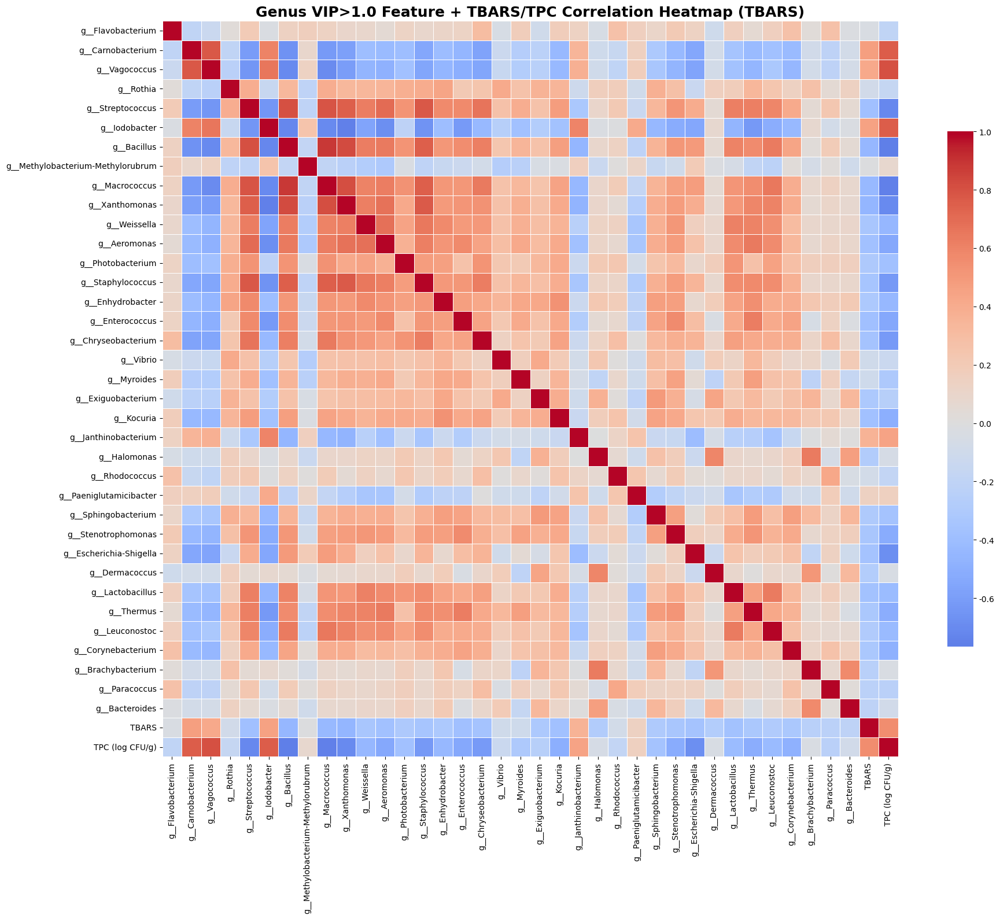

In [15]:
# TBARS 기준 VIP > 1.0 feature의 Genus level 상관관계 분석 Heatmap

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Genus level 데이터 및 VIP > 1.0 feature 추출
level_name = 'Genus'
level_data = get_level_data(level_name)
if level_data is None:
    print(f"{level_name}: 데이터 없음, 스킵")
else:
    # TBARS 기준 VIP > 1.0 feature 리스트
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
    else:
        # Feature + TBARS + TPC 데이터프레임 생성
        X_vip = level_data['features'][vip_features].copy()
        X_vip['TBARS'] = level_data['tbars']
        X_vip['TPC (log CFU/g)'] = level_data['tpc']

        # 상관계수 행렬 계산
        corr_matrix = X_vip.corr()

        # 히트맵 시각화
        plt.figure(figsize=(min(1.2*len(X_vip.columns), 20), min(1.2*len(X_vip.columns), 16)))
        sns.heatmap(
            corr_matrix,
            cmap='coolwarm',
            center=0,
            square=True,
            linewidths=0.5,
            cbar_kws={"shrink": 0.7},
            xticklabels=True,
            yticklabels=True,
            annot=False
        )
        plt.title('Genus VIP>1.0 Feature + TBARS/TPC Correlation Heatmap (TBARS)', fontsize=18, fontweight='bold')
        plt.tight_layout()
        plt.xticks(rotation=90)
        plt.show()

## PC1 VIP Score Feature Importance 

/var/folders/f5/vpc6wvfd0d9g1tdw0h3gqqcc0000gn/T/ipykernel_8119/2872172160.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f'{abs(x):.3f}' for x in ax.get_xticks()])


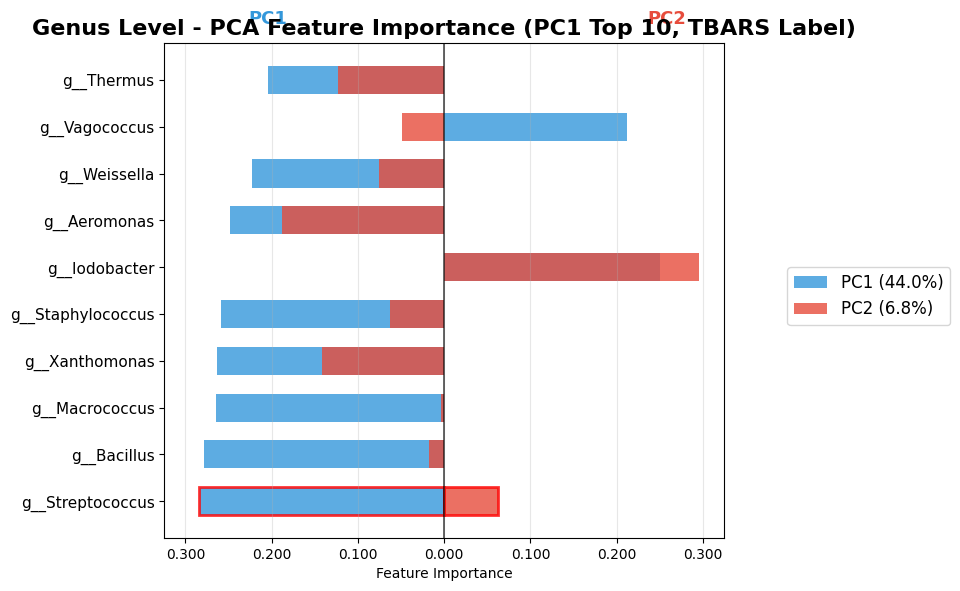

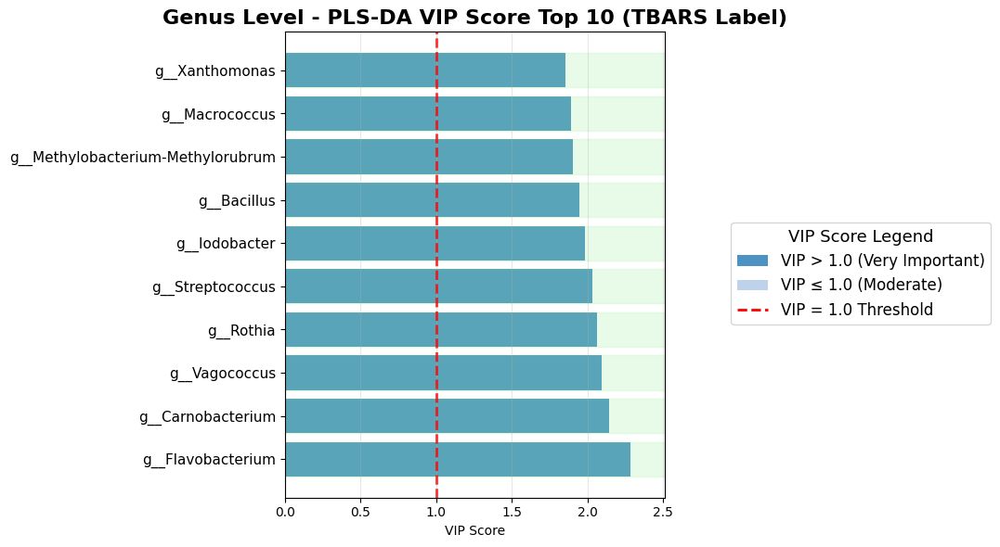

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. TBARS 기준 Genus level PC1 Top 10 mirror bar chart
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    X_vip = level_data['features'][vip_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100

    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]

    ind = np.arange(len(top10_features))
    height = 0.6

    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, -top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', alpha=0.8)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (PC1 Top 10, TBARS Label)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    bars1[0].set_edgecolor('red'); bars1[0].set_linewidth(2)
    bars2[0].set_edgecolor('red'); bars2[0].set_linewidth(2)
    ax.set_xticklabels([f'{abs(x):.3f}' for x in ax.get_xticks()])
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

# 2. TBARS 기준 Genus level VIP Score Top 10 mirror bar chart
vip_df = vip_score_tbars[level_name]
top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
top10_features_vip = top10_vip['Feature'].values
top10_scores = top10_vip['VIP_Score'].values

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
ax.set_yticks(np.arange(10))
ax.set_yticklabels(top10_features_vip, fontsize=11)
ax.set_xlabel('VIP Score')
ax.set_title('Genus Level - PLS-DA VIP Score Top 10 (TBARS Label)', fontsize=16, fontweight='bold')
ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
ax.grid(True, alpha=0.3, axis='x')
for i in range(np.sum(top10_scores > 1.0)):
    ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
ax.set_xlim(0, max(top10_scores)*1.1)
legend_elements = [
    plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
    plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
    plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
]
fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.show()

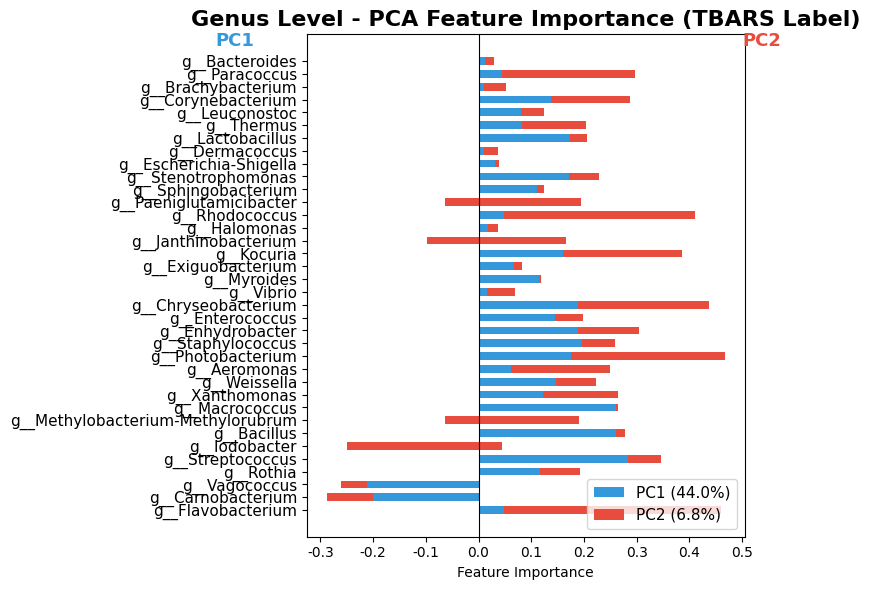

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Genus level mirror bar chart (TBARS 기준)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    X_vip = level_data['features'][vip_features]

    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T  # shape: (feature, PC)
    exp_var = pca.explained_variance_ratio_ * 100

    feature_names = vip_features
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]

    ind = np.arange(len(feature_names))
    height = 0.6

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.barh(ind, pc1_loadings, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)')
    ax.barh(ind, pc2_loadings, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=pc1_loadings)

    ax.set_yticks(ind)
    ax.set_yticklabels(feature_names, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (TBARS Label)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=0.8)
    ax.legend(loc='lower right', fontsize=11)
    ax.text(-0.5, len(feature_names)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(0.5, len(feature_names)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')

    plt.tight_layout()
    plt.show()

## TPC 분류 모델 학습 

In [18]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# TPC 라벨링 함수
def tpc_labeling(tpc_series):
    return np.where(
        tpc_series < 3.927, 0, 
        np.where(tpc_series < 5.368, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

# 모델 및 파라미터 그리드 정의
model_configs = {
    "RandomForest": {
        "model": RandomForestClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "min_samples_split": [2, 5]
        }
    },
    "XGBoost": {
        "model": XGBClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "learning_rate": [0.05, 0.1]
        }
    },
    "SVC": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('svc', SVC(probability=True, class_weight="balanced"))
        ]),
        "params": {
            "svc__C": [0.5, 1, 2],
            "svc__gamma": ["scale", "auto"],
            "svc__kernel": ["rbf"]
        }
    },
    "LogisticRegression": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('lr', LogisticRegression())
        ]),
        "params": {
            "lr__penalty": ["elasticnet"],
            "lr__solver": ["saga"],
            "lr__l1_ratio": [0.2, 0.5, 0.8],
            "lr__C": [0.5, 1, 2],
            "lr__max_iter": [500],
            "lr__class_weight": ["balanced"],
            "lr__multi_class": ["multinomial"]
        }
    },
    "KNN": {
        "model": KNeighborsClassifier,
        "params": {
            "n_neighbors": [3, 5, 7],
            "weights": ["uniform", "distance"]
        }
    }
}

taxonomy_levels = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

# TPC 분류 모델 학습 (VIP>1.0 Feature만 사용)
all_model_results = {}

for level_name in taxonomy_levels:
    print(f"\n{'='*60}\n=== {level_name} Level 모델 학습 시작 (VIP>1.0 Feature, TPC) ===\n{'='*60}")
    level_data = get_level_data(level_name)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    
    X = level_data['features'][vip_features].values
    y = tpc_labeling(level_data['tpc'].values)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    all_model_results[level_name] = {}

    for model_name, config in model_configs.items():
        print(f"\n--- {model_name} 학습 ---")
        model = config["model"]() if callable(config["model"]) else config["model"]()
        param_grid = config["params"]

        grid = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
        grid.fit(X_train, y_train)

        best_model = grid.best_estimator_
        best_params = grid.best_params_

        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)

        train_acc = accuracy_score(y_train, y_train_pred)
        test_acc = accuracy_score(y_test, y_test_pred)
        train_f1 = f1_score(y_train, y_train_pred, average='macro')
        test_f1 = f1_score(y_test, y_test_pred, average='macro')
        overfit_acc = train_acc - test_acc
        overfit_f1 = train_f1 - test_f1

        all_model_results[level_name][model_name] = {
            "train_accuracy": train_acc,
            "test_accuracy": test_acc,
            "train_f1_score": train_f1,
            "test_f1_score": test_f1,
            "Overfitting_Acc": overfit_acc,
            "Overfitting_F1": overfit_f1,
            "Best_Params": best_params,
            "Best_Model": best_model,
            "GridSearchCV": grid,
            "X_test": X_test,
            "y_test": y_test
        }

        print(f"Train Acc: {train_acc:.3f}, Test Acc: {test_acc:.3f}")
        print(f"Train F1: {train_f1:.3f}, Test F1: {test_f1:.3f}")
        print(f"Overfitting Acc: {overfit_acc:.3f}, Overfitting F1: {overfit_f1:.3f}")
        print(f"Best Params: {best_params}")

print("\n=== TPC 기준 모든 모델 학습 및 평가 완료 ===")


=== Phylum Level 모델 학습 시작 (VIP>1.0 Feature, TPC) ===

--- RandomForest 학습 ---
Train Acc: 0.852, Test Acc: 0.611
Train F1: 0.839, Test F1: 0.548
Overfitting Acc: 0.241, Overfitting F1: 0.291
Best Params: {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 100}

--- XGBoost 학습 ---
Train Acc: 0.875, Test Acc: 0.593
Train F1: 0.866, Test F1: 0.537
Overfitting Acc: 0.282, Overfitting F1: 0.330
Best Params: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 200}

--- SVC 학습 ---
Train Acc: 0.634, Test Acc: 0.630
Train F1: 0.611, Test F1: 0.573
Overfitting Acc: 0.005, Overfitting F1: 0.038
Best Params: {'svc__C': 2, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}

--- LogisticRegression 학습 ---


ValueError: Invalid parameter 'multi_class' for estimator LogisticRegression(C=0.5, class_weight='balanced', l1_ratio=0.5, max_iter=500). Valid parameters are: ['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'].

In [ ]:
# ...existing code...
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
# ...existing code...

In [ ]:
print("vip_features 개수:", len(vip_features))
print("vip_features 리스트:", vip_features)

vip_features 개수: 31
vip_features 리스트: ['g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus', 'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas', 'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus', 'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter', 'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium', 'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium']


In [ ]:

taxonomy_level = 'Genus'
model_name = 'LogisticRegression'

best_model = all_model_results[taxonomy_level][model_name]['Best_Model']
vip_features = vip_over1_dict[taxonomy_level]['Feature'].tolist()
X_test = all_model_results[taxonomy_level][model_name]['X_test']

# DataFrame으로 변환 (컬럼명 지정)
X_test_df = pd.DataFrame(X_test, columns=vip_features)

print("X_test_df shape:", X_test_df.shape)
print("X_test_df columns:", X_test_df.columns.tolist())

X_test_df shape: (54, 31)
X_test_df columns: ['g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus', 'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas', 'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus', 'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter', 'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium', 'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium']


In [ ]:
print("best_model input feature 개수:", X_test_df.shape[1])
print("best_model feature names:", X_test_df.columns.tolist())

best_model input feature 개수: 31
best_model feature names: ['g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus', 'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas', 'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus', 'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter', 'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium', 'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium']


## SHAP 후분석

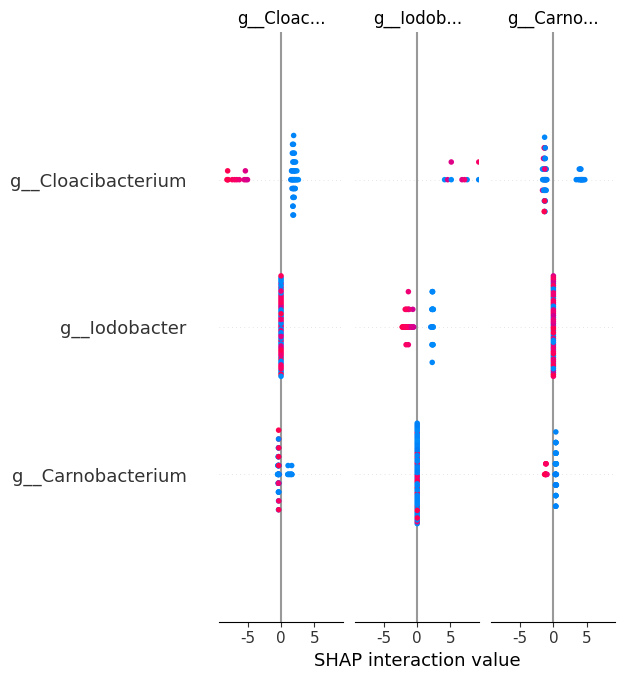

In [ ]:
# ...existing code...
import shap

# best_model: 학습된 모델 (LogisticRegression 등)
# X_test_df: 테스트 데이터 (컬럼명 = vip_features)

explainer = shap.Explainer(best_model.named_steps['lr'], X_test_df)
shap_values = explainer(X_test_df)

# SHAP summary plot
shap.summary_plot(shap_values.values, X_test_df, feature_names=vip_features, show=True)

In [ ]:
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)
print("SHAP 값 평균(절대값):", mean_abs_shap)
print("상위 10개 feature:", np.array(vip_features)[np.argsort(mean_abs_shap)[::-1][:10]])

SHAP 값 평균(절대값): [[1.78033011 0.         6.84707579]
 [0.         0.55391114 0.99560688]
 [0.         0.2982236  2.98821973]
 [2.08398358 0.         3.63263944]
 [0.         1.25161566 2.60505889]
 [0.         2.34633326 2.59454617]
 [0.         0.         1.14103169]
 [2.36879768 0.90570984 0.        ]
 [0.30910305 0.         0.        ]
 [0.         0.85087974 0.25589044]
 [2.0134578  0.         0.14330952]
 [0.         0.24200567 0.        ]
 [0.         0.49820438 0.        ]
 [0.         0.         2.27494253]
 [0.70311893 0.         0.11031723]
 [0.         1.10263629 1.69944752]
 [0.         0.88152475 0.4348848 ]
 [0.13426503 0.         0.        ]
 [0.         0.00752695 1.13456408]
 [0.         0.57768626 0.16803123]
 [0.57563934 0.         1.12238678]
 [2.3521288  1.18201993 0.        ]
 [0.         0.8635985  1.30829577]
 [0.         2.14754248 2.92079429]
 [0.47331798 0.         3.37550033]
 [1.02385636 0.         1.69596826]
 [1.23663689 0.14099119 0.        ]
 [0.35209914

In [ ]:
# SHAP 값 shape: (샘플 수, feature 수, 클래스 수)
# feature별로 평균 절대값 계산 (클래스별로)
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)  # (feature 수, 클래스 수)

# 각 클래스별로 상위 feature 추출
for class_idx, class_name in enumerate(['class_0', 'class_1', 'class_2']):  # 클래스 이름에 맞게 수정
    print(f"\n클래스 {class_name} 상위 10개 feature:")
    top_idx = np.argsort(mean_abs_shap[:, class_idx])[::-1][:10]
    print(np.array(vip_features)[top_idx])


클래스 class_0 상위 10개 feature:
['g__Bacillus' 'g__Cupriavidus' 'g__Enhydrobacter' 'g__Vagococcus'
 'g__Macrococcus' 'g__Iodobacter' 'g__Myroides' 'g__Lactobacillus'
 'g__Stenotrophomonas' 'g__Staphylococcus']

클래스 class_1 상위 10개 feature:
['g__Kocuria' 'g__Methylobacterium-Methylorubrum' 'g__Streptococcus'
 'g__Cupriavidus' 'g__Weissella' 'g__Bacillus' 'g__Flavobacterium'
 'g__Paracoccus' 'g__Xanthomonas' 'g__Janthinobacterium']

클래스 class_2 상위 10개 feature:
['g__Iodobacter' 'g__Vagococcus' 'g__Corynebacterium' 'g__Cloacibacterium'
 'g__Methylobacterium-Methylorubrum' 'g__Streptococcus' 'g__Kocuria'
 'g__Hafnia-Obesumbacterium' 'g__Weissella' 'g__Stenotrophomonas']


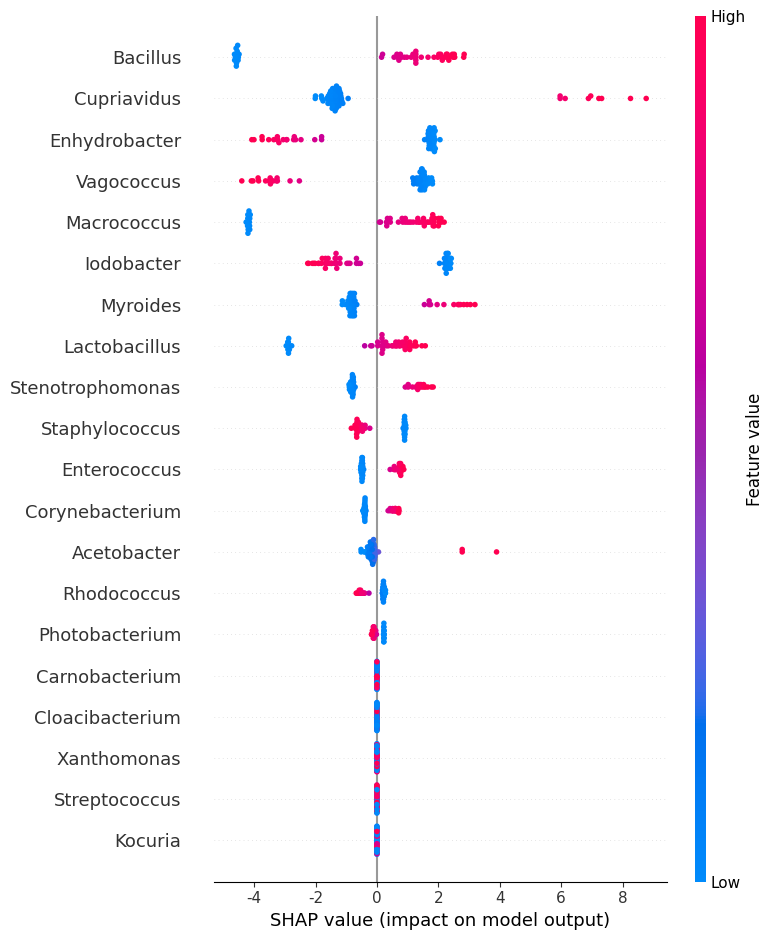

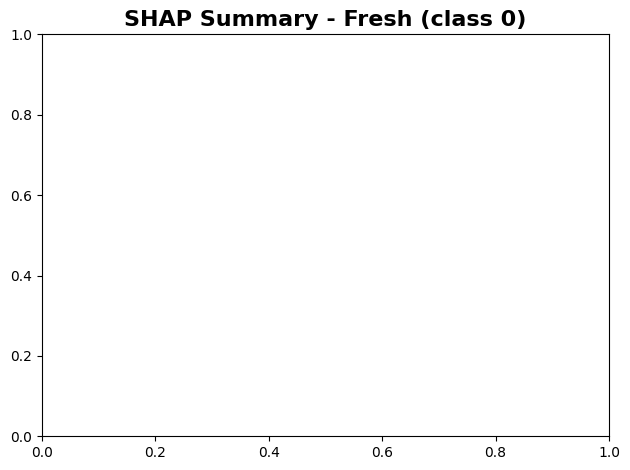

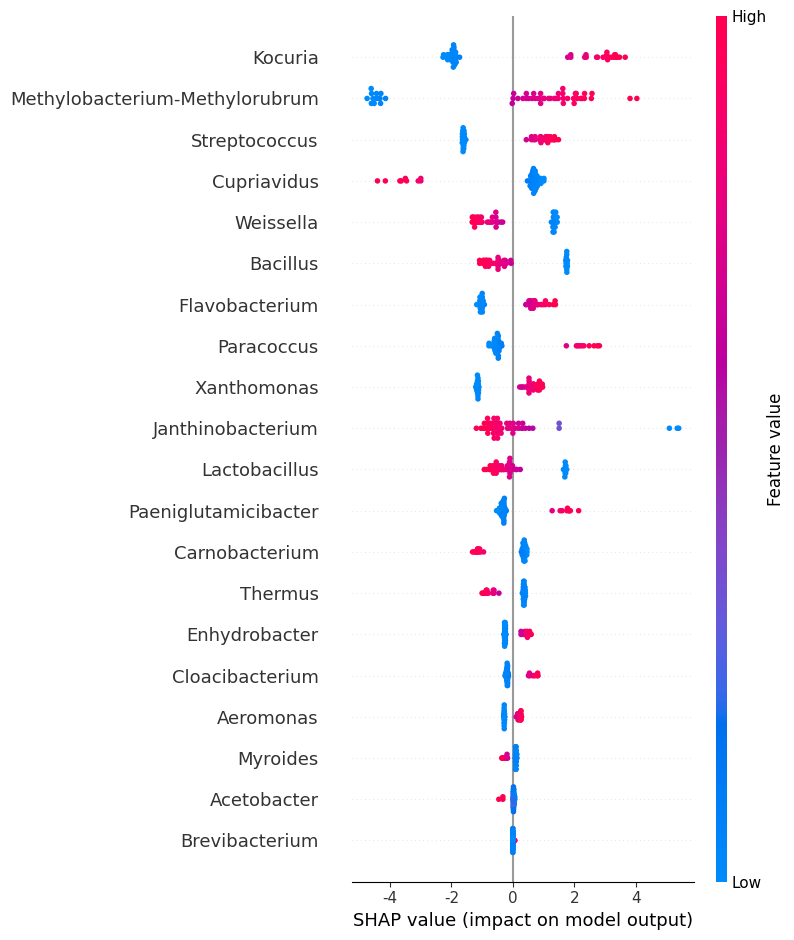

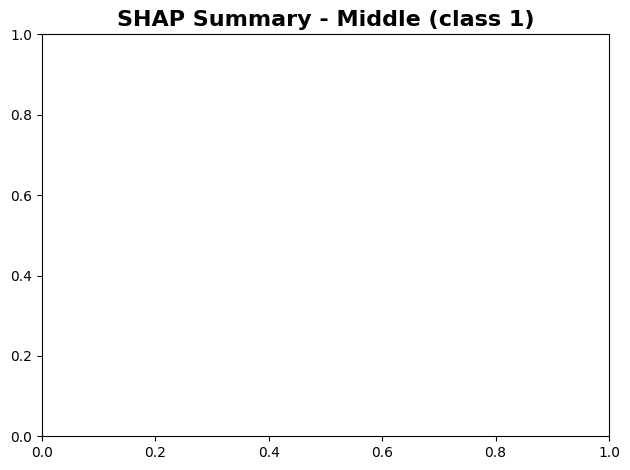

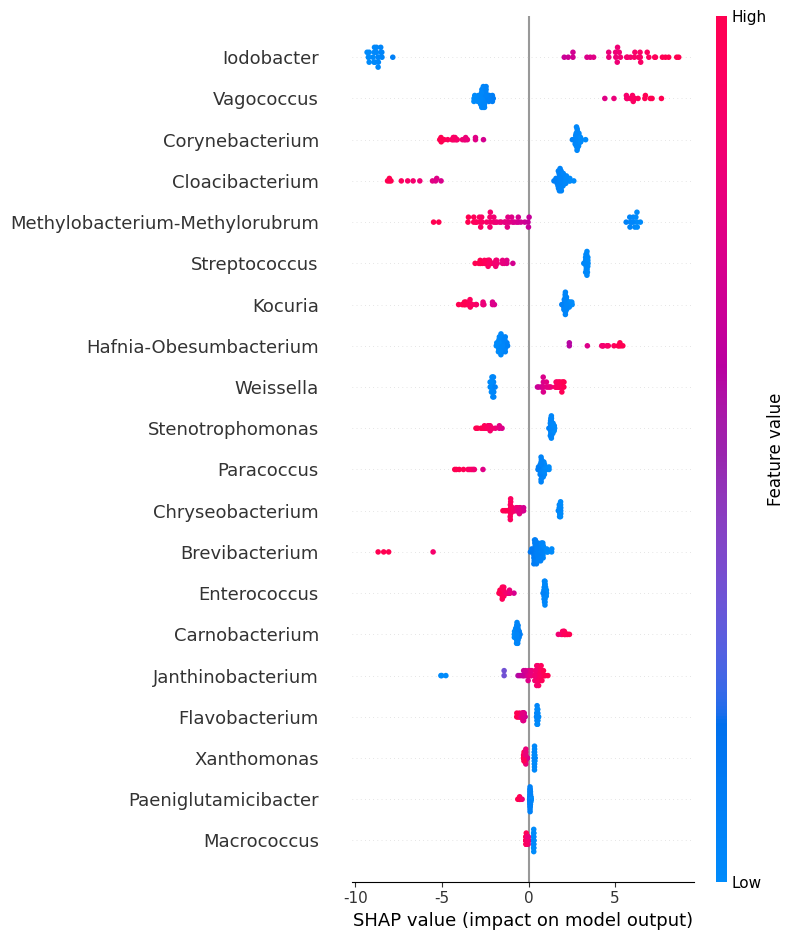

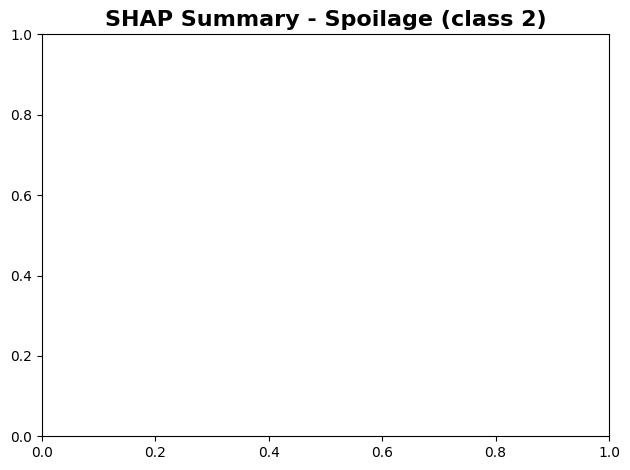

In [ ]:
class_names = ['Fresh', 'Middle', 'Spoilage']  # 클래스명 직접 지정

# g_ 접두사 제거된 feature 이름 리스트 생성
feature_names_short = [f.replace('g__', '') for f in vip_features]

for class_idx in range(shap_values.values.shape[-1]):
    plt.figure(figsize=(10, 7))
    shap.summary_plot(
        shap_values.values[..., class_idx],
        X_test_df,
        feature_names=feature_names_short,  # 접두사 제거된 이름 사용
        show=True
    )
    plt.title(f'SHAP Summary - {class_names[class_idx]} (class {class_idx})', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


=== Fresh Class SHAP Top 20 Features의 VIP Score (SHAP 중요도 순서) ===


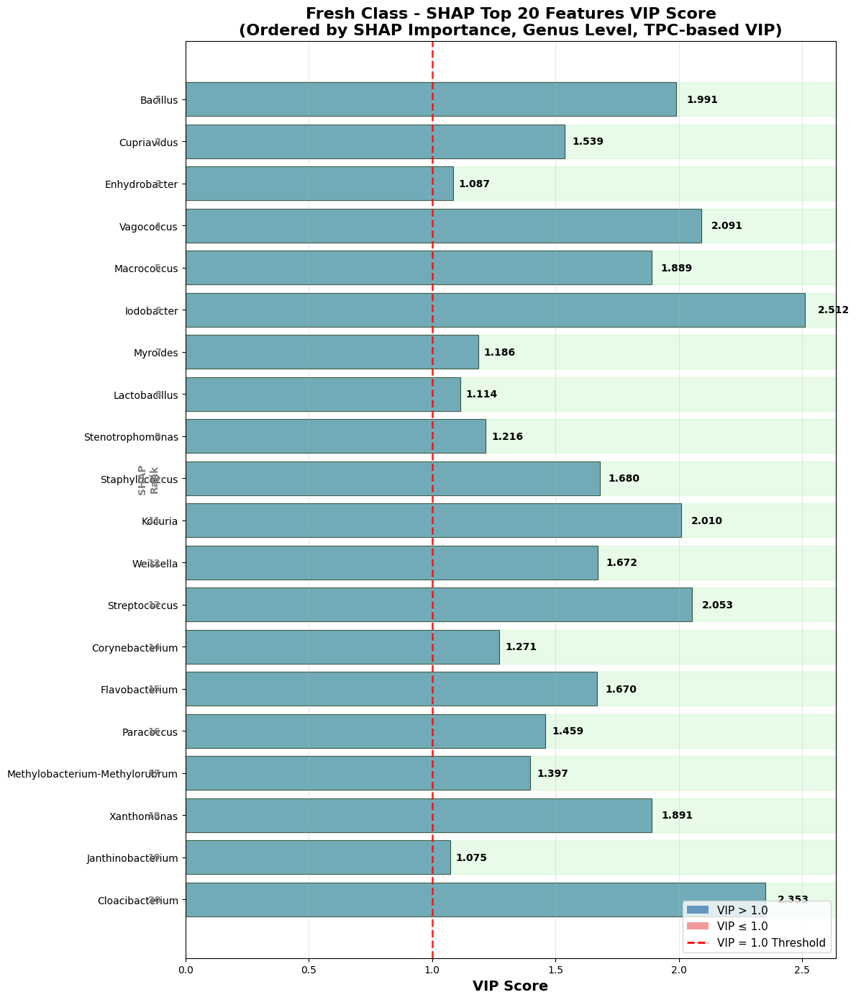


Fresh Class 통계 (SHAP 중요도 순서):
  • 분석된 feature 수: 20
  • VIP > 1.0 feature 수: 20
  • 최고 VIP Score: 2.5125
  • 최저 VIP Score: 1.0750
  • 평균 VIP Score: 1.6578

Fresh Class - SHAP 순서별 VIP Score (Top 20):
   1. Bacillus                       | VIP: 1.9908 🟢
   2. Cupriavidus                    | VIP: 1.5385 🟢
   3. Enhydrobacter                  | VIP: 1.0871 🟢
   4. Vagococcus                     | VIP: 2.0908 🟢
   5. Macrococcus                    | VIP: 1.8892 🟢
   6. Iodobacter                     | VIP: 2.5125 🟢
   7. Myroides                       | VIP: 1.1863 🟢
   8. Lactobacillus                  | VIP: 1.1142 🟢
   9. Stenotrophomonas               | VIP: 1.2159 🟢
  10. Staphylococcus                 | VIP: 1.6798 🟢
  11. Kocuria                        | VIP: 2.0101 🟢
  12. Weissella                      | VIP: 1.6724 🟢
  13. Streptococcus                  | VIP: 2.0527 🟢
  14. Corynebacterium                | VIP: 1.2712 🟢
  15. Flavobacterium                 | VIP: 1.6703 🟢
  16.

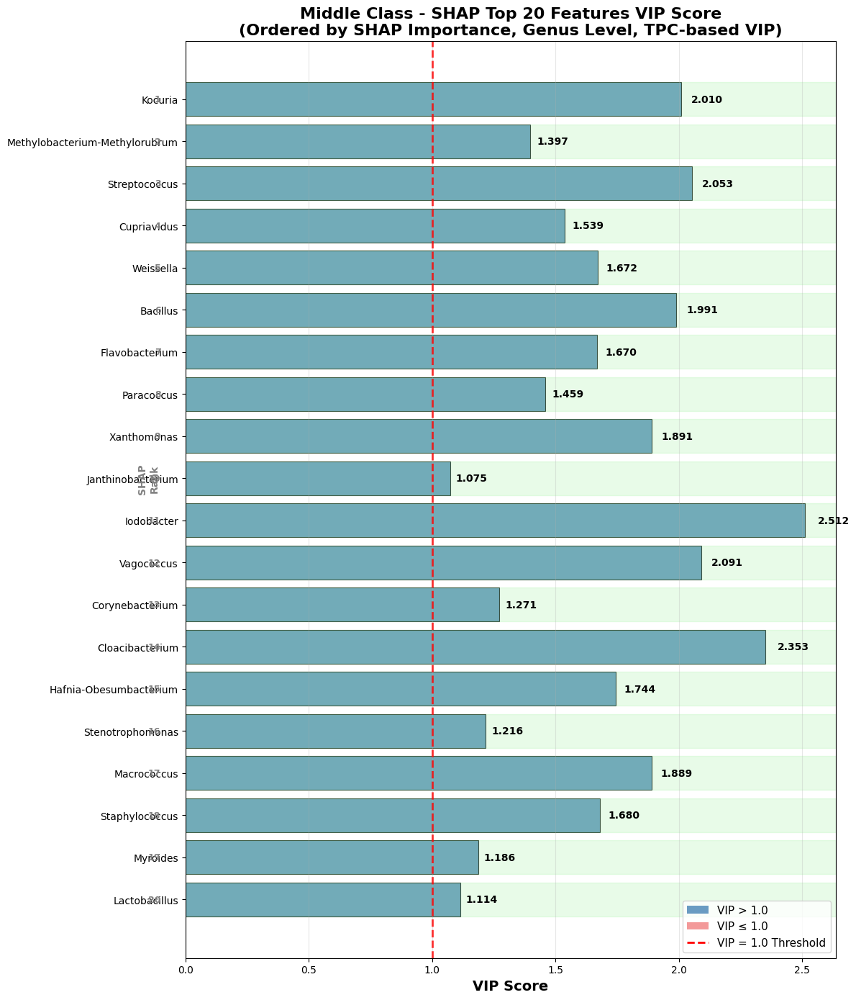


Middle Class 통계 (SHAP 중요도 순서):
  • 분석된 feature 수: 20
  • VIP > 1.0 feature 수: 20
  • 최고 VIP Score: 2.5125
  • 최저 VIP Score: 1.0750
  • 평균 VIP Score: 1.6906

Middle Class - SHAP 순서별 VIP Score (Top 20):
   1. Kocuria                        | VIP: 2.0101 🟢
   2. Methylobacterium-Methylorubrum | VIP: 1.3965 🟢
   3. Streptococcus                  | VIP: 2.0527 🟢
   4. Cupriavidus                    | VIP: 1.5385 🟢
   5. Weissella                      | VIP: 1.6724 🟢
   6. Bacillus                       | VIP: 1.9908 🟢
   7. Flavobacterium                 | VIP: 1.6703 🟢
   8. Paracoccus                     | VIP: 1.4587 🟢
   9. Xanthomonas                    | VIP: 1.8914 🟢
  10. Janthinobacterium              | VIP: 1.0750 🟢
  11. Iodobacter                     | VIP: 2.5125 🟢
  12. Vagococcus                     | VIP: 2.0908 🟢
  13. Corynebacterium                | VIP: 1.2712 🟢
  14. Cloacibacterium                | VIP: 2.3526 🟢
  15. Hafnia-Obesumbacterium         | VIP: 1.7435 🟢
  1

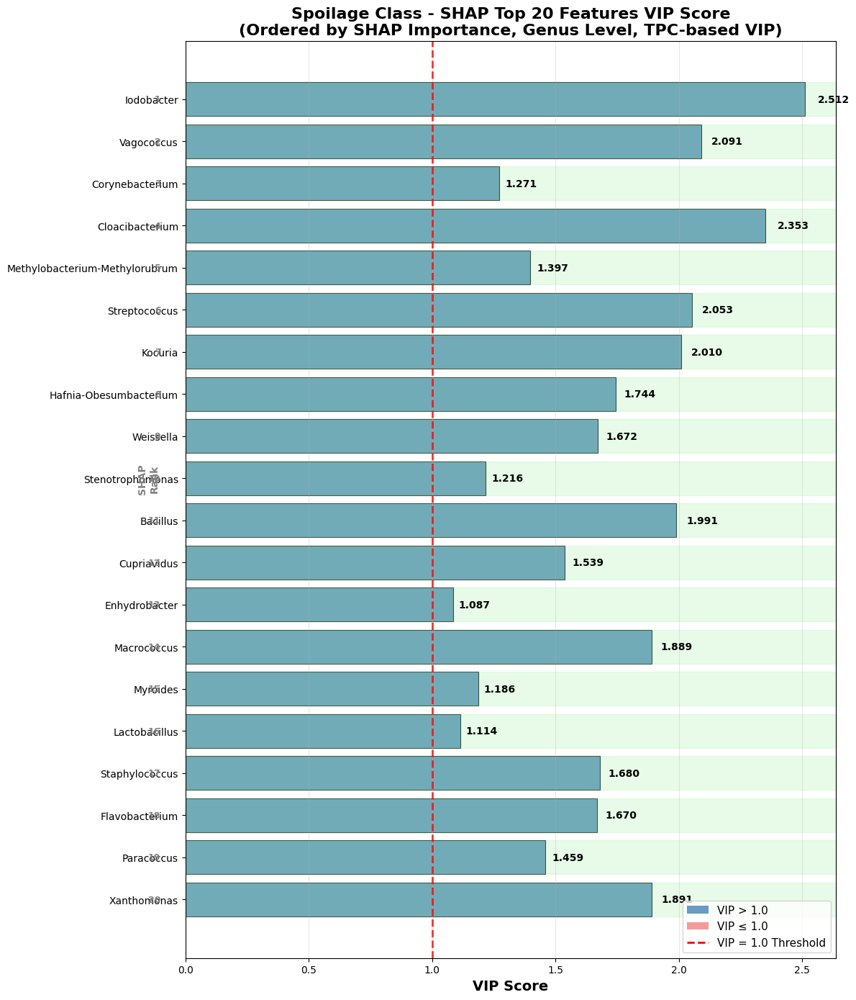


Spoilage Class 통계 (SHAP 중요도 순서):
  • 분석된 feature 수: 20
  • VIP > 1.0 feature 수: 20
  • 최고 VIP Score: 2.5125
  • 최저 VIP Score: 1.0871
  • 평균 VIP Score: 1.6912

Spoilage Class - SHAP 순서별 VIP Score (Top 20):
   1. Iodobacter                     | VIP: 2.5125 🟢
   2. Vagococcus                     | VIP: 2.0908 🟢
   3. Corynebacterium                | VIP: 1.2712 🟢
   4. Cloacibacterium                | VIP: 2.3526 🟢
   5. Methylobacterium-Methylorubrum | VIP: 1.3965 🟢
   6. Streptococcus                  | VIP: 2.0527 🟢
   7. Kocuria                        | VIP: 2.0101 🟢
   8. Hafnia-Obesumbacterium         | VIP: 1.7435 🟢
   9. Weissella                      | VIP: 1.6724 🟢
  10. Stenotrophomonas               | VIP: 1.2159 🟢
  11. Bacillus                       | VIP: 1.9908 🟢
  12. Cupriavidus                    | VIP: 1.5385 🟢
  13. Enhydrobacter                  | VIP: 1.0871 🟢
  14. Macrococcus                    | VIP: 1.8892 🟢
  15. Myroides                       | VIP: 1.1863 🟢

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 각 클래스별 상위 20개 feature들 (SHAP 결과에서 - 중요도 순서 유지)
class_0_top_features = ['g__Bacillus', 'g__Cupriavidus', 'g__Enhydrobacter', 'g__Vagococcus', 'g__Macrococcus', 'g__Iodobacter', 'g__Myroides', 'g__Lactobacillus', 'g__Stenotrophomonas', 'g__Staphylococcus', 'g__Kocuria', 'g__Weissella', 'g__Streptococcus', 'g__Corynebacterium', 'g__Flavobacterium', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Xanthomonas', 'g__Janthinobacterium', 'g__Cloacibacterium']

class_1_top_features = ['g__Kocuria', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Cupriavidus', 'g__Weissella', 'g__Bacillus', 'g__Flavobacterium', 'g__Paracoccus', 'g__Xanthomonas', 'g__Janthinobacterium', 'g__Iodobacter', 'g__Vagococcus', 'g__Corynebacterium', 'g__Cloacibacterium', 'g__Hafnia-Obesumbacterium', 'g__Stenotrophomonas', 'g__Macrococcus', 'g__Staphylococcus', 'g__Myroides', 'g__Lactobacillus']

class_2_top_features = ['g__Iodobacter', 'g__Vagococcus', 'g__Corynebacterium', 'g__Cloacibacterium', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Kocuria', 'g__Hafnia-Obesumbacterium', 'g__Weissella', 'g__Stenotrophomonas', 'g__Bacillus', 'g__Cupriavidus', 'g__Enhydrobacter', 'g__Macrococcus', 'g__Myroides', 'g__Lactobacillus', 'g__Staphylococcus', 'g__Flavobacterium', 'g__Paracoccus', 'g__Xanthomonas']

class_names = ['Fresh', 'Middle', 'Spoilage']
class_features = [class_0_top_features, class_1_top_features, class_2_top_features]

# Genus level VIP 결과 데이터
genus_vip_df = vip_over1_dict['Genus']

# 각 클래스별로 VIP Score 그래프 생성 (SHAP 순서 유지)
for class_idx, (class_name, features) in enumerate(zip(class_names, class_features)):
    print(f"\n=== {class_name} Class SHAP Top 20 Features의 VIP Score (SHAP 중요도 순서) ===")
    
    # 해당 클래스의 feature들에 대한 VIP score 추출 (SHAP 순서 유지)
    class_vip_mapping = []
    for rank, feature in enumerate(features, 1):  # SHAP 순서대로 rank 부여
        vip_row = genus_vip_df[genus_vip_df['Feature'] == feature]
        if not vip_row.empty:
            vip_score = vip_row['VIP_Score'].iloc[0]
            class_vip_mapping.append({
                'SHAP_Rank': rank,
                'Feature': feature,
                'Feature_Short': feature.replace('g__', ''),
                'VIP_Score': vip_score
            })
        else:
            print(f"⚠️ {feature}: VIP 데이터에서 찾을 수 없음")
    
    # DataFrame으로 변환 (SHAP 순서 유지 - 정렬하지 않음)
    class_vip_df = pd.DataFrame(class_vip_mapping)
    if class_vip_df.empty:
        print(f"{class_name}: VIP Score 데이터 없음")
        continue
    
    # VIP Score 그래프 생성 (SHAP 순서 유지) - 더 큰 그래프 크기
    plt.figure(figsize=(12, 14))  # 크기 증가
    colors = ['lightcoral' if score < 1.0 else 'steelblue' for score in class_vip_df['VIP_Score']]
    
    # Y축을 뒤집어서 SHAP 1위가 위에 오도록 설정
    y_positions = list(range(len(class_vip_df)))[::-1]  # 역순으로 배치
    bars = plt.barh(y_positions, class_vip_df['VIP_Score'], 
                    color=colors, alpha=0.8, edgecolor='black', linewidth=0.8)
    
    # VIP > 1.0 threshold 표시
    plt.axvline(x=1.0, color='red', linestyle='--', linewidth=2, alpha=0.8, label='VIP = 1.0 Threshold')
    
    # 값 표시
    for i, (bar, score, rank) in enumerate(zip(bars, class_vip_df['VIP_Score'], class_vip_df['SHAP_Rank'])):
        plt.text(score + score*0.02, bar.get_y() + bar.get_height()/2,
                 f'{score:.3f}', ha='left', va='center', fontsize=10, fontweight='bold')
        # SHAP 순위도 함께 표시
        plt.text(-0.1, bar.get_y() + bar.get_height()/2,
                 f'{rank}', ha='right', va='center', fontsize=9, fontweight='bold', color='gray')
    
    # VIP > 1.0인 feature들에 배경색 추가
    for i, score in enumerate(class_vip_df['VIP_Score']):
        if score > 1.0:
            y_pos = y_positions[i]
            plt.axhspan(y_pos-0.4, y_pos+0.4, alpha=0.2, color='lightgreen')
    
    # Y축 라벨 설정 (SHAP 순서대로) - 폰트 크기 조정
    plt.yticks(y_positions, class_vip_df['Feature_Short'], fontsize=10)
    plt.xlabel('VIP Score', fontsize=14, fontweight='bold')
    plt.title(f'{class_name} Class - SHAP Top 20 Features VIP Score\n(Ordered by SHAP Importance, Genus Level, TPC-based VIP)', 
              fontsize=16, fontweight='bold')
    
    # SHAP 순위 표시 추가
    plt.text(-0.15, len(class_vip_df)/2, 'SHAP\nRank', ha='center', va='center', 
             fontsize=10, fontweight='bold', color='gray', rotation=90)
    
    # 범례 추가
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='steelblue', alpha=0.8, label='VIP > 1.0'),
        plt.Rectangle((0, 0), 1, 1, facecolor='lightcoral', alpha=0.8, label='VIP ≤ 1.0'),
        plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
    ]
    plt.legend(handles=legend_elements, loc='lower right', fontsize=11)
    
    plt.grid(True, alpha=0.3, axis='x')
    plt.tight_layout()
    plt.show()
    
    # 통계 출력 (SHAP 순서대로)
    vip_over_1_count = sum(class_vip_df['VIP_Score'] > 1.0)
    print(f"\n{class_name} Class 통계 (SHAP 중요도 순서):")
    print(f"  • 분석된 feature 수: {len(class_vip_df)}")
    print(f"  • VIP > 1.0 feature 수: {vip_over_1_count}")
    print(f"  • 최고 VIP Score: {class_vip_df['VIP_Score'].max():.4f}")
    print(f"  • 최저 VIP Score: {class_vip_df['VIP_Score'].min():.4f}")
    print(f"  • 평균 VIP Score: {class_vip_df['VIP_Score'].mean():.4f}")
    
    # SHAP 순서별 feature와 VIP Score 출력
    print(f"\n{class_name} Class - SHAP 순서별 VIP Score (Top 20):")
    for _, row in class_vip_df.iterrows():
        vip_status = "🟢" if row['VIP_Score'] > 1.0 else "🔴"
        print(f"  {row['SHAP_Rank']:2d}. {row['Feature_Short']:<30} | VIP: {row['VIP_Score']:.4f} {vip_status}")

print("\n=== 전체 요약 ===")
print("각 클래스별로 SHAP에서 중요하게 나온 상위 20개 feature들의 VIP Score를 확인했습니다.")
print("그래프에서 위쪽이 SHAP 1위, 아래쪽이 SHAP 20위입니다.")
print("왼쪽 숫자는 SHAP 순위, VIP > 1.0인 feature들은 초록색 배경으로 강조되어 있습니다.")

## SHAP summary or mean bar plot 
- figure가 너무 많아지니 통합된 plot으로 수정

SHAP values shape: (54, 31, 3)
X_test_df shape: (54, 31)
vip_features 개수: 31
실제 사용된 feature 개수: 31
feature_names_short 개수: 31


<Figure size 1200x1000 with 0 Axes>

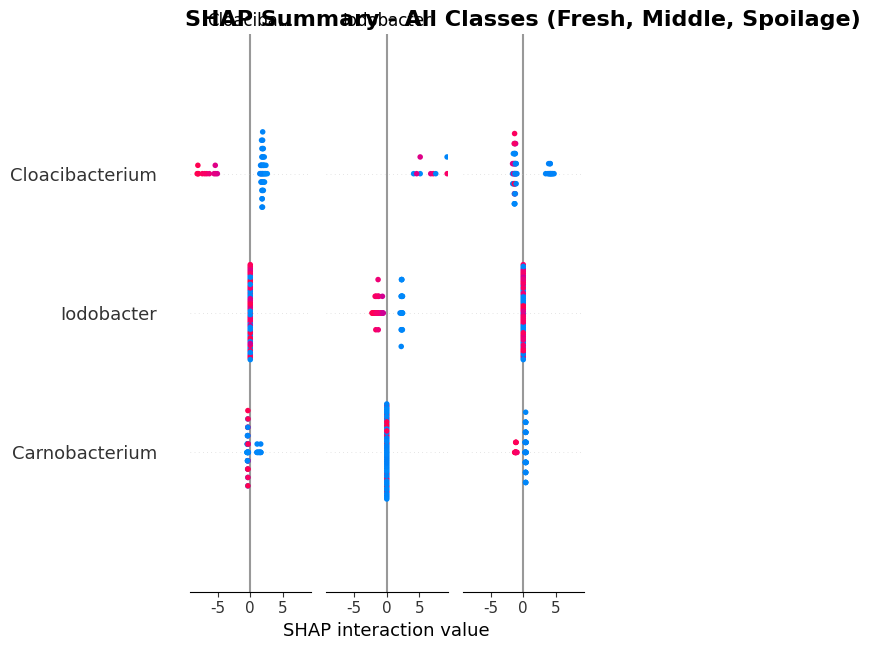

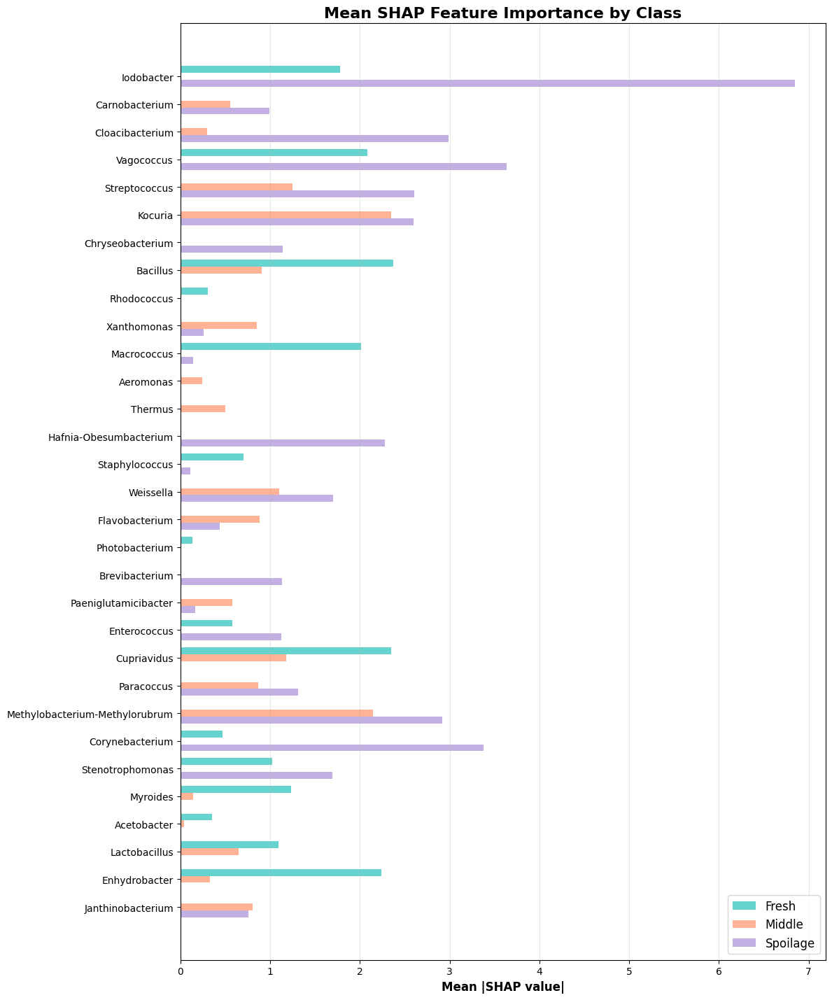

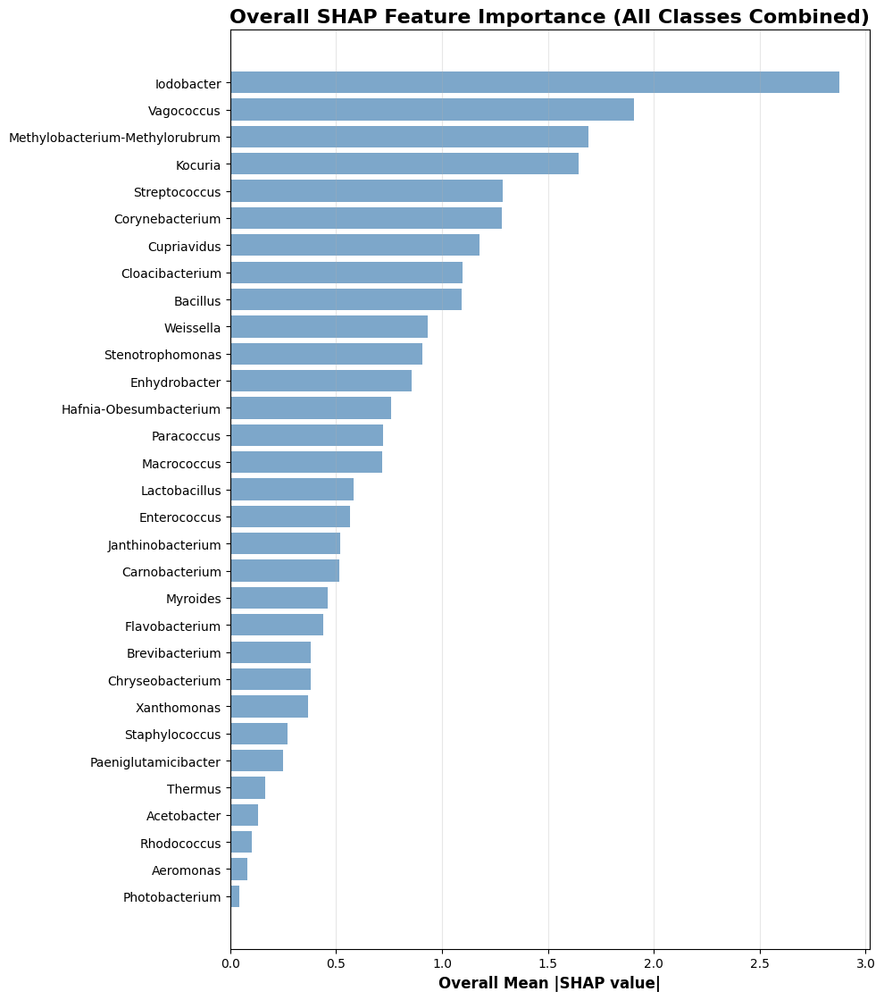

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shap

class_names = ['Fresh', 'Middle', 'Spoilage']

# SHAP 값과 feature 개수 확인
print(f"SHAP values shape: {shap_values.values.shape}")
print(f"X_test_df shape: {X_test_df.shape}")
print(f"vip_features 개수: {len(vip_features)}")

# feature_names_short를 실제 사용된 feature 개수에 맞춰 생성
actual_features = X_test_df.columns.tolist()
feature_names_short = [f.replace('g__', '') for f in actual_features]

print(f"실제 사용된 feature 개수: {len(actual_features)}")
print(f"feature_names_short 개수: {len(feature_names_short)}")

# 방법 1: 통합된 SHAP Summary Plot (모든 클래스를 한 번에)
plt.figure(figsize=(12, 10))
shap.summary_plot(
    shap_values.values,
    X_test_df,
    feature_names=feature_names_short,
    class_names=class_names,
    show=False
)
plt.title('SHAP Summary - All Classes (Fresh, Middle, Spoilage)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 방법 2: Mean SHAP Bar Plot (클래스별 평균 절대값)
mean_abs_shap = np.abs(shap_values.values).mean(axis=0)  # (feature 수, 클래스 수)

fig, ax = plt.subplots(figsize=(12, len(feature_names_short)*0.4 + 2))
y_pos = np.arange(len(feature_names_short))
bar_width = 0.25

colors = ['#40c9c3', '#ffa07a', '#b39ddb']  # Fresh, Middle, Spoilage

for class_idx, (class_name, color) in enumerate(zip(class_names, colors)):
    class_scores = mean_abs_shap[:, class_idx]
    bars = ax.barh(y_pos + bar_width*class_idx, class_scores, 
                   height=bar_width, color=color, alpha=0.8, label=class_name)

ax.set_yticks(y_pos + bar_width)
ax.set_yticklabels(feature_names_short, fontsize=10)
ax.invert_yaxis()
ax.set_xlabel('Mean |SHAP value|', fontsize=12, fontweight='bold')
ax.set_title('Mean SHAP Feature Importance by Class', fontsize=16, fontweight='bold')
ax.legend(fontsize=12, loc='lower right')
ax.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

# 방법 3: 전체 평균 SHAP 중요도 (클래스 통합)
overall_mean_shap = np.abs(shap_values.values).mean(axis=(0, 2))  # feature별 전체 평균
sorted_idx = np.argsort(overall_mean_shap)[::-1]

plt.figure(figsize=(10, len(feature_names_short)*0.3 + 2))
bars = plt.barh(range(len(feature_names_short)), 
                overall_mean_shap[sorted_idx], 
                color='steelblue', alpha=0.7)
plt.yticks(range(len(feature_names_short)), 
           [feature_names_short[i] for i in sorted_idx], fontsize=10)
plt.xlabel('Overall Mean |SHAP value|', fontsize=12, fontweight='bold')
plt.title('Overall SHAP Feature Importance (All Classes Combined)', fontsize=16, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(True, alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

### SHAP figure가 모양이 헝클어져 mean absolute SHAP value bar plot으로

SHAP values shape: (54, 31, 3)
X_test_df shape: (54, 31)


<Figure size 1200x1500 with 0 Axes>

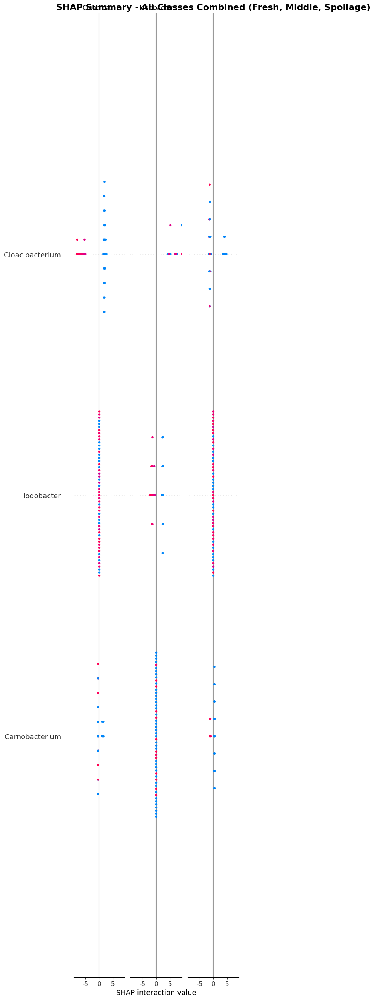

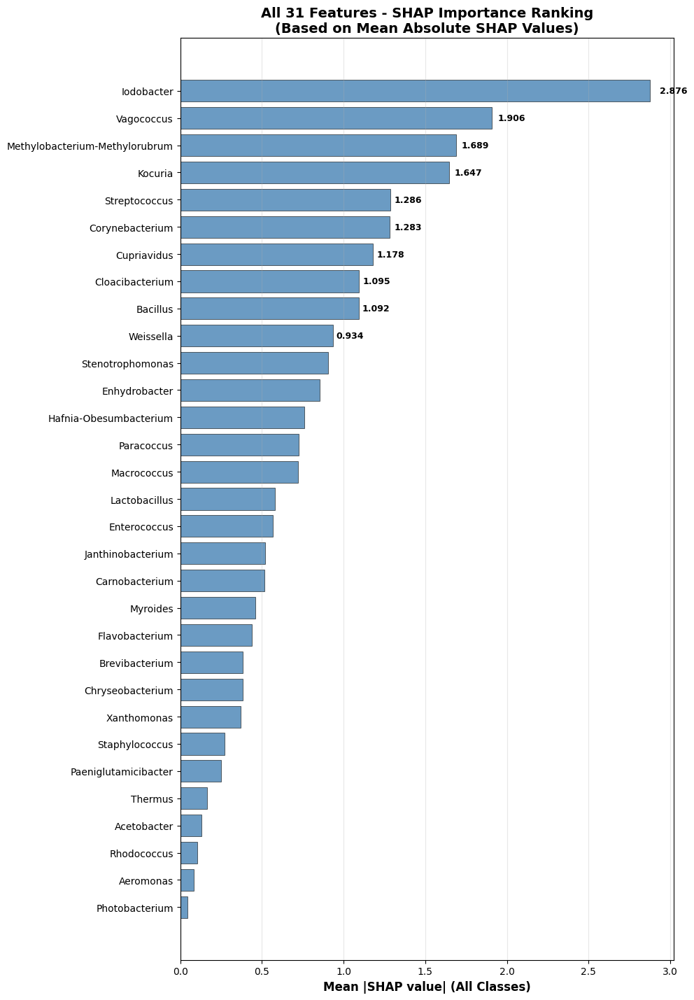

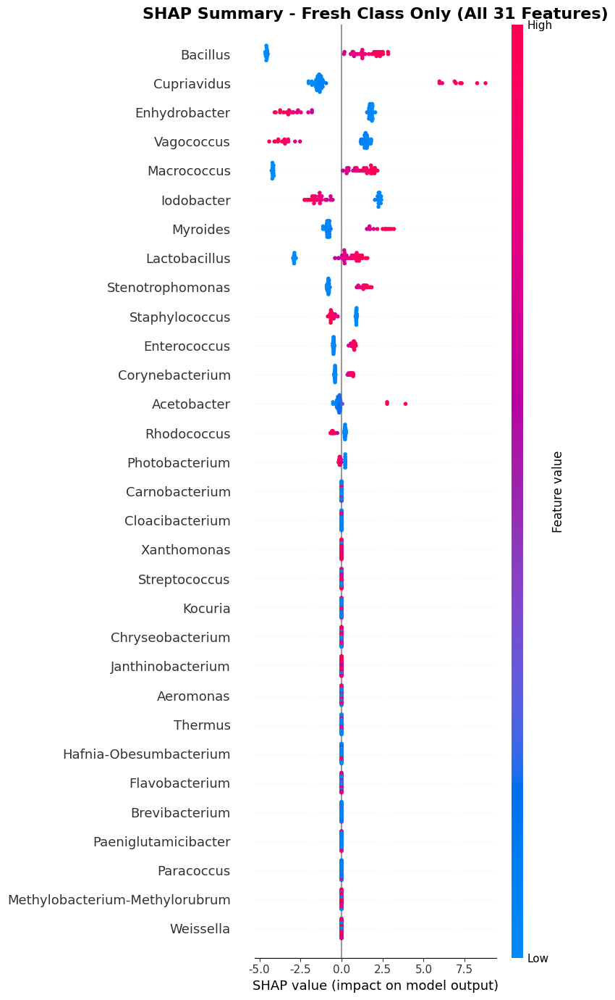

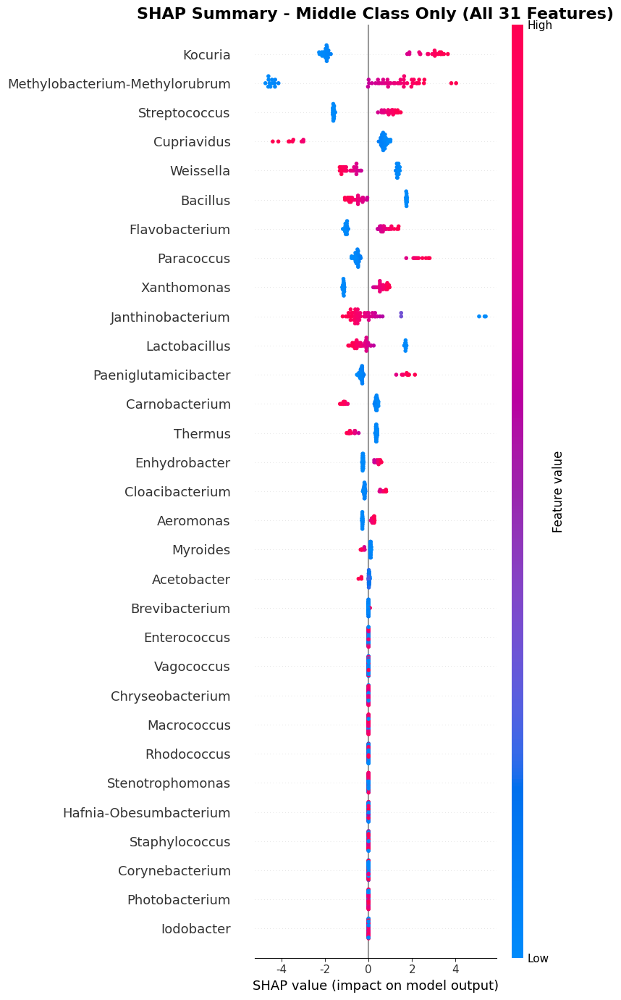

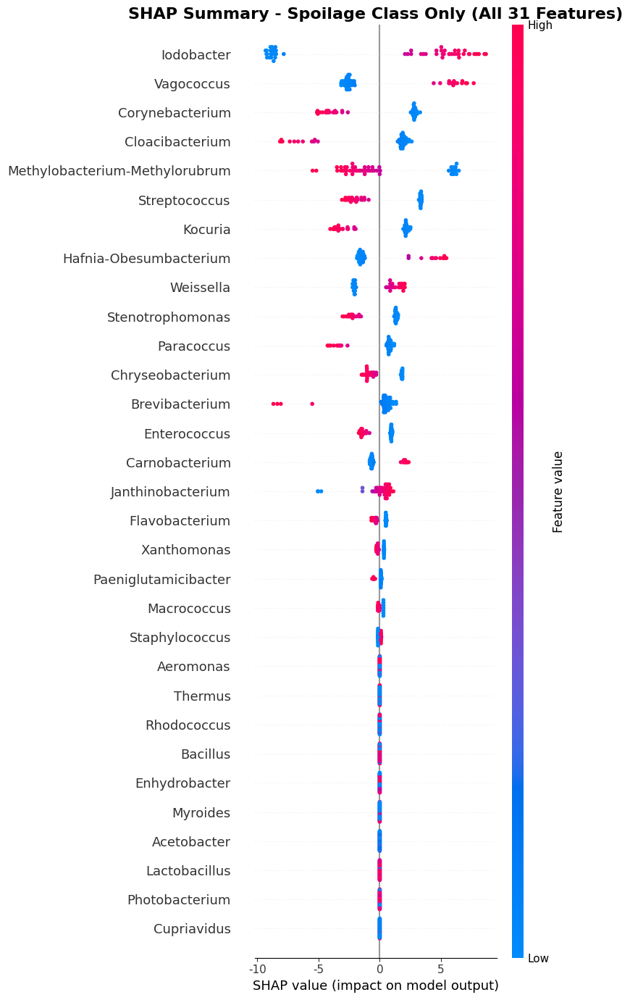


=== All 31 Features SHAP Importance Ranking ===
 1. Iodobacter                     | Mean |SHAP|: 2.8758
 2. Vagococcus                     | Mean |SHAP|: 1.9055
 3. Methylobacterium-Methylorubrum | Mean |SHAP|: 1.6894
 4. Kocuria                        | Mean |SHAP|: 1.6470
 5. Streptococcus                  | Mean |SHAP|: 1.2856
 6. Corynebacterium                | Mean |SHAP|: 1.2829
 7. Cupriavidus                    | Mean |SHAP|: 1.1780
 8. Cloacibacterium                | Mean |SHAP|: 1.0955
 9. Bacillus                       | Mean |SHAP|: 1.0915
10. Weissella                      | Mean |SHAP|: 0.9340
11. Stenotrophomonas               | Mean |SHAP|: 0.9066
12. Enhydrobacter                  | Mean |SHAP|: 0.8549
13. Hafnia-Obesumbacterium         | Mean |SHAP|: 0.7583
14. Paracoccus                     | Mean |SHAP|: 0.7240
15. Macrococcus                    | Mean |SHAP|: 0.7189
16. Lactobacillus                  | Mean |SHAP|: 0.5809
17. Enterococcus                   | Me

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shap

class_names = ['Fresh', 'Middle', 'Spoilage']

# SHAP 값 확인 및 데이터 준비
print(f"SHAP values shape: {shap_values.values.shape}")
print(f"X_test_df shape: {X_test_df.shape}")

# feature 이름 정리
feature_names_short = [f.replace('g__', '') for f in X_test_df.columns]

# 1. 전체 클래스 통합 SHAP Summary Plot (모든 feature 표시)
plt.figure(figsize=(12, 15))  # 세로 크기 증가
shap.summary_plot(
    shap_values.values,
    X_test_df,
    feature_names=feature_names_short,
    class_names=class_names,
    max_display=len(feature_names_short),  # 🔥 이 부분이 핵심!
    show=False
)
plt.title('SHAP Summary - All Classes Combined (Fresh, Middle, Spoilage)', 
          fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 2. Mean Absolute SHAP Value Bar Plot (전체 Features)
overall_mean_shap = np.abs(shap_values.values).mean(axis=(0, 2))
sorted_idx = np.argsort(overall_mean_shap)[::-1]
sorted_features = [feature_names_short[i] for i in sorted_idx]
sorted_scores = overall_mean_shap[sorted_idx]

plt.figure(figsize=(10, len(sorted_features)*0.4 + 2))
bars = plt.barh(range(len(sorted_features)), sorted_scores, 
                color='steelblue', alpha=0.8, edgecolor='black', linewidth=0.5)

# 값 표시 (상위 10개만)
for i, (bar, score) in enumerate(zip(bars[:10], sorted_scores[:10])):
    plt.text(score + score*0.02, bar.get_y() + bar.get_height()/2,
             f'{score:.3f}', ha='left', va='center', fontsize=9, fontweight='bold')

plt.yticks(range(len(sorted_features)), sorted_features, fontsize=10)
plt.xlabel('Mean |SHAP value| (All Classes)', fontsize=12, fontweight='bold')
plt.title('All 31 Features - SHAP Importance Ranking\n(Based on Mean Absolute SHAP Values)', 
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# 3. 클래스별 개별 SHAP Summary Plot (모든 feature 표시)
for class_idx, class_name in enumerate(class_names):
    plt.figure(figsize=(12, 15))
    shap.summary_plot(
        shap_values.values[..., class_idx],
        X_test_df,
        feature_names=feature_names_short,
        max_display=len(feature_names_short),  # 🔥 여기도 추가!
        show=False
    )
    plt.title(f'SHAP Summary - {class_name} Class Only (All 31 Features)', 
              fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# 4. 결과 요약 출력
print("\n=== All 31 Features SHAP Importance Ranking ===")
for i, (feature, score) in enumerate(zip(sorted_features, sorted_scores), 1):
    print(f"{i:2d}. {feature:<30} | Mean |SHAP|: {score:.4f}")

print(f"\n=== SHAP Analysis Summary ===")
print(f"Total features analyzed: {len(feature_names_short)}")
print(f"Classes: {', '.join(class_names)}")
print(f"Test samples: {shap_values.values.shape[0]}")
print(f"Most important feature: {sorted_features[0]} ({sorted_scores[0]:.4f})")
print(f"Least important feature: {sorted_features[-1]} ({sorted_scores[-1]:.4f})")
print(f"Feature importance range: {sorted_scores[-1]:.4f} - {sorted_scores[0]:.4f}")

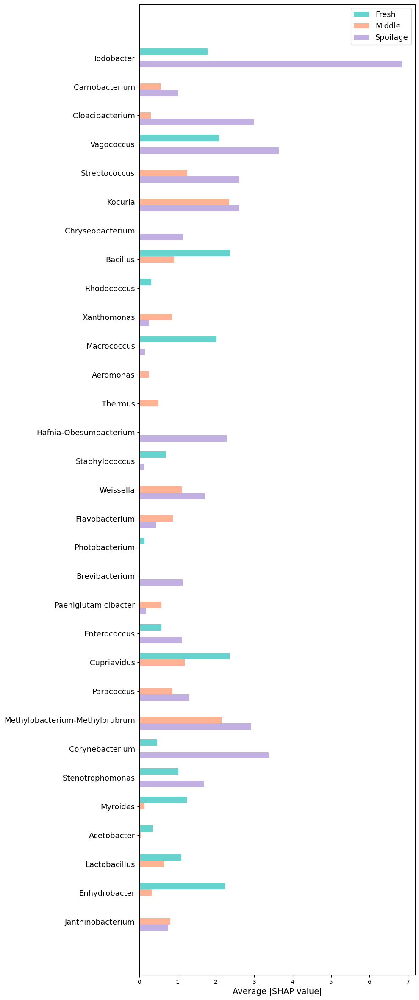

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class_names = ['Fresh', 'Middle', 'Spoilage']
class_colors = ['#40c9c3', '#ffa07a', '#b39ddb']

# 31개 feature 이름 직접 지정
feature_names_short = [
    'Iodobacter', 'Carnobacterium', 'Cloacibacterium', 'Vagococcus', 'Streptococcus',
    'Kocuria', 'Chryseobacterium', 'Bacillus', 'Rhodococcus', 'Xanthomonas',
    'Macrococcus', 'Aeromonas', 'Thermus', 'Hafnia-Obesumbacterium', 'Staphylococcus',
    'Weissella', 'Flavobacterium', 'Photobacterium', 'Brevibacterium', 'Paeniglutamicibacter',
    'Enterococcus', 'Cupriavidus', 'Paracoccus', 'Methylobacterium-Methylorubrum', 'Corynebacterium',
    'Stenotrophomonas', 'Myroides', 'Acetobacter', 'Lactobacillus', 'Enhydrobacter', 'Janthinobacterium'
]

# feature 순서에 맞게 mean_abs_shap 인덱스가 맞는지 확인 필요
assert len(feature_names_short) == mean_abs_shap.shape[0], "feature 수 mismatch!"

fig, ax = plt.subplots(figsize=(10, len(feature_names_short)*0.7 + 2))
y_pos = np.arange(len(feature_names_short))
bar_width = 0.22

for class_idx, color in enumerate(class_colors):
    class_scores = mean_abs_shap[:, class_idx]
    ax.barh(y_pos + bar_width*class_idx, class_scores, height=bar_width, color=color, alpha=0.8, label=class_names[class_idx])

ax.set_yticks(y_pos + bar_width)
ax.set_yticklabels(feature_names_short, fontsize=13)
ax.invert_yaxis()
ax.set_xlabel('Average |SHAP value|', fontsize=14)
ax.legend(fontsize=13)
plt.tight_layout()
plt.show()

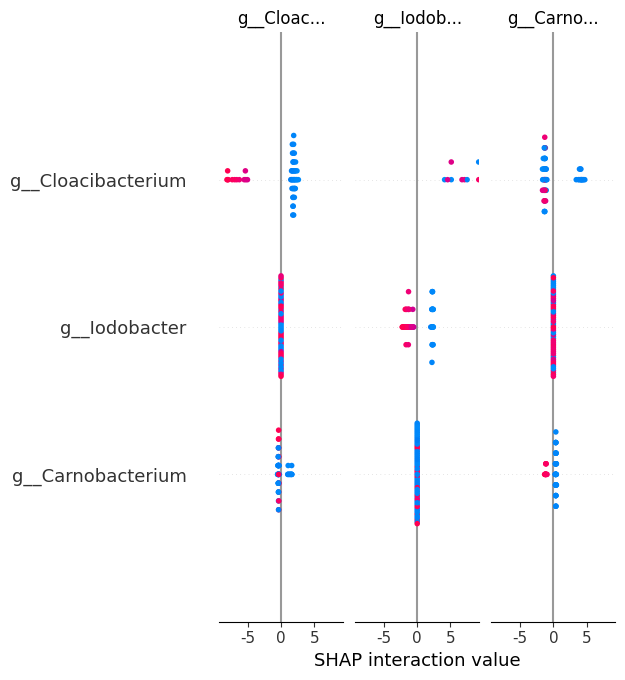

<Figure size 1000x700 with 0 Axes>

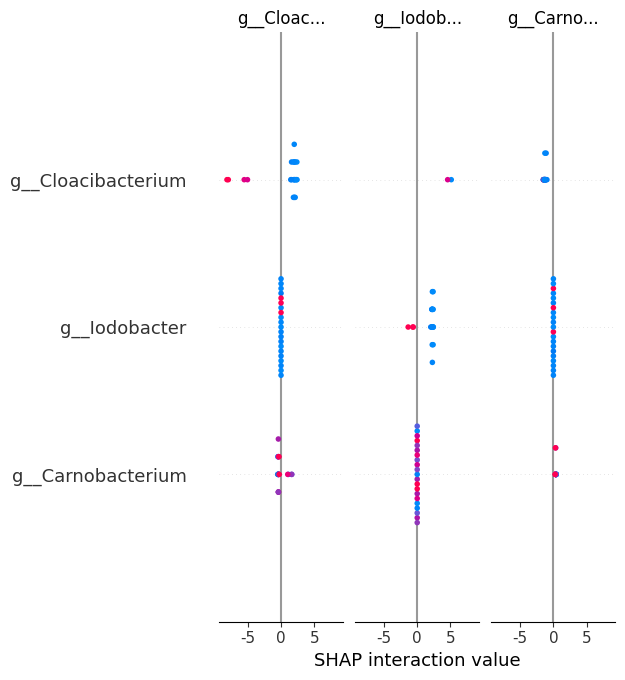

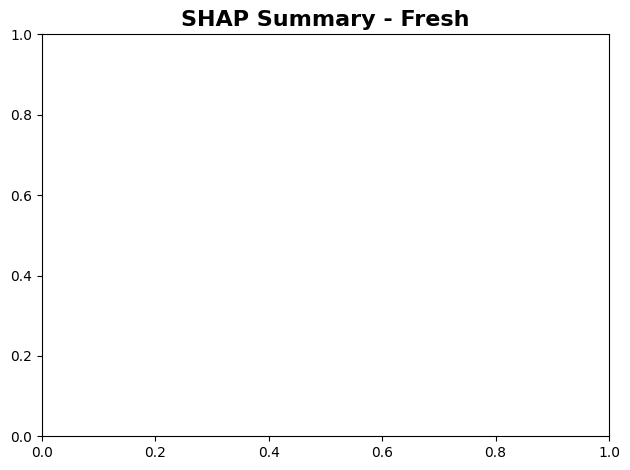

<Figure size 1000x700 with 0 Axes>

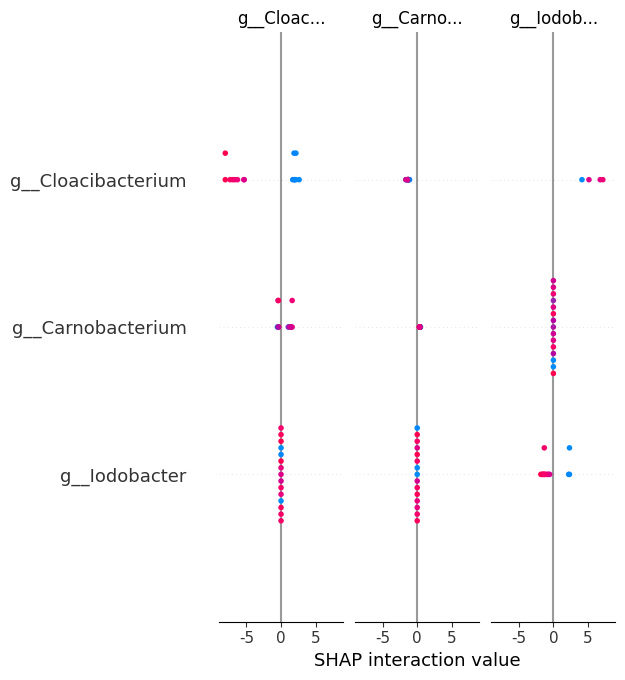

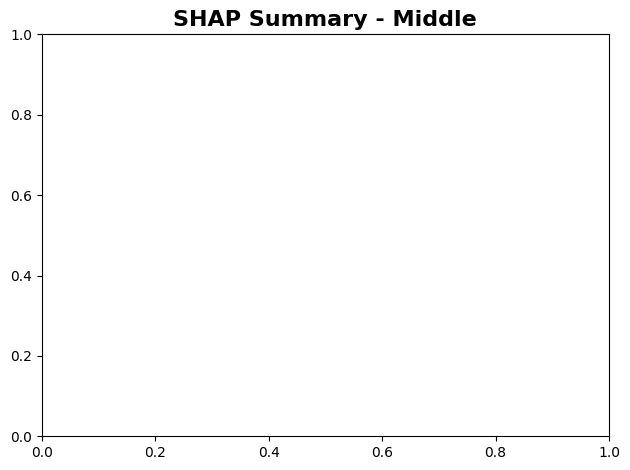

<Figure size 1000x700 with 0 Axes>

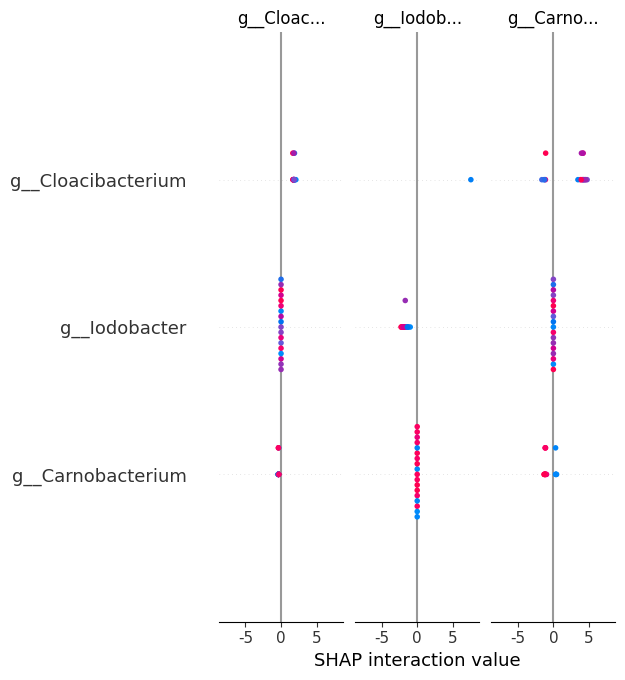

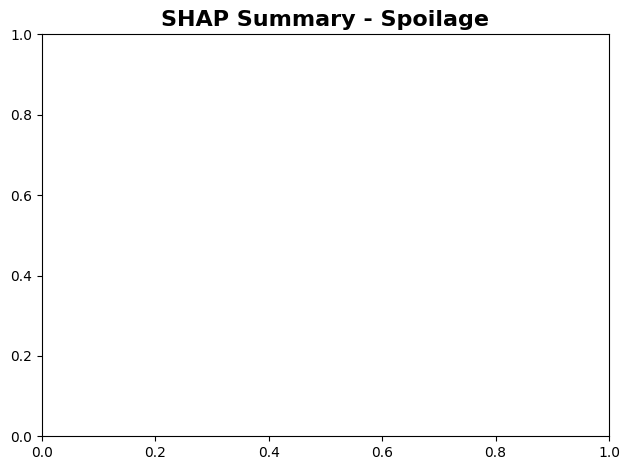

In [ ]:
import shap
import matplotlib.pyplot as plt

# X_test_df: 테스트 데이터 (컬럼명 = vip_features)
# best_model: 학습된 모델 (LogisticRegression 등)
# y_test: 테스트 라벨

explainer = shap.Explainer(best_model.named_steps['lr'], X_test_df)
shap_values = explainer(X_test_df)

# 전체 summary plot (기본)
shap.summary_plot(shap_values.values, X_test_df, feature_names=vip_features, show=True)

# 클래스별로 따로 (예: Fresh vs Middle, Middle vs Spoilage)
for class_idx, class_name in enumerate(['Fresh', 'Middle', 'Spoilage']):
    plt.figure(figsize=(10, 7))
    shap.summary_plot(
        shap_values.values[y_test == class_idx], 
        X_test_df.iloc[y_test == class_idx], 
        feature_names=vip_features, 
        show=True
    )
    plt.title(f'SHAP Summary - {class_name}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
# X_test_df 컬럼 리스트
x_test_columns = ['g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus', 'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas', 'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus', 'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter', 'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium', 'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium']

# SHAP 분석 결과 상위 10개 feature
class_0_top10 = ['g__Bacillus', 'g__Cupriavidus', 'g__Enhydrobacter', 'g__Vagococcus', 'g__Macrococcus', 'g__Iodobacter', 'g__Myroides', 'g__Lactobacillus', 'g__Stenotrophomonas', 'g__Staphylococcus']

class_1_top10 = ['g__Kocuria', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Cupriavidus', 'g__Weissella', 'g__Bacillus', 'g__Flavobacterium', 'g__Paracoccus', 'g__Xanthomonas', 'g__Janthinobacterium']

class_2_top10 = ['g__Iodobacter', 'g__Vagococcus', 'g__Corynebacterium', 'g__Cloacibacterium', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Kocuria', 'g__Hafnia-Obesumbacterium', 'g__Weissella', 'g__Stenotrophomonas']

# 포함 여부 확인
print("=== Class 0 (Fresh) 상위 10개 feature 포함 여부 ===")
for feature in class_0_top10:
    is_included = feature in x_test_columns
    print(f"{feature}: {'✅ 포함' if is_included else '❌ 미포함'}")

print("\n=== Class 1 (Middle) 상위 10개 feature 포함 여부 ===")
for feature in class_1_top10:
    is_included = feature in x_test_columns
    print(f"{feature}: {'✅ 포함' if is_included else '❌ 미포함'}")

print("\n=== Class 2 (Spoilage) 상위 10개 feature 포함 여부 ===")
for feature in class_2_top10:
    is_included = feature in x_test_columns
    print(f"{feature}: {'✅ 포함' if is_included else '❌ 미포함'}")

# 전체 요약
all_shap_features = set(class_0_top10 + class_1_top10 + class_2_top10)
missing_features = [f for f in all_shap_features if f not in x_test_columns]
included_features = [f for f in all_shap_features if f in x_test_columns]

print(f"\n=== 전체 요약 ===")
print(f"SHAP 분석에서 나온 총 unique feature 수: {len(all_shap_features)}")
print(f"X_test_df에 포함된 feature 수: {len(included_features)}")
print(f"X_test_df에 누락된 feature 수: {len(missing_features)}")

if missing_features:
    print(f"\n❌ 누락된 feature:")
    for feature in missing_features:
        print(f"  - {feature}")
else:
    print(f"\n✅ 모든 SHAP feature가 X_test_df에 포함되어 있습니다!")

=== Class 0 (Fresh) 상위 10개 feature 포함 여부 ===
g__Bacillus: ✅ 포함
g__Cupriavidus: ✅ 포함
g__Enhydrobacter: ✅ 포함
g__Vagococcus: ✅ 포함
g__Macrococcus: ✅ 포함
g__Iodobacter: ✅ 포함
g__Myroides: ✅ 포함
g__Lactobacillus: ✅ 포함
g__Stenotrophomonas: ✅ 포함
g__Staphylococcus: ✅ 포함

=== Class 1 (Middle) 상위 10개 feature 포함 여부 ===
g__Kocuria: ✅ 포함
g__Methylobacterium-Methylorubrum: ✅ 포함
g__Streptococcus: ✅ 포함
g__Cupriavidus: ✅ 포함
g__Weissella: ✅ 포함
g__Bacillus: ✅ 포함
g__Flavobacterium: ✅ 포함
g__Paracoccus: ✅ 포함
g__Xanthomonas: ✅ 포함
g__Janthinobacterium: ✅ 포함

=== Class 2 (Spoilage) 상위 10개 feature 포함 여부 ===
g__Iodobacter: ✅ 포함
g__Vagococcus: ✅ 포함
g__Corynebacterium: ✅ 포함
g__Cloacibacterium: ✅ 포함
g__Methylobacterium-Methylorubrum: ✅ 포함
g__Streptococcus: ✅ 포함
g__Kocuria: ✅ 포함
g__Hafnia-Obesumbacterium: ✅ 포함
g__Weissella: ✅ 포함
g__Stenotrophomonas: ✅ 포함

=== 전체 요약 ===
SHAP 분석에서 나온 총 unique feature 수: 21
X_test_df에 포함된 feature 수: 21
X_test_df에 누락된 feature 수: 0

✅ 모든 SHAP feature가 X_test_df에 포함되어 있습니다!


In [ ]:
# 31개 중요 feature 리스트 (g__ 접두사 추가)
important_31_features = [
    'g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus',
    'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas',
    'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus',
    'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter',
    'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium',
    'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium'
]

# X_test_df 컬럼 리스트 (현재 사용된 feature)
x_test_columns = ['g__Iodobacter', 'g__Carnobacterium', 'g__Cloacibacterium', 'g__Vagococcus', 'g__Streptococcus', 'g__Kocuria', 'g__Chryseobacterium', 'g__Bacillus', 'g__Rhodococcus', 'g__Xanthomonas', 'g__Macrococcus', 'g__Aeromonas', 'g__Thermus', 'g__Hafnia-Obesumbacterium', 'g__Staphylococcus', 'g__Weissella', 'g__Flavobacterium', 'g__Photobacterium', 'g__Brevibacterium', 'g__Paeniglutamicibacter', 'g__Enterococcus', 'g__Cupriavidus', 'g__Paracoccus', 'g__Methylobacterium-Methylorubrum', 'g__Corynebacterium', 'g__Stenotrophomonas', 'g__Myroides', 'g__Acetobacter', 'g__Lactobacillus', 'g__Enhydrobacter', 'g__Janthinobacterium']

# SHAP 분석 결과 상위 10개 feature (각 클래스별)
class_0_top10 = ['g__Bacillus', 'g__Cupriavidus', 'g__Enhydrobacter', 'g__Vagococcus', 'g__Macrococcus', 'g__Iodobacter', 'g__Myroides', 'g__Lactobacillus', 'g__Stenotrophomonas', 'g__Staphylococcus']

class_1_top10 = ['g__Kocuria', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Cupriavidus', 'g__Weissella', 'g__Bacillus', 'g__Flavobacterium', 'g__Paracoccus', 'g__Xanthomonas', 'g__Janthinobacterium']

class_2_top10 = ['g__Iodobacter', 'g__Vagococcus', 'g__Corynebacterium', 'g__Cloacibacterium', 'g__Methylobacterium-Methylorubrum', 'g__Streptococcus', 'g__Kocuria', 'g__Hafnia-Obesumbacterium', 'g__Weissella', 'g__Stenotrophomonas']

print("=== 31개 중요 feature vs X_test_df 비교 ===")
print(f"31개 중요 feature 수: {len(important_31_features)}")
print(f"X_test_df feature 수: {len(x_test_columns)}")

# 31개 중요 feature가 X_test_df에 모두 포함되는지 확인
missing_in_xtest = [f for f in important_31_features if f not in x_test_columns]
extra_in_xtest = [f for f in x_test_columns if f not in important_31_features]

print(f"\n=== 31개 중요 feature 중 X_test_df에 누락된 것 ===")
if missing_in_xtest:
    print(f"누락된 feature ({len(missing_in_xtest)}개):")
    for i, feature in enumerate(missing_in_xtest, 1):
        print(f"  {i}. {feature}")
else:
    print("✅ 31개 중요 feature가 모두 X_test_df에 포함되어 있습니다!")

print(f"\n=== X_test_df에 있지만 31개 중요 feature에 없는 것 ===")
if extra_in_xtest:
    print(f"추가 feature ({len(extra_in_xtest)}개):")
    for i, feature in enumerate(extra_in_xtest, 1):
        print(f"  {i}. {feature}")
else:
    print("X_test_df와 31개 중요 feature가 정확히 일치합니다!")

# SHAP 결과와 31개 중요 feature 비교
all_shap_features = set(class_0_top10 + class_1_top10 + class_2_top10)
missing_in_shap = [f for f in important_31_features if f not in all_shap_features]

print(f"\n=== SHAP 상위 결과에 포함되지 않은 31개 중요 feature ===")
if missing_in_shap:
    print(f"SHAP Top 10에 포함되지 않은 feature ({len(missing_in_shap)}개):")
    for i, feature in enumerate(missing_in_shap, 1):
        print(f"  {i}. {feature}")
else:
    print("✅ 31개 중요 feature가 모두 SHAP Top 10에 포함되어 있습니다!")

print(f"\n=== 요약 ===")
print(f"• 31개 중요 feature: {len(important_31_features)}개")
print(f"• X_test_df feature: {len(x_test_columns)}개")
print(f"• SHAP 전체 unique feature: {len(all_shap_features)}개")
print(f"• 완전 일치 여부: {len(important_31_features) == len(x_test_columns) == len(set(important_31_features) & set(x_test_columns))}")

=== 31개 중요 feature vs X_test_df 비교 ===
31개 중요 feature 수: 31
X_test_df feature 수: 31

=== 31개 중요 feature 중 X_test_df에 누락된 것 ===
✅ 31개 중요 feature가 모두 X_test_df에 포함되어 있습니다!

=== X_test_df에 있지만 31개 중요 feature에 없는 것 ===
X_test_df와 31개 중요 feature가 정확히 일치합니다!

=== SHAP 상위 결과에 포함되지 않은 31개 중요 feature ===
SHAP Top 10에 포함되지 않은 feature (10개):
  1. g__Carnobacterium
  2. g__Chryseobacterium
  3. g__Rhodococcus
  4. g__Aeromonas
  5. g__Thermus
  6. g__Photobacterium
  7. g__Brevibacterium
  8. g__Paeniglutamicibacter
  9. g__Enterococcus
  10. g__Acetobacter

=== 요약 ===
• 31개 중요 feature: 31개
• X_test_df feature: 31개
• SHAP 전체 unique feature: 21개
• 완전 일치 여부: True


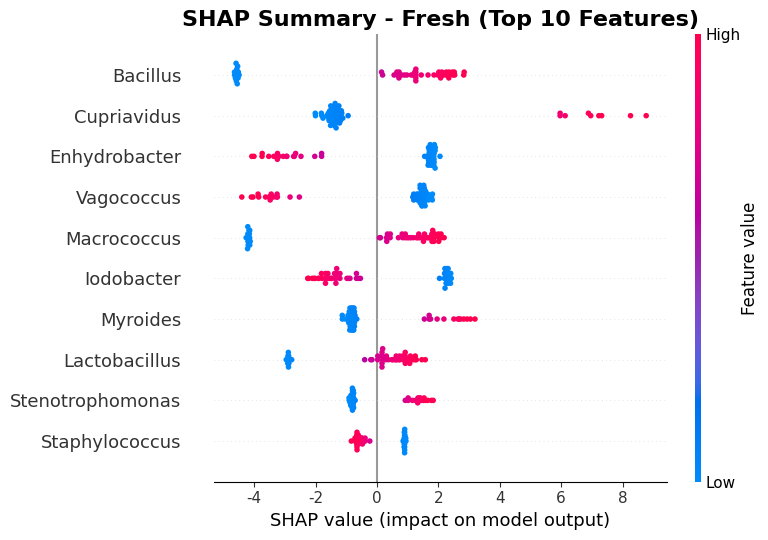

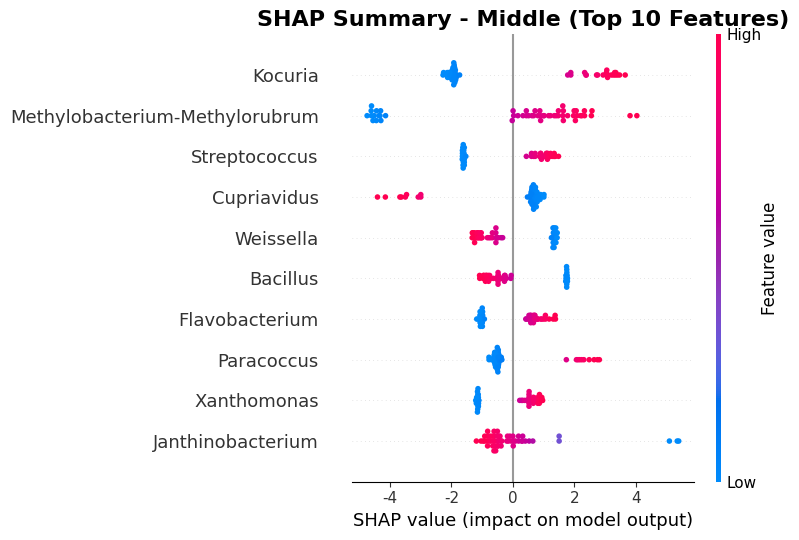

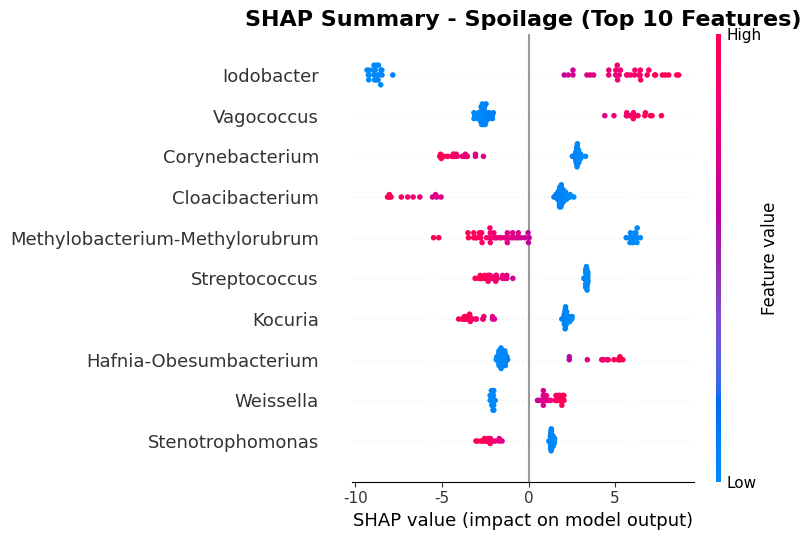

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class_names = ['Fresh', 'Middle', 'Spoilage']

# 각 클래스별로 상위 10개 feature만 추출하여 plot
for class_idx in range(shap_values.values.shape[-1]):
    # 해당 클래스의 SHAP 값들의 절대값 평균을 구해 상위 10개 선택
    class_shap_values = shap_values.values[..., class_idx]
    mean_abs_shap = np.abs(class_shap_values).mean(axis=0)
    top_10_idx = np.argsort(mean_abs_shap)[-10:][::-1]  # 상위 10개 인덱스
    
    # 상위 10개 feature만 추출
    top_10_shap_values = class_shap_values[:, top_10_idx]
    top_10_features = X_test_df.iloc[:, top_10_idx]
    top_10_feature_names = [vip_features[i].replace('g__', '') for i in top_10_idx]
    
    plt.figure(figsize=(10, 7))
    shap.summary_plot(
        top_10_shap_values,
        top_10_features,
        feature_names=top_10_feature_names,
        show=False
    )
    plt.title(f'SHAP Summary - {class_names[class_idx]} (Top 10 Features)', 
              fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

SHAP values shape: (54, 31, 3)
X_test_df shape: (54, 31)

🔥 예측 클래스 기반 SHAP 분석 (권장 방법)
예측 클래스 분포: [21 14 19]
Fresh: 21, Middle: 14, Spoilage: 19
예측 클래스 기반 SHAP shape: (54, 31)


/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2742: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


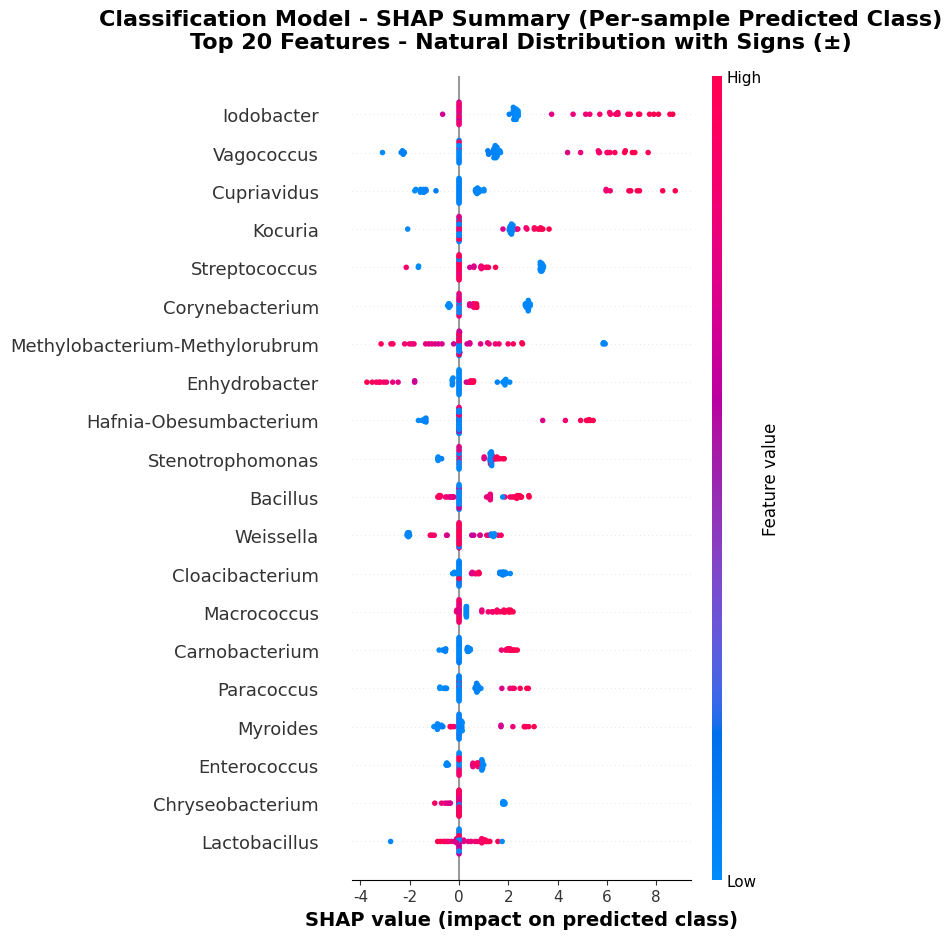

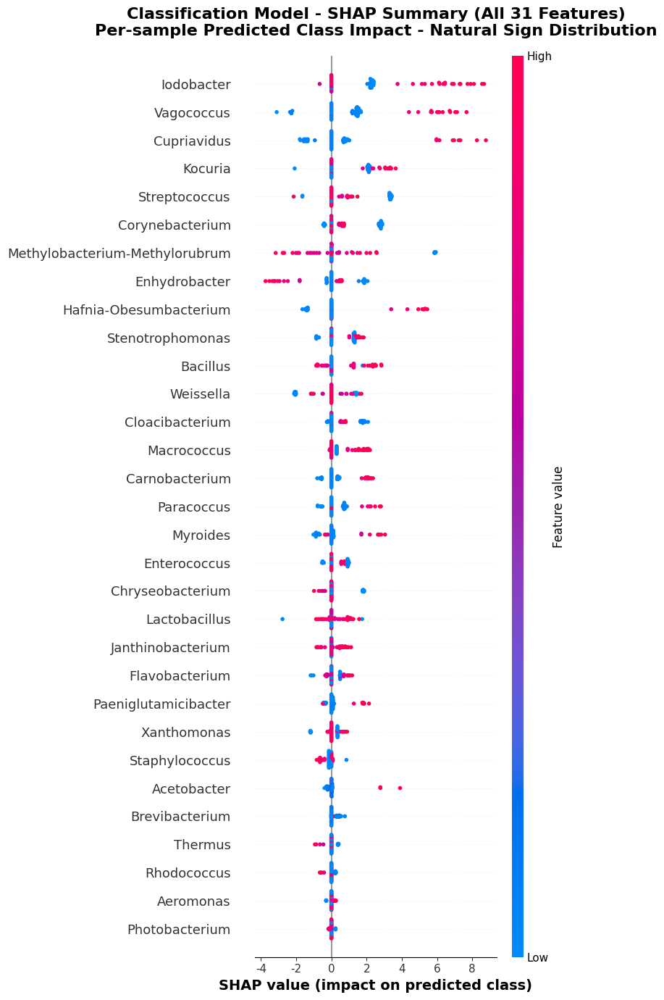

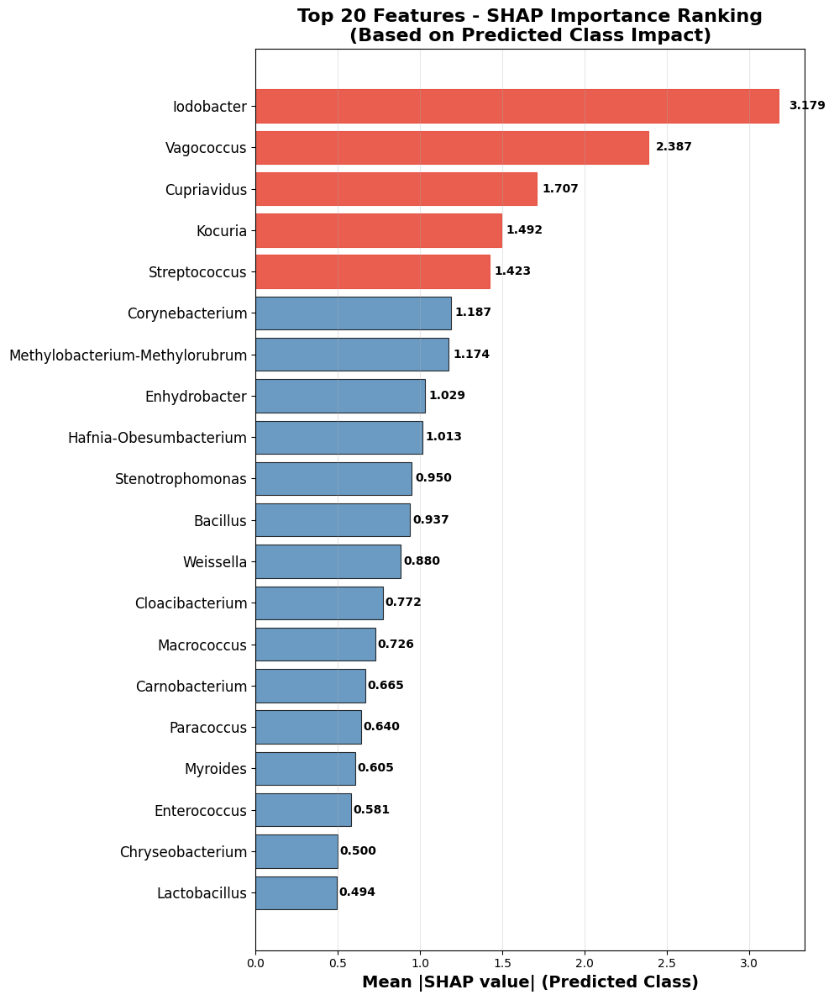

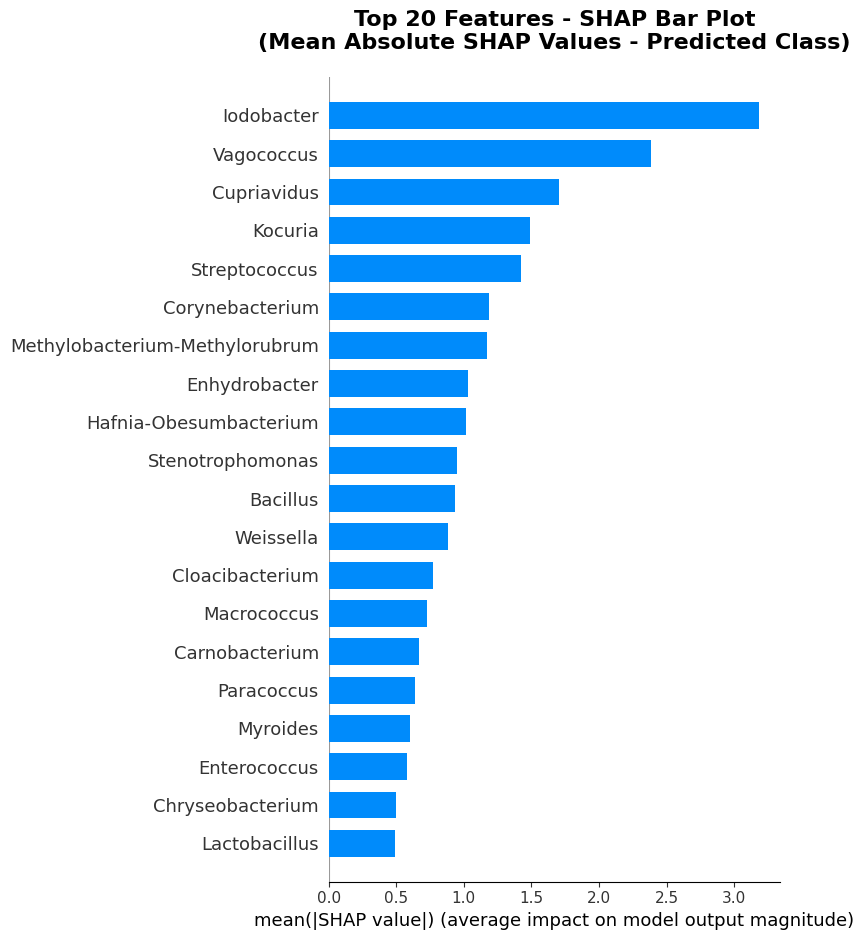


=== Top 20 Features SHAP Importance Ranking (Predicted Class Based) ===
 1. ⭐ Iodobacter                     | Mean |SHAP|: 3.1794
 2. ⭐ Vagococcus                     | Mean |SHAP|: 2.3868
 3. ⭐ Cupriavidus                    | Mean |SHAP|: 1.7067
 4. ⭐ Kocuria                        | Mean |SHAP|: 1.4922
 5. ⭐ Streptococcus                  | Mean |SHAP|: 1.4231
 6.    Corynebacterium                | Mean |SHAP|: 1.1873
 7.    Methylobacterium-Methylorubrum | Mean |SHAP|: 1.1743
 8.    Enhydrobacter                  | Mean |SHAP|: 1.0292
 9.    Hafnia-Obesumbacterium         | Mean |SHAP|: 1.0127
10.    Stenotrophomonas               | Mean |SHAP|: 0.9496
11.    Bacillus                       | Mean |SHAP|: 0.9366
12.    Weissella                      | Mean |SHAP|: 0.8800
13.    Cloacibacterium                | Mean |SHAP|: 0.7723
14.    Macrococcus                    | Mean |SHAP|: 0.7261
15.    Carnobacterium                 | Mean |SHAP|: 0.6652
16.    Paracoccus               

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shap

class_names = ['Fresh', 'Middle', 'Spoilage']

# SHAP 값과 데이터 확인
print(f"SHAP values shape: {shap_values.values.shape}")
print(f"X_test_df shape: {X_test_df.shape}")

# feature 이름 정리 (g__ 접두사 제거)
feature_names_short = [f.replace('g__', '') for f in X_test_df.columns]

print("\n" + "="*80)
print("🔥 예측 클래스 기반 SHAP 분석 (권장 방법)")
print("="*80)

# 🔥 핵심: 예측 클래스 기반 단일 SHAP 요약
# 1) 예측 클래스 인덱스 계산
pred = best_model.predict(X_test_df)  # (n_samples,)
print(f"예측 클래스 분포: {np.bincount(pred)}")
print(f"Fresh: {np.sum(pred==0)}, Middle: {np.sum(pred==1)}, Spoilage: {np.sum(pred==2)}")

# 2) 각 샘플에 대해 예측된 클래스의 SHAP 값만 선택
sv = shap_values.values  # (n_samples, n_features, n_classes)
overall_signed = np.take_along_axis(sv, pred[:, None, None], axis=2).squeeze(2)
# shape -> (n_samples, n_features)

print(f"예측 클래스 기반 SHAP shape: {overall_signed.shape}")

# 3) 필요 시 상위 20개 feature 선택 (평균 |SHAP|으로 랭킹)
mean_abs = np.abs(overall_signed).mean(axis=0)
top_20_idx = np.argsort(mean_abs)[-20:][::-1]
sorted_features = [feature_names_short[i] for i in top_20_idx]
sorted_scores = mean_abs[top_20_idx]

# 4) 자연스러운 점 요약 플롯 (상위 20개)
plt.figure(figsize=(12, 15))

X_subset = X_test_df.iloc[:, top_20_idx]
feature_subset = [feature_names_short[i] for i in top_20_idx]

shap.summary_plot(
    overall_signed[:, top_20_idx],
    X_subset,
    feature_names=feature_subset,
    max_display=20,
    show=False
)

plt.title('Classification Model - SHAP Summary (Per-sample Predicted Class)\n' +
          'Top 20 Features - Natural Distribution with Signs (±)', 
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('SHAP value (impact on predicted class)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 5) 전체 31개 feature 자연스러운 점 요약 플롯
plt.figure(figsize=(12, len(feature_names_short)*0.5 + 3))

shap.summary_plot(
    overall_signed,
    X_test_df,
    feature_names=feature_names_short,
    max_display=len(feature_names_short),
    show=False
)

plt.title('Classification Model - SHAP Summary (All 31 Features)\n' +
          'Per-sample Predicted Class Impact - Natural Sign Distribution', 
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('SHAP value (impact on predicted class)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 6) Feature Importance Bar Plot (절대값 기준)
plt.figure(figsize=(10, 12))

bars = plt.barh(range(len(sorted_features)), sorted_scores,
                color='steelblue', alpha=0.8, edgecolor='black', linewidth=0.8)

# 값 표시
for i, (bar, score) in enumerate(zip(bars, sorted_scores)):
    plt.text(score + score*0.02, bar.get_y() + bar.get_height()/2,
             f'{score:.3f}', ha='left', va='center', fontsize=10, fontweight='bold')

plt.yticks(range(len(sorted_features)), sorted_features, fontsize=12)
plt.xlabel('Mean |SHAP value| (Predicted Class)', fontsize=14, fontweight='bold')
plt.title('Top 20 Features - SHAP Importance Ranking\n(Based on Predicted Class Impact)', 
          fontsize=16, fontweight='bold')
plt.grid(True, alpha=0.3, axis='x')
plt.gca().invert_yaxis()

# 상위 5개 강조
for i in range(5):
    bars[i].set_color('#e74c3c')
    bars[i].set_alpha(0.9)

plt.tight_layout()
plt.show()

# 7) SHAP 라이브러리의 bar plot (예측 클래스 기반)
plt.figure(figsize=(10, 12))

shap.summary_plot(
    overall_signed,
    X_test_df,
    feature_names=feature_names_short,
    max_display=20,
    plot_type="bar",
    show=False
)

plt.title('Top 20 Features - SHAP Bar Plot\n(Mean Absolute SHAP Values - Predicted Class)', 
          fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# 8) 결과 분석 및 출력
print("\n=== Top 20 Features SHAP Importance Ranking (Predicted Class Based) ===")
print("=" * 70)
for i, (feature, score) in enumerate(zip(sorted_features, sorted_scores), 1):
    star = "⭐" if i <= 5 else "  "
    print(f"{i:2d}. {star} {feature:<30} | Mean |SHAP|: {score:.4f}")

print(f"\n=== SHAP Analysis Summary (Predicted Class Method) ===")
print(f"Analysis method: Per-sample predicted class SHAP extraction")
print(f"Total features: {len(feature_names_short)} → Top 20 selected")
print(f"Most important: {sorted_features[0]} ({sorted_scores[0]:.4f})")
print(f"20th important: {sorted_features[-1]} ({sorted_scores[-1]:.4f})")
print(f"Importance range: {sorted_scores[-1]:.4f} - {sorted_scores[0]:.4f}")

# 상위 5개와 나머지 차이
top5_mean = np.mean(sorted_scores[:5])
rest15_mean = np.mean(sorted_scores[5:])
print(f"Top 5 average: {top5_mean:.4f}")
print(f"Rest 15 average: {rest15_mean:.4f}")
print(f"Gap ratio: {top5_mean/rest15_mean:.2f}x")

# 9) 예측 정확도와 SHAP 분석의 일관성 확인
y_test = all_model_results['Genus']['LogisticRegression']['y_test']
accuracy = accuracy_score(y_test, pred)
print(f"\n=== 모델 성능과 SHAP 분석 일관성 ===")
print(f"Test accuracy: {accuracy:.3f}")
print(f"예측 성공 샘플 수: {np.sum(y_test == pred)} / {len(y_test)}")
print(f"SHAP 분석 기준: 모델이 예측한 클래스 (정답 여부와 무관)")

# 10) 클래스별 SHAP 값 분포 확인
print(f"\n=== 클래스별 SHAP 값 분포 ===")
for class_idx, class_name in enumerate(class_names):
    class_mask = pred == class_idx
    if np.sum(class_mask) > 0:
        class_shap = overall_signed[class_mask]
        print(f"{class_name}: 샘플 {np.sum(class_mask)}개")
        print(f"  평균 |SHAP|: {np.abs(class_shap).mean():.4f}")
        print(f"  SHAP 범위: {class_shap.min():.4f} ~ {class_shap.max():.4f}")

print("\n✅ 예측 클래스 기반 SHAP 분석 완료!")
print("🔍 이제 점들이 좌우로 자연스럽게 분포하며, 각 샘플의 예측에 대한 feature 기여도를 보여줍니다.")

## nulticlass bar plot

SHAP values shape: (54, 31, 3)
X_test_df shape: (54, 31)

📊 다중클래스 SHAP Bar Plot 생성


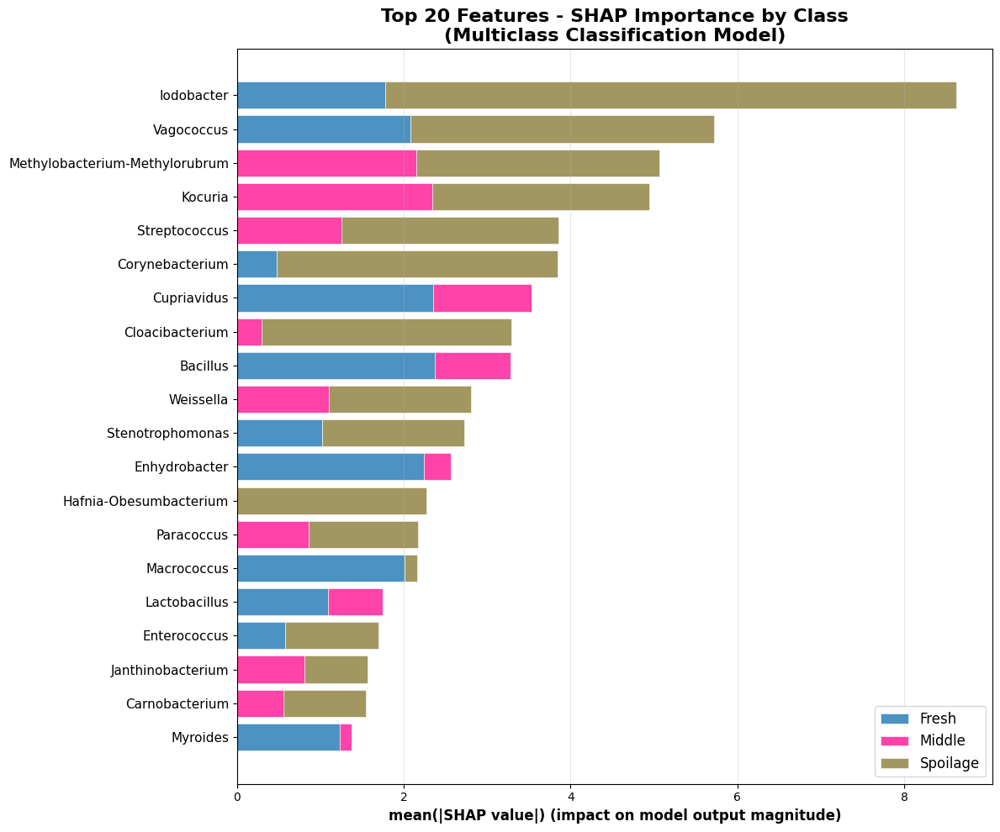

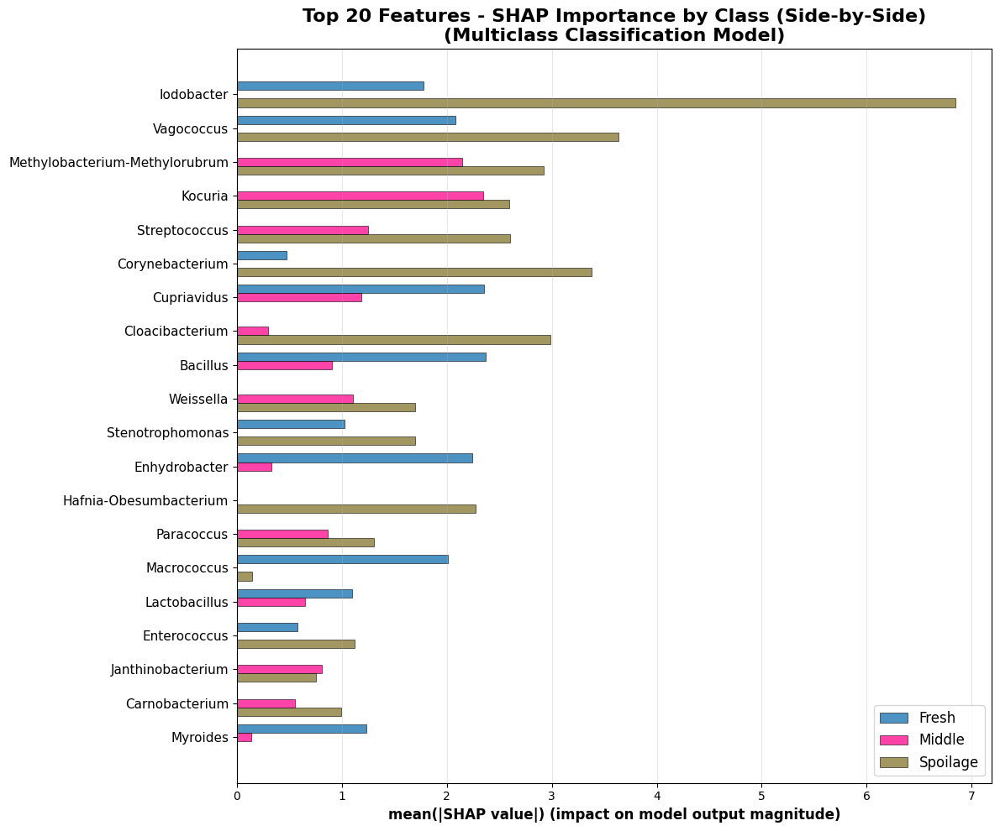

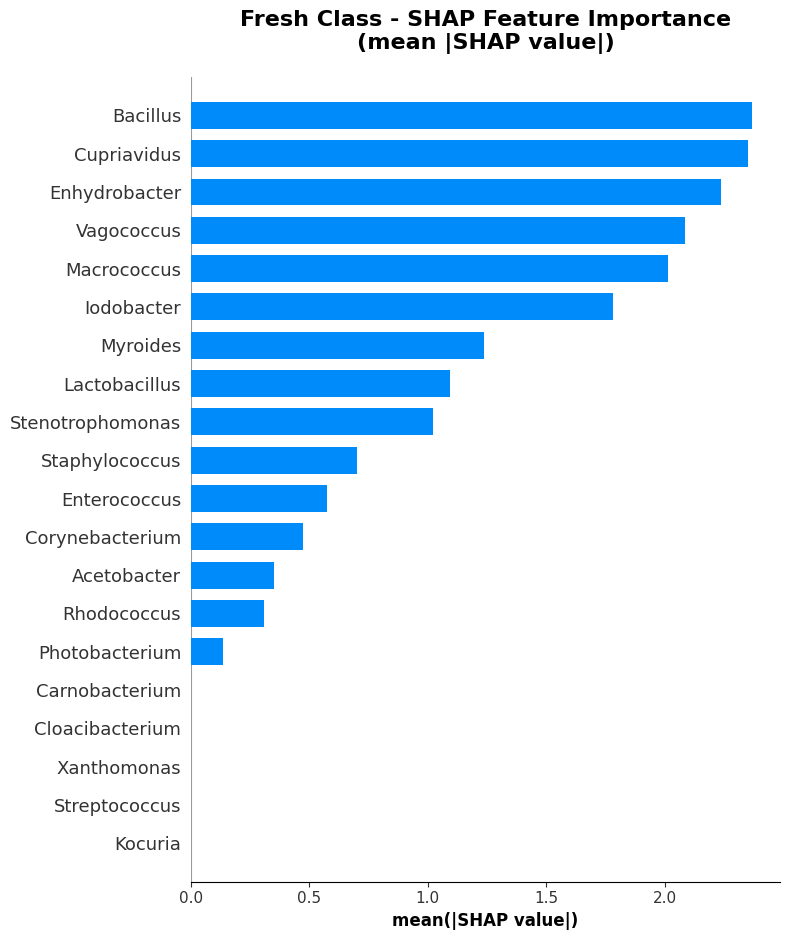

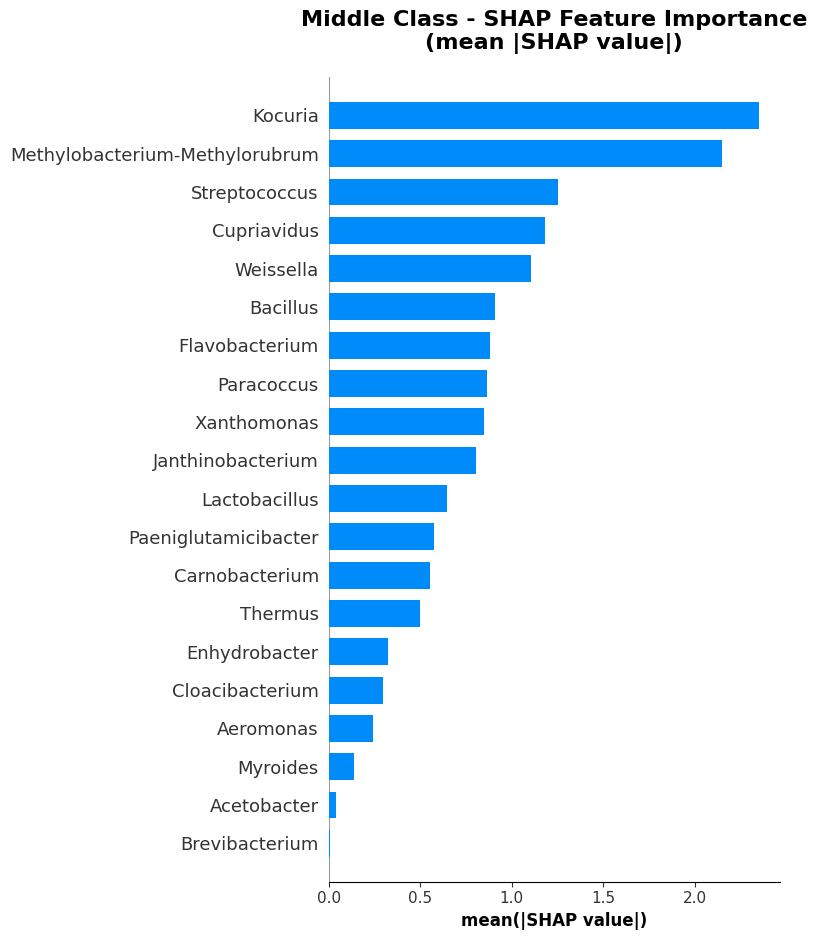

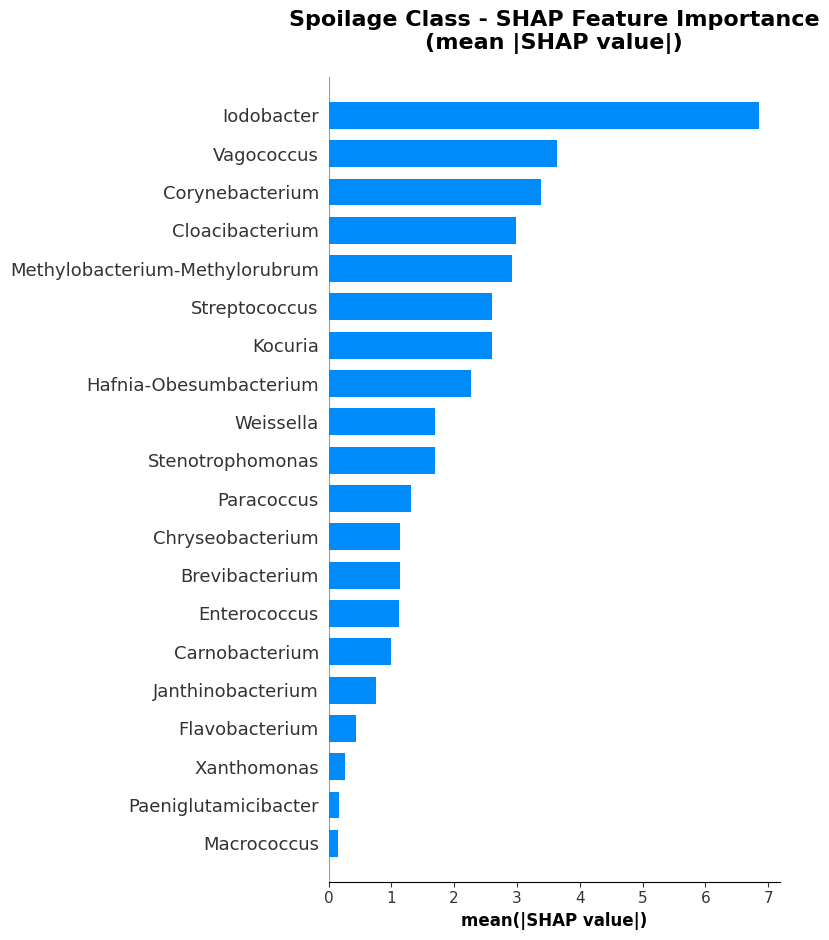


✅ 다중클래스 SHAP Bar Plot 생성 완료!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class_names = ['Fresh', 'Middle', 'Spoilage']

# SHAP 값과 데이터 확인
print(f"SHAP values shape: {shap_values.values.shape}")
print(f"X_test_df shape: {X_test_df.shape}")

# feature 이름 정리 (g__ 접두사 제거)
feature_names_short = [f.replace('g__', '') for f in X_test_df.columns]

# 🔥 다중클래스 SHAP Bar Plot (각 클래스별 구분)
print("\n" + "="*80)
print("📊 다중클래스 SHAP Bar Plot 생성")
print("="*80)

# 1. 클래스별 평균 절대 SHAP 값 계산
mean_abs_shap_by_class = np.abs(shap_values.values).mean(axis=0)  # (feature 수, 클래스 수)

# 2. 전체 평균 SHAP 값 (모든 클래스 통합)
overall_mean_shap = mean_abs_shap_by_class.mean(axis=1)  # 클래스별 평균의 평균

# 3. 상위 20개 feature 선택 (전체 평균 기준)
top_20_idx = np.argsort(overall_mean_shap)[-20:][::-1]
top_20_features = [feature_names_short[i] for i in top_20_idx]
top_20_class_scores = mean_abs_shap_by_class[top_20_idx, :]  # (20, 3)

# 4. 이미지와 동일한 스타일의 Horizontal Stacked Bar Chart
fig, ax = plt.subplots(figsize=(12, 10))

y_pos = np.arange(len(top_20_features))
colors = ['#1f77b4', '#ff1493', '#8b7d3a']  # 파란색, 분홍색, 올리브색

# 각 클래스별로 누적 막대 그래프 생성
left_positions = np.zeros(len(top_20_features))

for class_idx in range(3):
    class_scores = top_20_class_scores[:, class_idx]
    bars = ax.barh(y_pos, class_scores, left=left_positions, 
                   color=colors[class_idx], alpha=0.8, 
                   label=class_names[class_idx], edgecolor='white', linewidth=0.5)
    left_positions += class_scores

# Y축 설정
ax.set_yticks(y_pos)
ax.set_yticklabels(top_20_features, fontsize=11)
ax.invert_yaxis()

# X축 및 제목 설정
ax.set_xlabel('mean(|SHAP value|) (impact on model output magnitude)', fontsize=12, fontweight='bold')
ax.set_title('Top 20 Features - SHAP Importance by Class\n(Multiclass Classification Model)', 
             fontsize=16, fontweight='bold')

# 범례 설정 (클래스 이름으로 변경)
ax.legend(fontsize=12, loc='lower right')

# 그리드 추가
ax.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# 5. 대안: 클래스별 개별 막대 그래프 (side-by-side)
fig, ax = plt.subplots(figsize=(12, 10))

bar_width = 0.25
y_pos = np.arange(len(top_20_features))

for class_idx in range(3):
    class_scores = top_20_class_scores[:, class_idx]
    bars = ax.barh(y_pos + bar_width * class_idx, class_scores, 
                   height=bar_width, color=colors[class_idx], alpha=0.8, 
                   label=class_names[class_idx], edgecolor='black', linewidth=0.5)

ax.set_yticks(y_pos + bar_width)
ax.set_yticklabels(top_20_features, fontsize=11)
ax.invert_yaxis()
ax.set_xlabel('mean(|SHAP value|) (impact on model output magnitude)', fontsize=12, fontweight='bold')
ax.set_title('Top 20 Features - SHAP Importance by Class (Side-by-Side)\n(Multiclass Classification Model)', 
             fontsize=16, fontweight='bold')
ax.legend(fontsize=12, loc='lower right')
ax.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# 6. SHAP 내장 함수를 사용한 클래스별 Bar Plot
for class_idx, class_name in enumerate(class_names):
    plt.figure(figsize=(10, 8))
    
    # 해당 클래스의 SHAP 값만 추출
    class_shap_values = shap_values.values[..., class_idx]
    
    shap.summary_plot(
        class_shap_values,
        X_test_df,
        feature_names=feature_names_short,
        max_display=20,
        plot_type="bar",
        show=False
    )
    
    plt.title(f'{class_name} Class - SHAP Feature Importance\n(mean |SHAP value|)', 
              fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('mean(|SHAP value|)', fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("\n✅ 다중클래스 SHAP Bar Plot 생성 완료!")

SHAP values shape: (54, 31, 3)
X_test_df shape: (54, 31)

🔥 분류 모델 SHAP 분석 - 모델 전체 중요도 (절대값 미적용)


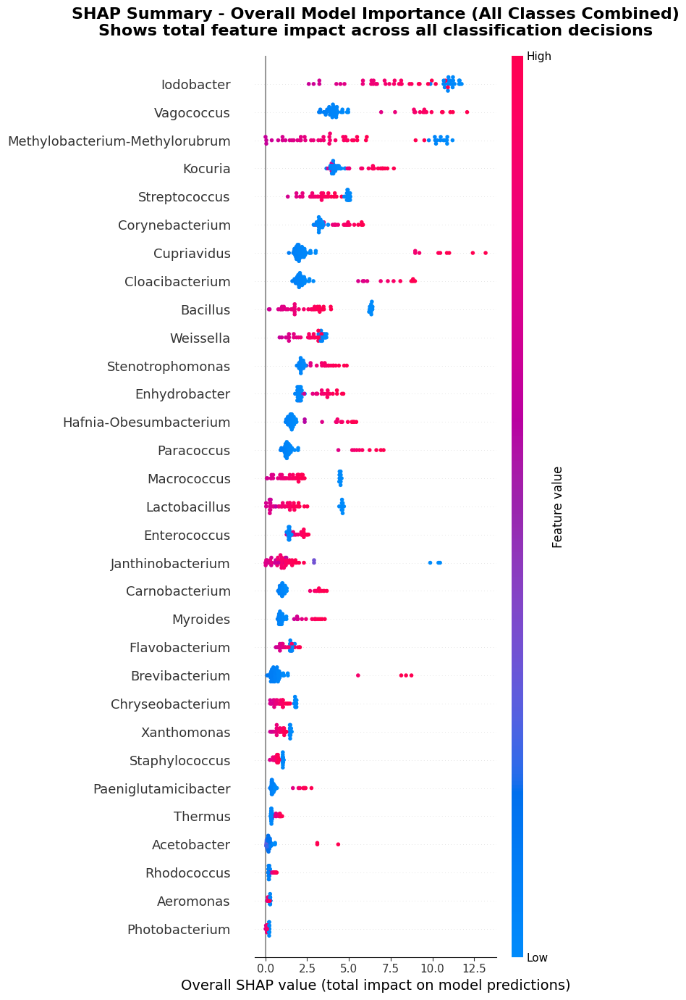

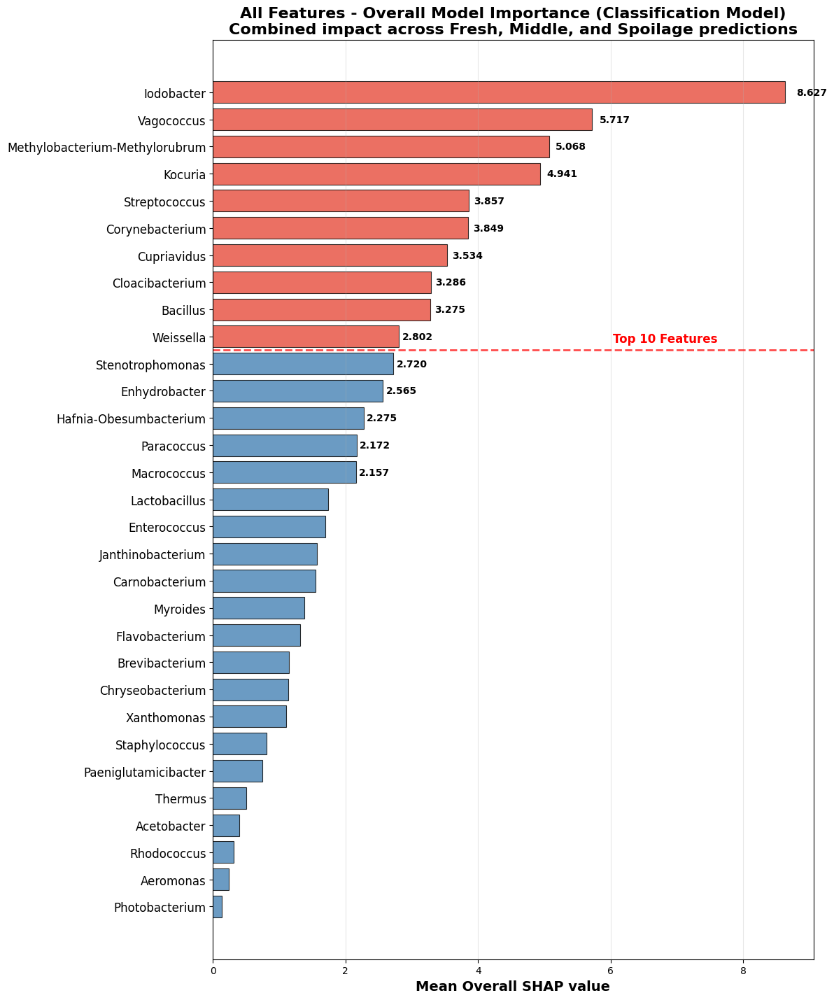

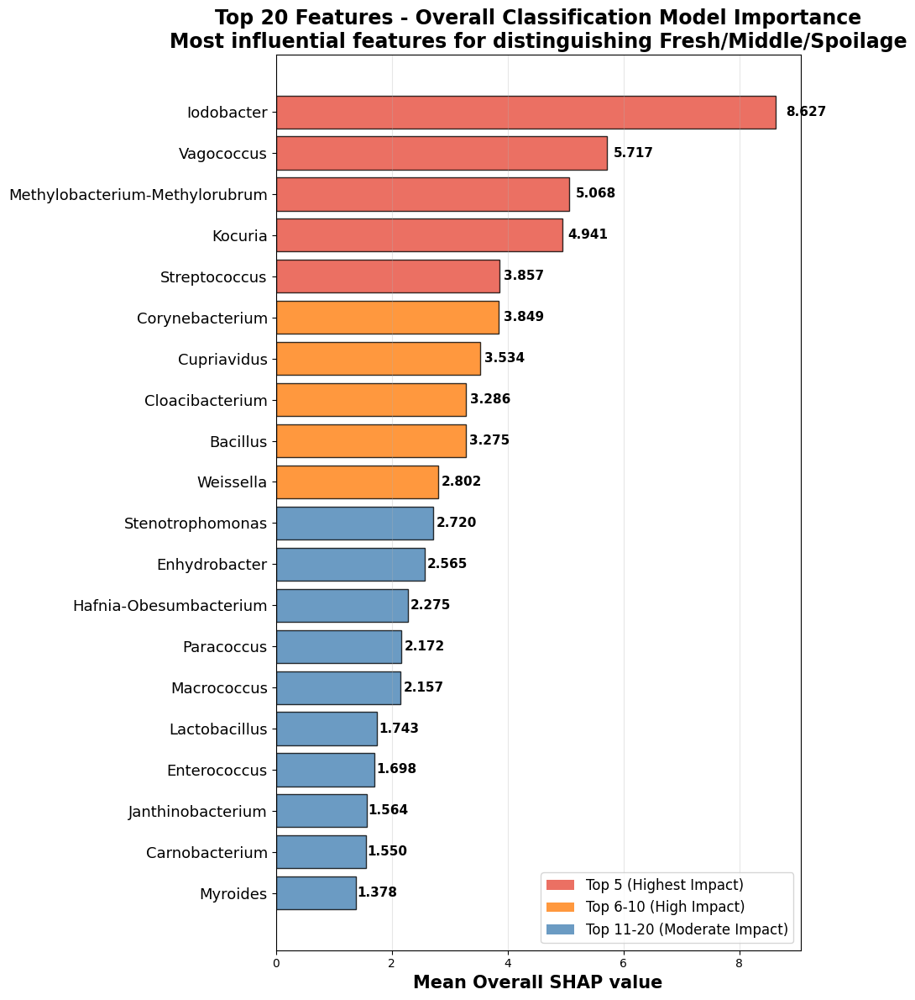

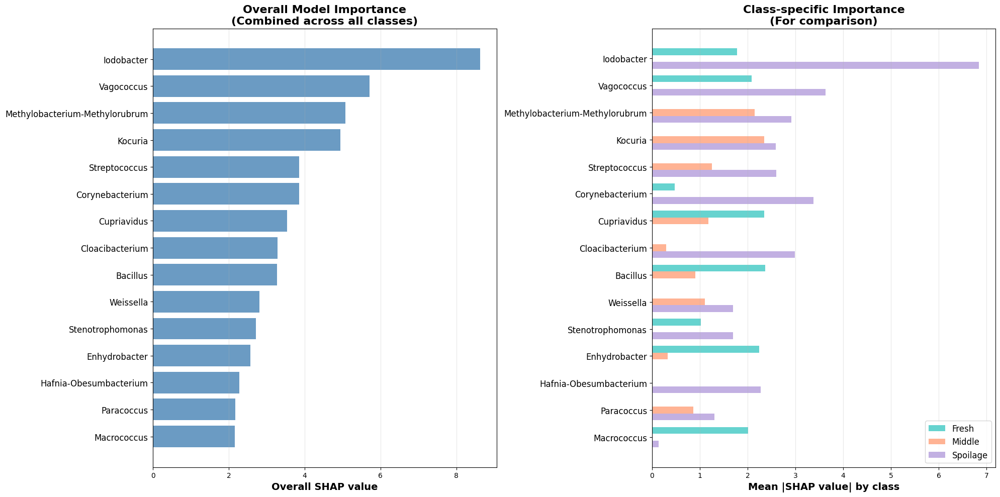


📊 전체 모델 SHAP 중요도 분석 요약

🏆 Top 10 Most Important Features for Overall Classification:
 1. Iodobacter                          | Overall SHAP: 8.6274
 2. Vagococcus                          | Overall SHAP: 5.7166
 3. Methylobacterium-Methylorubrum      | Overall SHAP: 5.0683
 4. Kocuria                             | Overall SHAP: 4.9409
 5. Streptococcus                       | Overall SHAP: 3.8567
 6. Corynebacterium                     | Overall SHAP: 3.8488
 7. Cupriavidus                         | Overall SHAP: 3.5341
 8. Cloacibacterium                     | Overall SHAP: 3.2864
 9. Bacillus                            | Overall SHAP: 3.2745
10. Weissella                           | Overall SHAP: 2.8021

📈 분석 결과:
  • 총 분석 feature 수: 31
  • 가장 중요한 feature: Iodobacter (8.6274)
  • 중요도 범위: 0.1343 ~ 8.6274
  • Top 5 평균: 5.6420
  • Top 10 평균: 4.4956
  • 전체 평균: 2.3426

🔍 해석:
  • 이 분석은 Fresh/Middle/Spoilage 구분에 가장 중요한 feature들을 보여줍니다
  • 값이 클수록 전체 분류 성능에 더 큰 영향을 미칩니다
  • 개별 클래스가 아닌 모델 전체의 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import shap

class_names = ['Fresh', 'Middle', 'Spoilage']

# SHAP 값과 데이터 확인
print(f"SHAP values shape: {shap_values.values.shape}")
print(f"X_test_df shape: {X_test_df.shape}")

# feature 이름 정리 (g__ 접두사 제거)
feature_names_short = [f.replace('g__', '') for f in X_test_df.columns]

print("\n" + "="*80)
print("🔥 분류 모델 SHAP 분석 - 모델 전체 중요도 (절대값 미적용)")
print("="*80)

# 모델 전체에 대한 SHAP 중요도 계산
# 각 클래스별 SHAP 값의 절대값을 모두 합쳐서 전체 모델 중요도로 계산
overall_shap_values = np.abs(shap_values.values).sum(axis=2)  # 클래스 차원을 합침
overall_mean_shap = overall_shap_values.mean(axis=0)  # 샘플별 평균

# 1. 전체 모델 SHAP Summary Plot (모든 클래스 통합)
plt.figure(figsize=(12, 15))
shap.summary_plot(
    overall_shap_values,
    X_test_df,
    feature_names=feature_names_short,
    max_display=len(feature_names_short),
    show=False
)
plt.title('SHAP Summary - Overall Model Importance (All Classes Combined)\n' +
          'Shows total feature impact across all classification decisions', 
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Overall SHAP value (total impact on model predictions)', fontsize=14)
plt.tight_layout()
plt.show()

# 2. 전체 모델 Feature Importance Bar Plot
sorted_idx = np.argsort(overall_mean_shap)[::-1]
sorted_features = [feature_names_short[i] for i in sorted_idx]
sorted_scores = overall_mean_shap[sorted_idx]

plt.figure(figsize=(12, len(sorted_features)*0.4 + 2))

# 상위 10개는 다른 색으로 강조
colors = ['#e74c3c' if i < 10 else 'steelblue' for i in range(len(sorted_features))]
bars = plt.barh(range(len(sorted_features)), sorted_scores,
                color=colors, alpha=0.8, edgecolor='black', linewidth=0.8)

# 값 표시 (상위 15개만)
for i, (bar, score) in enumerate(zip(bars[:15], sorted_scores[:15])):
    plt.text(score + score*0.02, bar.get_y() + bar.get_height()/2,
             f'{score:.3f}', ha='left', va='center', fontsize=10, fontweight='bold')

plt.yticks(range(len(sorted_features)), sorted_features, fontsize=12)
plt.xlabel('Mean Overall SHAP value', fontsize=14, fontweight='bold')
plt.title('All Features - Overall Model Importance (Classification Model)\n' +
          'Combined impact across Fresh, Middle, and Spoilage predictions', 
          fontsize=16, fontweight='bold')

# 구분선 추가 (상위 10개와 나머지)
if len(sorted_features) > 10:
    plt.axhline(y=9.5, color='red', linestyle='--', linewidth=2, alpha=0.7)
    plt.text(max(sorted_scores)*0.7, 9.2, 'Top 10 Features', 
             fontsize=12, fontweight='bold', color='red')

plt.grid(True, alpha=0.3, axis='x')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# 3. 상위 20개 Feature만 따로 시각화
top_20_idx = sorted_idx[:20]
top_20_features = [feature_names_short[i] for i in top_20_idx]
top_20_scores = overall_mean_shap[top_20_idx]

plt.figure(figsize=(10, 12))
colors_top20 = ['#e74c3c' if i < 5 else '#ff7f0e' if i < 10 else 'steelblue' 
                for i in range(len(top_20_features))]
bars = plt.barh(range(len(top_20_features)), top_20_scores,
                color=colors_top20, alpha=0.8, edgecolor='black', linewidth=1)

# 모든 값 표시
for i, (bar, score) in enumerate(zip(bars, top_20_scores)):
    plt.text(score + score*0.02, bar.get_y() + bar.get_height()/2,
             f'{score:.3f}', ha='left', va='center', fontsize=11, fontweight='bold')

plt.yticks(range(len(top_20_features)), top_20_features, fontsize=13)
plt.xlabel('Mean Overall SHAP value', fontsize=15, fontweight='bold')
plt.title('Top 20 Features - Overall Classification Model Importance\n' +
          'Most influential features for distinguishing Fresh/Middle/Spoilage', 
          fontsize=17, fontweight='bold')

# 범례 추가
legend_elements = [
    plt.Rectangle((0, 0), 1, 1, facecolor='#e74c3c', alpha=0.8, label='Top 5 (Highest Impact)'),
    plt.Rectangle((0, 0), 1, 1, facecolor='#ff7f0e', alpha=0.8, label='Top 6-10 (High Impact)'),
    plt.Rectangle((0, 0), 1, 1, facecolor='steelblue', alpha=0.8, label='Top 11-20 (Moderate Impact)')
]
plt.legend(handles=legend_elements, loc='lower right', fontsize=12)

plt.grid(True, alpha=0.3, axis='x')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# 4. 전체 모델 중요도 vs 클래스별 중요도 비교 (상위 15개만)
top_15_idx = sorted_idx[:15]
top_15_features = [feature_names_short[i] for i in top_15_idx]

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# 왼쪽: 전체 모델 중요도
ax1 = axes[0]
bars1 = ax1.barh(range(len(top_15_features)), overall_mean_shap[top_15_idx],
                 color='steelblue', alpha=0.8)
ax1.set_yticks(range(len(top_15_features)))
ax1.set_yticklabels(top_15_features, fontsize=12)
ax1.invert_yaxis()
ax1.set_xlabel('Overall SHAP value', fontsize=14, fontweight='bold')
ax1.set_title('Overall Model Importance\n(Combined across all classes)', 
              fontsize=16, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')

# 오른쪽: 클래스별 중요도 (참고용)
ax2 = axes[1]
class_colors = ['#40c9c3', '#ffa07a', '#b39ddb']
mean_shap_by_class = np.abs(shap_values.values).mean(axis=0)  # (feature 수, 클래스 수)
y_pos = np.arange(len(top_15_features))
bar_width = 0.25

for class_idx, (class_name, color) in enumerate(zip(class_names, class_colors)):
    class_scores = mean_shap_by_class[top_15_idx, class_idx]
    ax2.barh(y_pos + bar_width*class_idx, class_scores, 
             height=bar_width, color=color, alpha=0.8, label=class_name)

ax2.set_yticks(y_pos + bar_width)
ax2.set_yticklabels(top_15_features, fontsize=12)
ax2.invert_yaxis()
ax2.set_xlabel('Mean |SHAP value| by class', fontsize=14, fontweight='bold')
ax2.set_title('Class-specific Importance\n(For comparison)', 
              fontsize=16, fontweight='bold')
ax2.legend(fontsize=12)
ax2.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# 5. 결과 요약 출력
print("\n" + "="*80)
print("📊 전체 모델 SHAP 중요도 분석 요약")
print("="*80)

print(f"\n🏆 Top 10 Most Important Features for Overall Classification:")
for i, (feature, score) in enumerate(zip(top_20_features[:10], top_20_scores[:10]), 1):
    print(f"{i:2d}. {feature:<35} | Overall SHAP: {score:.4f}")

print(f"\n📈 분석 결과:")
print(f"  • 총 분석 feature 수: {len(feature_names_short)}")
print(f"  • 가장 중요한 feature: {sorted_features[0]} ({sorted_scores[0]:.4f})")
print(f"  • 중요도 범위: {sorted_scores[-1]:.4f} ~ {sorted_scores[0]:.4f}")
print(f"  • Top 5 평균: {np.mean(sorted_scores[:5]):.4f}")
print(f"  • Top 10 평균: {np.mean(sorted_scores[:10]):.4f}")
print(f"  • 전체 평균: {np.mean(sorted_scores):.4f}")

print(f"\n🔍 해석:")
print(f"  • 이 분석은 Fresh/Middle/Spoilage 구분에 가장 중요한 feature들을 보여줍니다")
print(f"  • 값이 클수록 전체 분류 성능에 더 큰 영향을 미칩니다")
print(f"  • 개별 클래스가 아닌 모델 전체의 판단력에 기여하는 정도입니다")

print("\n✅ 전체 모델 SHAP 중요도 분석 완료!")

## TBARS 분류 모델 학습 

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

# TBARS 라벨링 함수 (임계값 반영)
def tbars_labeling(tbars_series):
    return np.where(
        tbars_series < 0.189, 0,
        np.where(tbars_series < 0.289, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

# 모델 및 파라미터 그리드 정의 (기존과 동일)
model_configs = {
    "RandomForest": {
        "model": RandomForestClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "min_samples_split": [2, 5]
        }
    },
    "XGBoost": {
        "model": XGBClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "learning_rate": [0.05, 0.1]
        }
    },
    "SVC": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('svc', SVC(probability=True, class_weight="balanced"))
        ]),
        "params": {
            "svc__C": [0.5, 1, 2],
            "svc__gamma": ["scale", "auto"],
            "svc__kernel": ["rbf"]
        }
    },
    "LogisticRegression": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('lr', LogisticRegression())
        ]),
        "params": {
            "lr__penalty": ["elasticnet"],
            "lr__solver": ["saga"],
            "lr__l1_ratio": [0.2, 0.5, 0.8],
            "lr__C": [0.5, 1, 2],
            "lr__max_iter": [500],
            "lr__class_weight": ["balanced"],
            "lr__multi_class": ["multinomial"]
        }
    },
    "KNN": {
        "model": KNeighborsClassifier,
        "params": {
            "n_neighbors": [3, 5, 7],
            "weights": ["uniform", "distance"]
        }
    }
}

taxonomy_levels = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

# TBARS 분류 모델 학습 (VIP>1.0 Feature만 사용)
all_model_results_tbars = {}

for level_name in taxonomy_levels:
    print(f"\n{'='*60}\n=== {level_name} Level 모델 학습 시작 (VIP>1.0 Feature, TBARS) ===\n{'='*60}")
    level_data = get_level_data(level_name)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X = level_data['features'][vip_features].values
    y = tbars_labeling(level_data['tbars'].values)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    all_model_results_tbars[level_name] = {}

    for model_name, config in model_configs.items():
        print(f"\n--- {model_name} 학습 ---")
        model = config["model"]() if callable(config["model"]) else config["model"]()
        param_grid = config["params"]

        grid = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
        grid.fit(X_train, y_train)

        best_model = grid.best_estimator_
        best_params = grid.best_params_

        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)

        train_acc = accuracy_score(y_train, y_train_pred)
        test_acc = accuracy_score(y_test, y_test_pred)
        train_f1 = f1_score(y_train, y_train_pred, average='macro')
        test_f1 = f1_score(y_test, y_test_pred, average='macro')
        overfit_acc = train_acc - test_acc
        overfit_f1 = train_f1 - test_f1

        all_model_results_tbars[level_name][model_name] = {
            "train_accuracy": train_acc,
            "test_accuracy": test_acc,
            "train_f1_score": train_f1,
            "test_f1_score": test_f1,
            "Overfitting_Acc": overfit_acc,
            "Overfitting_F1": overfit_f1,
            "Best_Params": best_params,
            "Best_Model": best_model,
            "GridSearchCV": grid,
            "X_test": X_test,
            "y_test": y_test
        }

        print(f"Train Acc: {train_acc:.3f}, Test Acc: {test_acc:.3f}")
        print(f"Train F1: {train_f1:.3f}, Test F1: {test_f1:.3f}")
        print(f"Overfitting Acc: {overfit_acc:.3f}, Overfitting F1: {overfit_f1:.3f}")
        print(f"Best Params: {best_params}")

print("\n=== 모든 모델 학습 및 평가 완료 ===")

# Confusion Matrix & ROC Curve (숫자 표기)
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

model_list = ["RandomForest", "XGBoost", "SVC", "LogisticRegression", "KNN"]
label_order = [0, 1, 2]  # Fresh(0), Middle(1), Decay(2)
label_names = ["Fresh(0)", "Middle(1)", "Decay(2)"]

for model in model_list:
    # 1. Confusion Matrix (3x2 subplot, 숫자 표기)
    fig_cm, axes_cm = plt.subplots(2, 3, figsize=(16, 10))
    axes_cm = axes_cm.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results_tbars or model not in all_model_results_tbars[level]:
            axes_cm[i].set_axis_off()
            continue
        best_model = all_model_results_tbars[level][model]["Best_Model"]
        X_test = all_model_results_tbars[level][model]["X_test"]
        y_test = all_model_results_tbars[level][model]["y_test"]
        y_pred = best_model.predict(X_test)
        cm = confusion_matrix(y_test, y_pred, labels=label_order)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes_cm[i], cbar=False,
                    xticklabels=label_names, yticklabels=label_names, vmin=0)
        acc = accuracy_score(y_test, y_pred)
        f1m = f1_score(y_test, y_pred, average='macro')
        axes_cm[i].set_title(f"{model} - {level}\nAcc: {acc:.3f}, F1M: {f1m:.3f}")
        axes_cm[i].set_xlabel("Predicted Label")
        axes_cm[i].set_ylabel("True Label")
    axes_cm[5].axis('off')
    plt.suptitle(f"{model} - Confusion Matrix (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # 2. ROC Curve (3x2 subplot, 숫자 표기)
    fig_roc, axes_roc = plt.subplots(2, 3, figsize=(16, 10))
    axes_roc = axes_roc.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results_tbars or model not in all_model_results_tbars[level]:
            axes_roc[i].set_axis_off()
            continue
        best_model = all_model_results_tbars[level][model]["Best_Model"]
        X_test = all_model_results_tbars[level][model]["X_test"]
        y_test = all_model_results_tbars[level][model]["y_test"]
        y_test_bin = label_binarize(y_test, classes=label_order)
        y_score = best_model.predict_proba(X_test) if hasattr(best_model, "predict_proba") else None
        ax = axes_roc[i]
        if y_score is not None:
            for j in range(3):
                fpr, tpr, _ = roc_curve(y_test_bin[:, j], y_score[:, j])
                roc_auc = auc(fpr, tpr)
                ax.plot(fpr, tpr, label=f"{label_names[j]} (AUC={roc_auc:.2f})")
            ax.plot([0, 1], [0, 1], 'k--', lw=1)
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f"{model} - {level} ROC")
            ax.legend(loc="lower right")
        else:
            ax.text(0.5, 0.5, "No predict_proba", ha='center', va='center')
            ax.set_axis_off()
    axes_roc[5].axis('off')
    plt.suptitle(f"{model} - ROC Curve (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


=== Phylum Level 모델 학습 시작 (VIP>1.0 Feature, TBARS) ===

--- RandomForest 학습 ---
Train Acc: 0.648, Test Acc: 0.611
Train F1: 0.538, Test F1: 0.447
Overfitting Acc: 0.037, Overfitting F1: 0.092
Best Params: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 200}

--- XGBoost 학습 ---
Train Acc: 0.866, Test Acc: 0.481
Train F1: 0.860, Test F1: 0.441
Overfitting Acc: 0.384, Overfitting F1: 0.419
Best Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}

--- SVC 학습 ---
Train Acc: 0.583, Test Acc: 0.593
Train F1: 0.538, Test F1: 0.546
Overfitting Acc: -0.009, Overfitting F1: -0.008
Best Params: {'svc__C': 0.5, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}

--- LogisticRegression 학습 ---


/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_cla

Train Acc: 0.556, Test Acc: 0.630
Train F1: 0.520, Test F1: 0.611
Overfitting Acc: -0.074, Overfitting F1: -0.091
Best Params: {'lr__C': 1, 'lr__class_weight': 'balanced', 'lr__l1_ratio': 0.2, 'lr__max_iter': 500, 'lr__multi_class': 'multinomial', 'lr__penalty': 'elasticnet', 'lr__solver': 'saga'}

--- KNN 학습 ---
Train Acc: 0.667, Test Acc: 0.556
Train F1: 0.638, Test F1: 0.504
Overfitting Acc: 0.111, Overfitting F1: 0.134
Best Params: {'n_neighbors': 5, 'weights': 'uniform'}

=== Class Level 모델 학습 시작 (VIP>1.0 Feature, TBARS) ===

--- RandomForest 학습 ---


KeyboardInterrupt: 

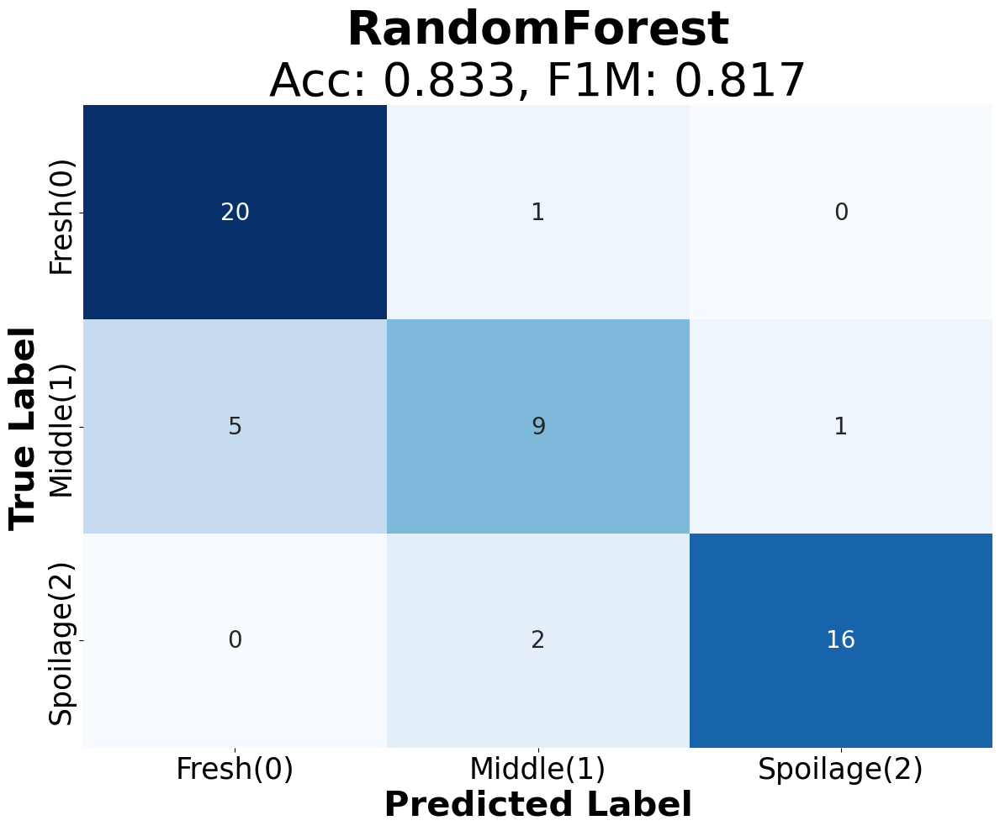

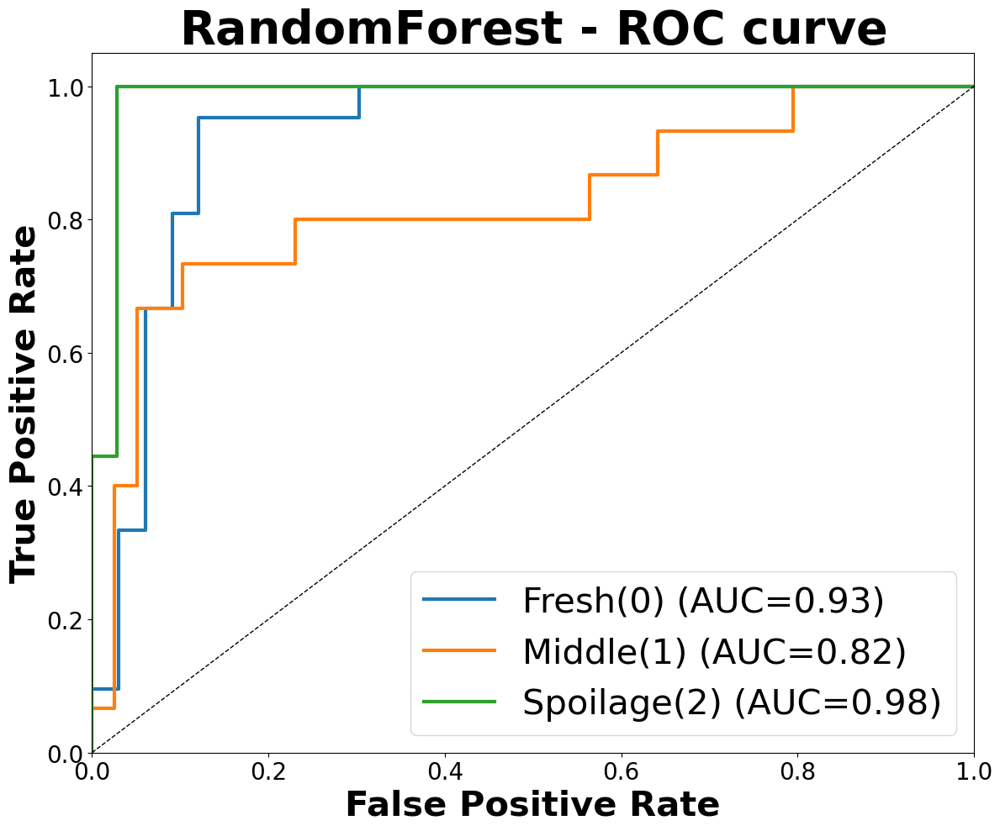

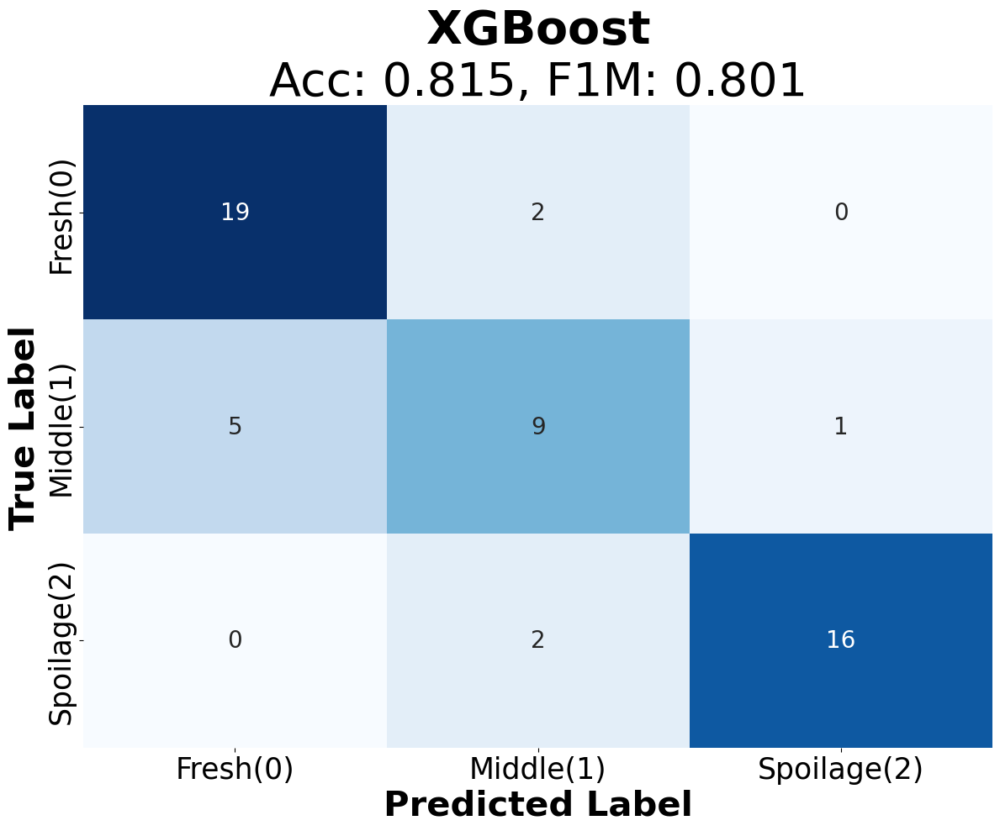

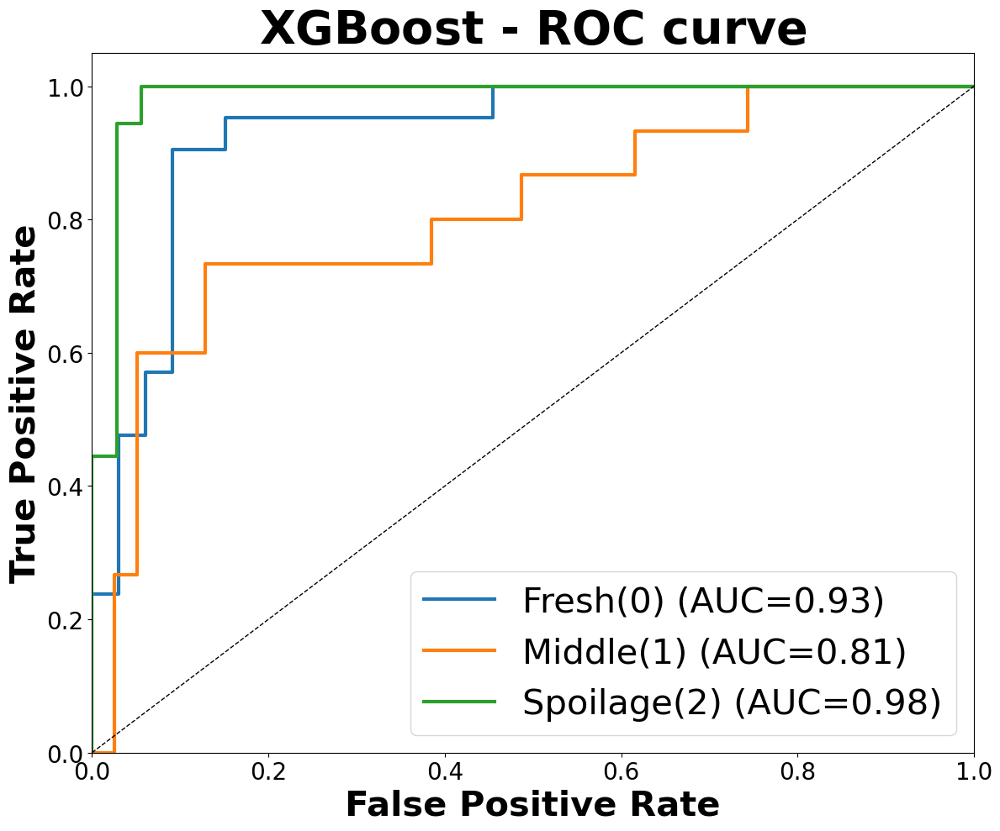

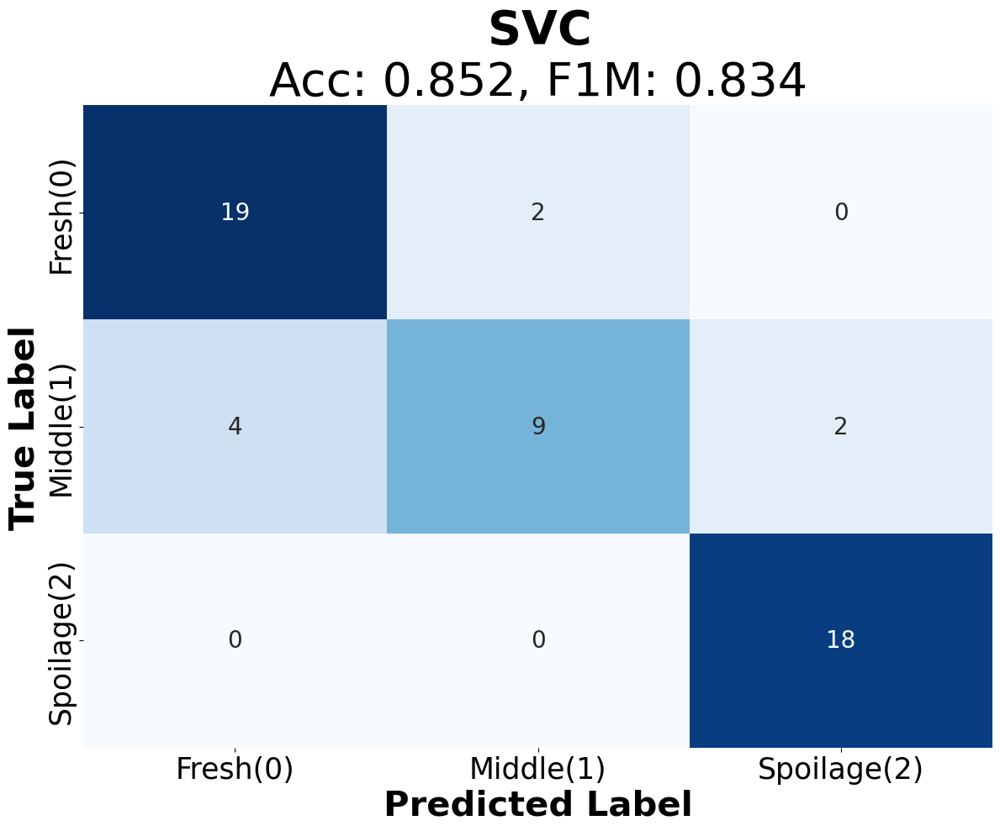

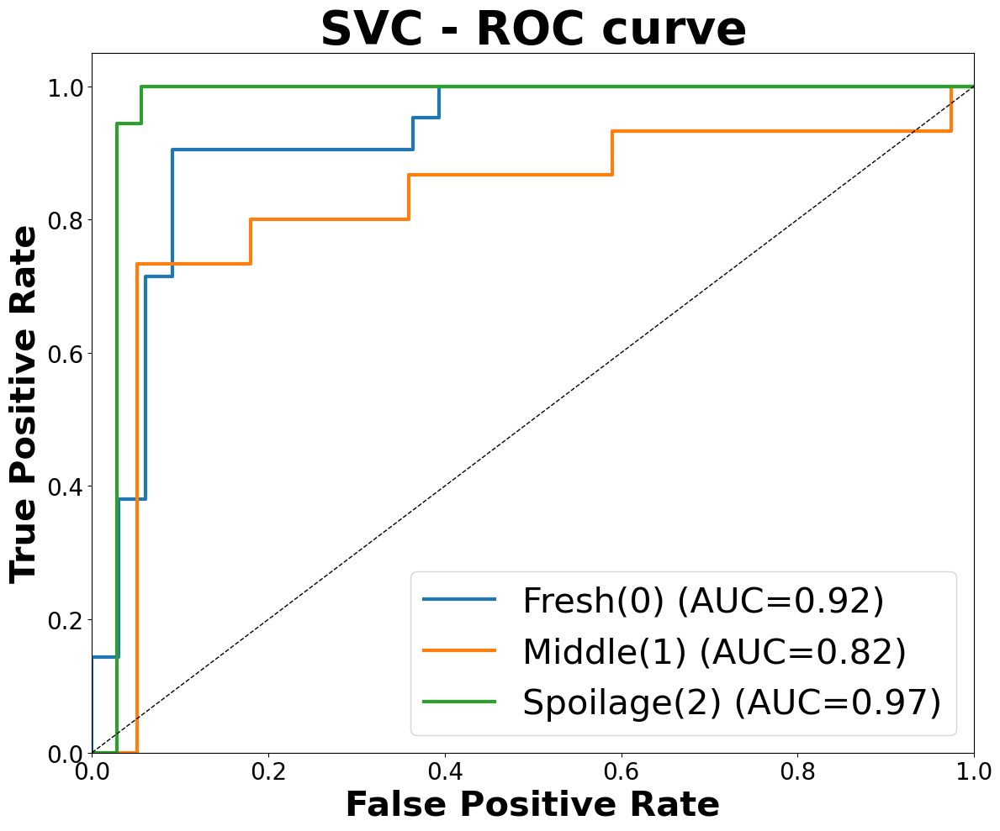

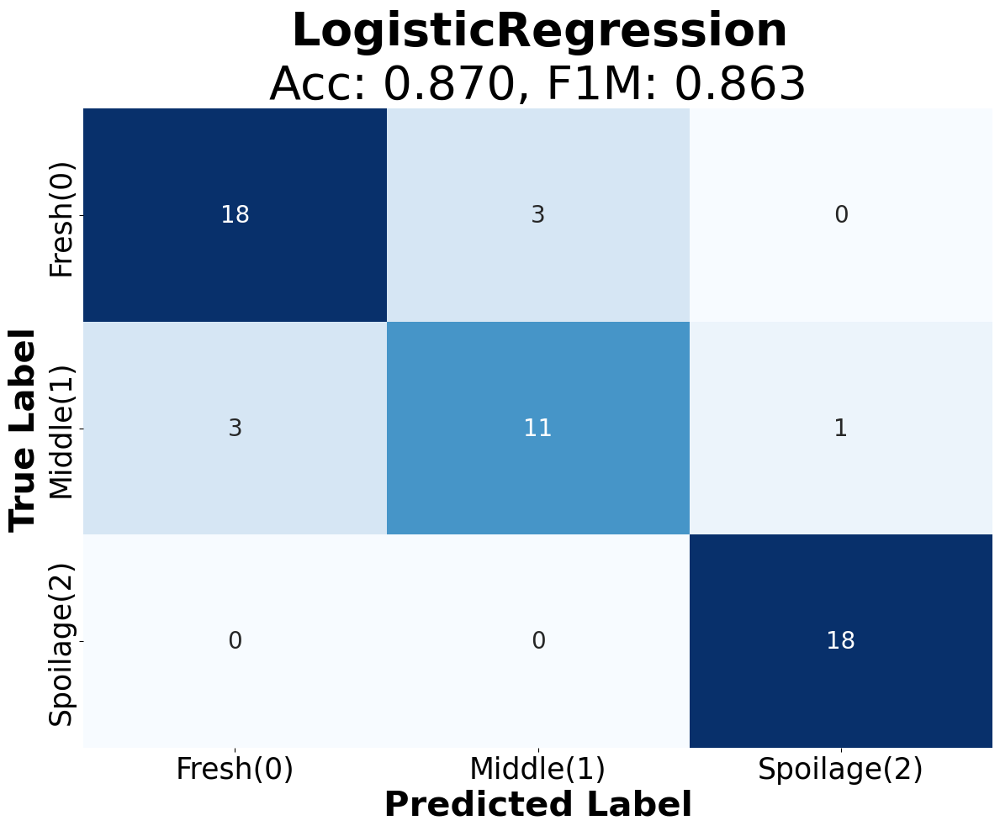

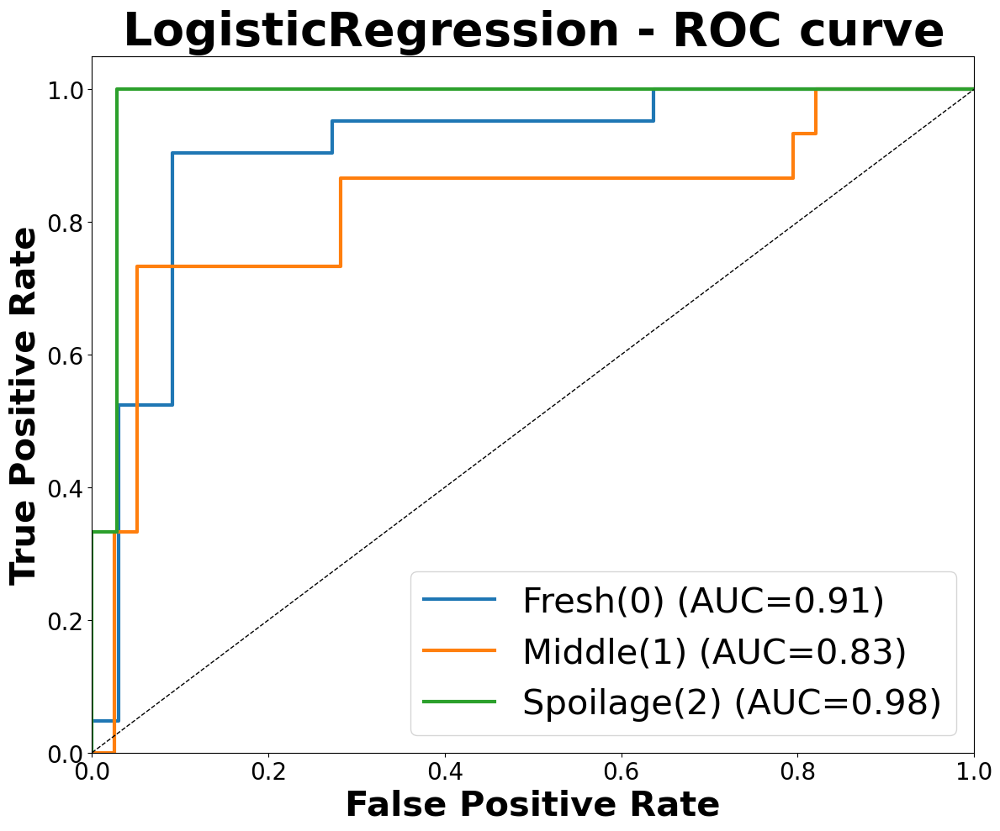

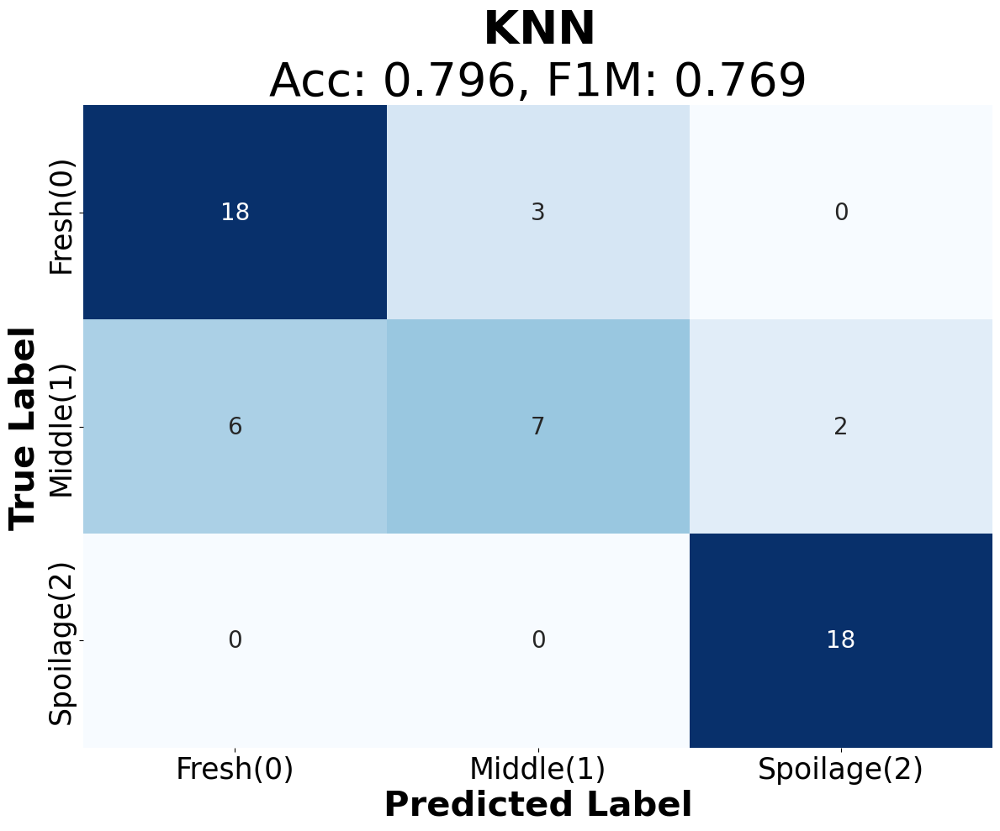

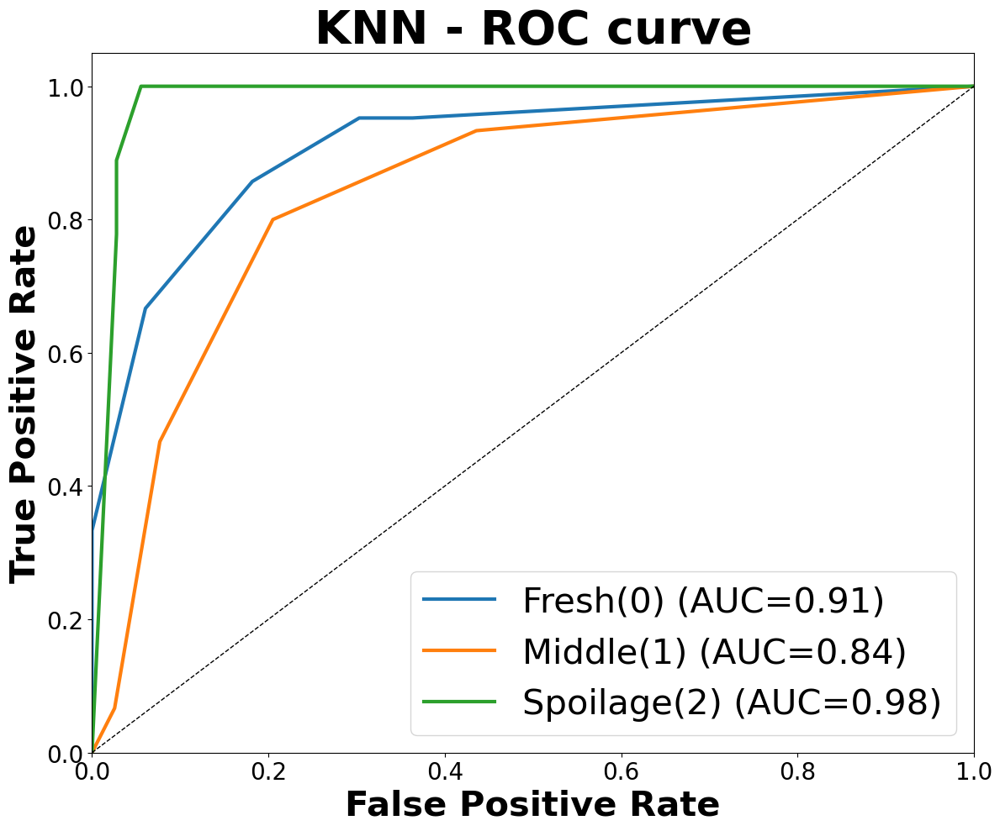

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

model_list = ["RandomForest", "XGBoost", "SVC", "LogisticRegression", "KNN"]
label_order = [0, 1, 2]  # Fresh(0), Middle(1), Spoilage(2)
label_names = ["Fresh(0)", "Middle(1)", "Spoilage(2)"]  # Decay → Spoilage
taxonomy_level = 'Genus'  # Genus만 출력

for model in model_list:
    # 1. Confusion Matrix (Genus만)
    fig_cm, ax_cm = plt.subplots(1, 1, figsize=(12, 10))
    best_model = all_model_results[taxonomy_level][model]["Best_Model"]
    X_test = all_model_results[taxonomy_level][model]["X_test"]
    y_test = all_model_results[taxonomy_level][model]["y_test"]
    y_pred = best_model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred, labels=label_order)
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues", ax=ax_cm, cbar=False,
        xticklabels=label_names, yticklabels=label_names,
        annot_kws={"size": 20}
    )
    acc = accuracy_score(y_test, y_pred)
    f1m = f1_score(y_test, y_pred, average='macro')
    # 모델명만 bold, 성능은 일반
    ax_cm.set_title(
        f"$\\bf{{{model}}}$\nAcc: {acc:.3f}, F1M: {f1m:.3f}",
        fontsize=40
    )
    ax_cm.set_xlabel("Predicted Label", fontsize=30, fontweight='bold')
    ax_cm.set_ylabel("True Label", fontsize=30, fontweight='bold')
    ax_cm.tick_params(axis='x', labelsize=25)
    ax_cm.tick_params(axis='y', labelsize=25)
    plt.tight_layout()
    plt.show()

    # 2. ROC Curve (Genus만)
    fig_roc, ax_roc = plt.subplots(1, 1, figsize=(12, 10))
    y_test_bin = label_binarize(y_test, classes=label_order)
    y_score = best_model.predict_proba(X_test) if hasattr(best_model, "predict_proba") else None
    if y_score is not None:
        for j in range(3):
            fpr, tpr, _ = roc_curve(y_test_bin[:, j], y_score[:, j])
            roc_auc = auc(fpr, tpr)
            ax_roc.plot(fpr, tpr, label=f"{label_names[j]} (AUC={roc_auc:.2f})", linewidth=3)
        ax_roc.plot([0, 1], [0, 1], 'k--', lw=1)
        ax_roc.set_xlim([0.0, 1.0])
        ax_roc.set_ylim([0.0, 1.05])
        ax_roc.set_xlabel('False Positive Rate', fontsize=30, fontweight='bold')
        ax_roc.set_ylabel('True Positive Rate', fontsize=30, fontweight='bold')
        # 모델명만 bold, 성능은 일반
        ax_roc.set_title(f"$\\bf{{{model}}}$ - ROC curve", fontsize=40, fontweight='bold')
        ax_roc.legend(loc="lower right", fontsize=30)
    else:
        ax_roc.text(0.5, 0.5, "No predict_proba", ha='center', va='center', fontsize=20)
        ax_roc.set_axis_off()
    ax_roc.tick_params(axis='x', labelsize=20)
    ax_roc.tick_params(axis='y', labelsize=20)
    plt.tight_layout()
    plt.show()

## 모델학습 결과 엑셀 파일에 저장

In [ ]:
import os
import pandas as pd

def overfit_emoji(acc, f1):
    if abs(acc) < 0.15 and abs(f1) < 0.15:
        return "🟩 Low"
    elif abs(acc) < 0.3 and abs(f1) < 0.3:
        return "🟨 Caution"
    else:
        return "🟥 High"

# 디렉토리 생성
result_dir = "model_result"
os.makedirs(result_dir, exist_ok=True)

# TPC 결과 DataFrame 생성
model_order = ["RandomForest", "XGBoost", "SVC", "LogisticRegression", "KNN"]
taxonomy_order = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

result_rows_tpc = []
for level_name, model_dict in all_model_results.items():
    for model_name, res in model_dict.items():
        row = {
            "Model": model_name,
            "Level": level_name,
            "Train_Accuracy": res["train_accuracy"],
            "Test_Accuracy": res["test_accuracy"],
            "Train_F1_Macro": res["train_f1_score"],
            "Test_F1_Macro": res["test_f1_score"],
            "Overfitting_Acc": res["Overfitting_Acc"],
            "Overfitting_F1": res["Overfitting_F1"],
            "Best_Params": str(res["Best_Params"])
        }
        result_rows_tpc.append(row)

df_tpc = pd.DataFrame(result_rows_tpc)
df_tpc = df_tpc[[
    "Model", "Level", "Train_Accuracy", "Test_Accuracy", "Train_F1_Macro", "Test_F1_Macro", "Overfitting_Acc", "Overfitting_F1", "Best_Params"
]]

def overfit_flag(row):
    if abs(row["Overfitting_Acc"]) < 0.15 and abs(row["Overfitting_F1"]) < 0.15:
        return "🟩 Low"
    elif abs(row["Overfitting_Acc"]) < 0.3 and abs(row["Overfitting_F1"]) < 0.3:
        return "🟨 Caution"
    else:
        return "🟥 High"

df_tpc["Overfitting_Flag"] = df_tpc.apply(overfit_flag, axis=1)
df_tpc["Model"] = pd.Categorical(df_tpc["Model"], categories=model_order, ordered=True)
df_tpc["Level"] = pd.Categorical(df_tpc["Level"], categories=taxonomy_order, ordered=True)
df_tpc = df_tpc.sort_values(["Model", "Level"]).reset_index(drop=True)

# TBARS 결과 DataFrame 생성 (all_model_results_tbars 사용)
result_rows_tbars = []
for level_name, model_dict in all_model_results_tbars.items():
    for model_name, res in model_dict.items():
        row = {
            "Model": model_name,
            "Level": level_name,
            "Train_Accuracy": res["train_accuracy"],
            "Test_Accuracy": res["test_accuracy"],
            "Train_F1_Macro": res["train_f1_score"],
            "Test_F1_Macro": res["test_f1_score"],
            "Overfitting_Acc": res["Overfitting_Acc"],
            "Overfitting_F1": res["Overfitting_F1"],
            "Best_Params": str(res["Best_Params"])
        }
        result_rows_tbars.append(row)

df_tbars = pd.DataFrame(result_rows_tbars)
df_tbars = df_tbars[[
    "Model", "Level", "Train_Accuracy", "Test_Accuracy", "Train_F1_Macro", "Test_F1_Macro", "Overfitting_Acc", "Overfitting_F1", "Best_Params"
]]
df_tbars["Overfitting_Flag"] = df_tbars.apply(overfit_flag, axis=1)
df_tbars["Model"] = pd.Categorical(df_tbars["Model"], categories=model_order, ordered=True)
df_tbars["Level"] = pd.Categorical(df_tbars["Level"], categories=taxonomy_order, ordered=True)
df_tbars = df_tbars.sort_values(["Model", "Level"]).reset_index(drop=True)

# 엑셀로 시트1(TPC), 시트2(TBARS) 저장
excel_path = os.path.join(result_dir, "kmenas_vip_model_result.xlsx")
with pd.ExcelWriter(excel_path) as writer:
    df_tpc.to_excel(writer, sheet_name="TPC", index=False)
    df_tbars.to_excel(writer, sheet_name="TBARS", index=False)
print(f"VIP 모델 분류 결과가 '{excel_path}'에 [TPC], [TBARS] 시트로 저장되었습니다.")

VIP 모델 분류 결과가 'model_result/kmenas_vip_model_result.xlsx'에 [TPC], [TBARS] 시트로 저장되었습니다.


## relative abundace

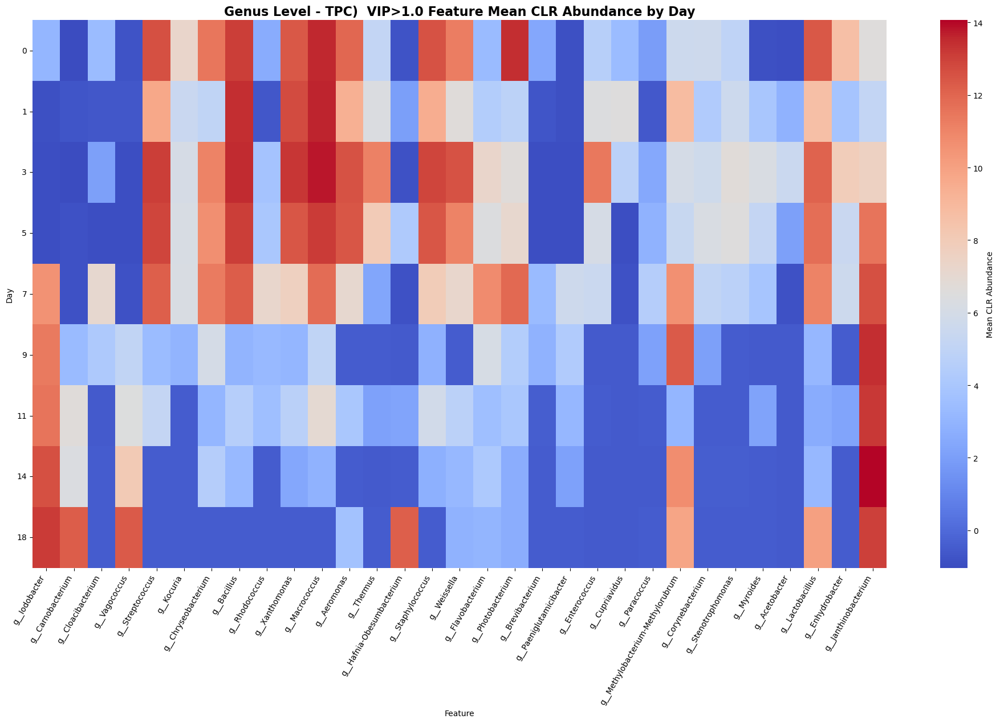

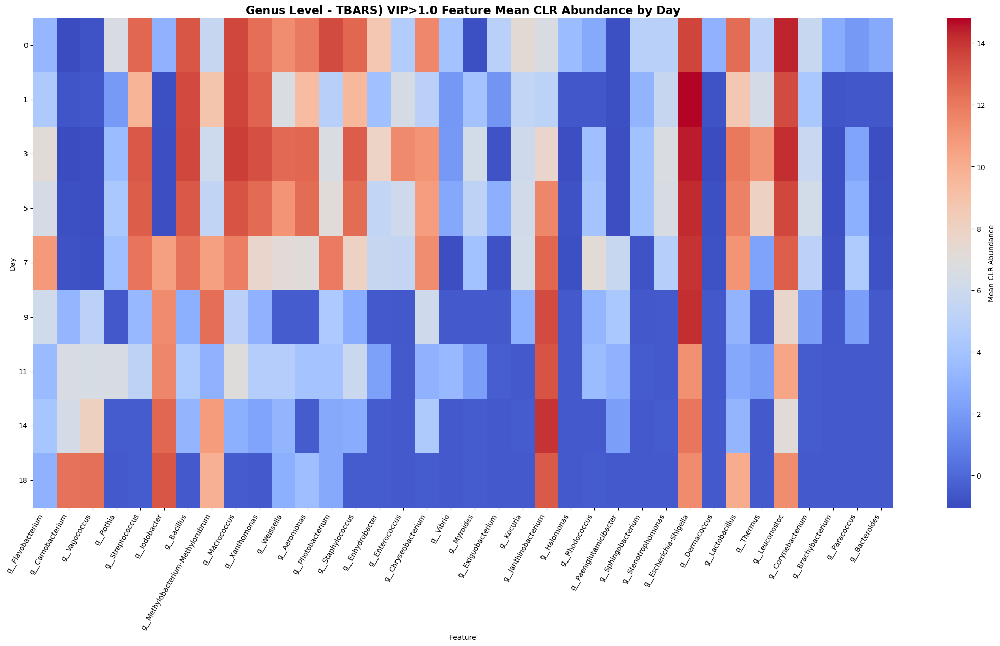

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Genus level 데이터 불러오기
level_name = 'Genus'
level_data = get_level_data(level_name)
if level_data is None:
    print(f"{level_name}: 데이터 없음, 스킵")
else:
    # Day 정보 추출
    df = level_data['data'].copy()
    df['Day'] = df['Description'].str.extract(r'A(\d+)', expand=False).astype(int)

    # TPC 기준 VIP > 1.0 feature
    vip_tpc_features = vip_over1_dict[level_name]['Feature'].tolist()
    # TBARS 기준 VIP > 1.0 feature
    vip_tbars_features = vip_score_tbars[level_name]['Feature'].tolist()

    # 1. TPC 기준 VIP > 1.0 feature heatmap
    if vip_tpc_features:
        plot_df_tpc = df[['Day'] + vip_tpc_features].groupby('Day').mean().sort_index()
        plt.figure(figsize=(0.5 * len(vip_tpc_features) + 4, 1.2 * len(plot_df_tpc) + 2))
        ax = sns.heatmap(
            plot_df_tpc,
            cmap='coolwarm',
            annot=False,
            cbar_kws={'label': 'Mean CLR Abundance'},
            xticklabels=vip_tpc_features,
            yticklabels=plot_df_tpc.index
        )
        plt.title("Genus Level - TPC)  VIP>1.0 Feature Mean CLR Abundance by Day", fontsize=16, fontweight='bold')
        plt.xlabel("Feature")
        plt.ylabel("Day")
        plt.xticks(rotation=60, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("TPC 기준 VIP > 1.0 feature 없음, 스킵")

    # 2. TBARS 기준 VIP > 1.0 feature heatmap
    if vip_tbars_features:
        plot_df_tbars = df[['Day'] + vip_tbars_features].groupby('Day').mean().sort_index()
        plt.figure(figsize=(0.5 * len(vip_tbars_features) + 4, 1.2 * len(plot_df_tbars) + 2))
        ax = sns.heatmap(
            plot_df_tbars,
            cmap='coolwarm',
            annot=False,
            cbar_kws={'label': 'Mean CLR Abundance'},
            xticklabels=vip_tbars_features,
            yticklabels=plot_df_tbars.index
        )
        plt.title("Genus Level - TBARS) VIP>1.0 Feature Mean CLR Abundance by Day", fontsize=16, fontweight='bold')
        plt.xlabel("Feature")
        plt.ylabel("Day")
        plt.xticks(rotation=60, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("TBARS 기준 VIP > 1.0 feature 없음, 스킵")